## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "scale_power"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [5]:
override = True
use_preds = False
save = True
show = True
scaler_name = "power"

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from MIST_reclassified_iso_full_data.csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


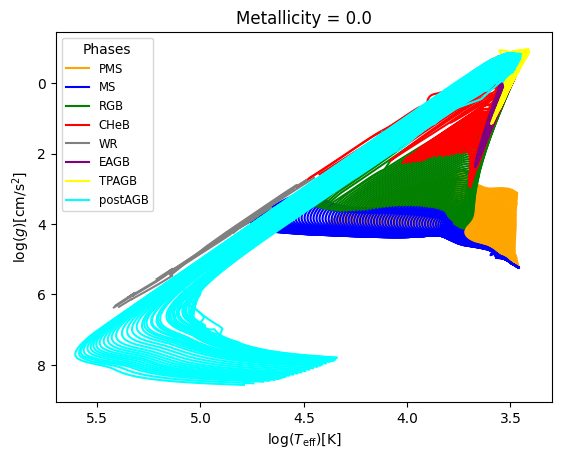

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
630600,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
630601,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
630602,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
630603,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


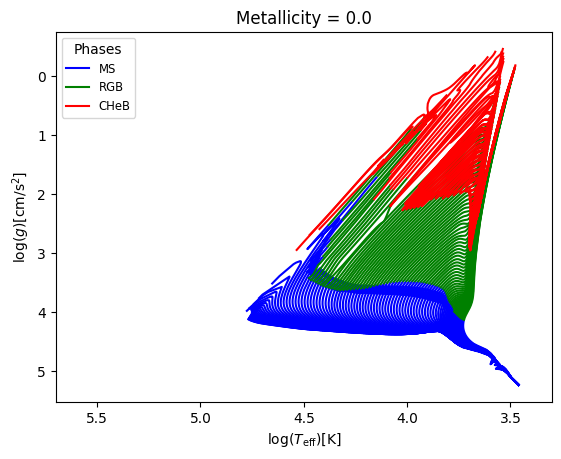

In [9]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [10]:
print_all_uniques(phase_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.1154, Median : 8.15

log_Teff  : Range : 3.34 - 5.3788, Mean : 4.0283, Median : 3.9761

log_g  : Range : -1.08 - 6.2594, Mean : 3.5075, Median : 3.8521

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 298.5448, Mean : 11.4145, Median : 2.8996

log_R  : Range : -1.0 - 3.1298, Mean : 0.735, Median : 0.7005



In [11]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 5.378801600728572
Median value in train data for the log_Teff parameter: 3.976722754899366
Mean value in train data for the log_Teff parameter: 4.028639708216513

Range in train data for the log_g parameter : -1.0828963170617296 - 6.259434356871683
Median value in train data for the log_g parameter: 3.852761890388139
Mean value in train data for the log_g parameter: 3.508503471076473

Range in train data for the log_R parameter : -0.9974628481553472 - 3.129269620812593
Median value in train data for the log_R parameter: 0.7005259212303901
Mean value in train data for the log_R parameter: 0.7346615625058007

Testing set statistics:
Range in test data for the log_Teff parameter : 3.3447003632081813 - 5.3787504733463445
Median value in test data for the log_Teff parameter: 3.9741415586935043
Mean value in test data for the log_Teff parameter: 4.027301245585765

Range in test data for the log_g pa

## Model training

### Linear regression

In [12]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.8842253627890934
  RMSE :  0.1377006494389409
  MAE :  0.11618052231566958
  MedAE :  0.11947909907667453
  CORR :  0.9414995523610266
  MAX_ER :  0.6844171092270948
  Percentiles : 
    75th percentile :  0.15892445648140407
    90th percentile :  0.18752782865833986
    95th percentile :  0.21167254428384943
    99th percentile :  0.38906288594439986

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.795925569215073
  RMSE :  0.15063398256198407
  MAE :  0.11262410893154079
  MedAE :  0.08899850138642851
  CORR :  0.8921924965928406
  MAX_ER :  0.6570190556762419
  Percentiles : 
    75th percentile :  0.14341971419185828
    90th percentile :  0.23804052334394496
    95th p

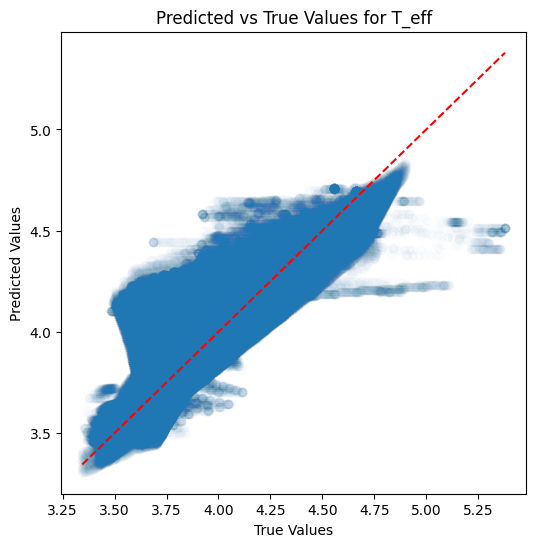

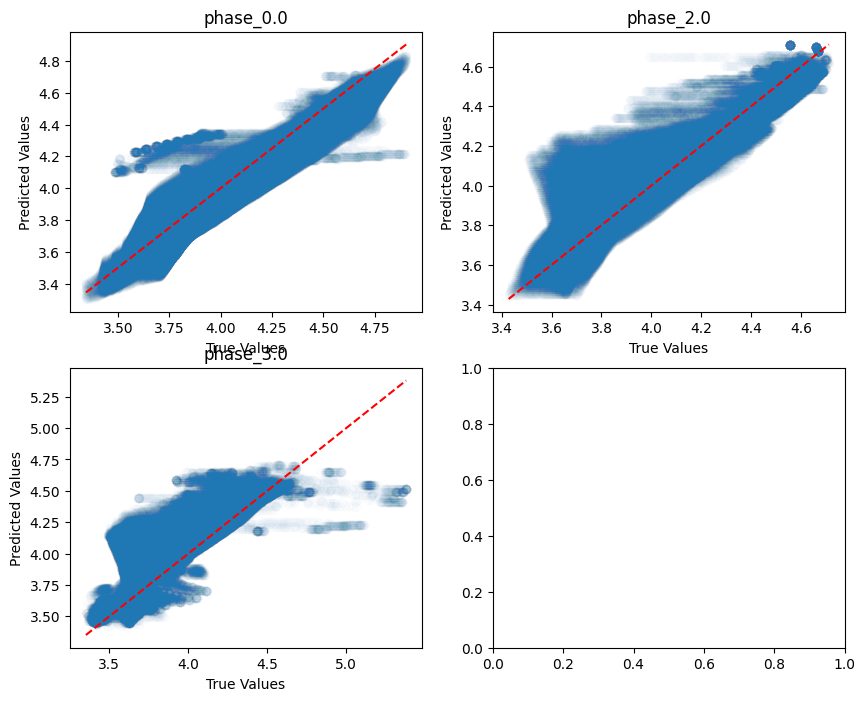

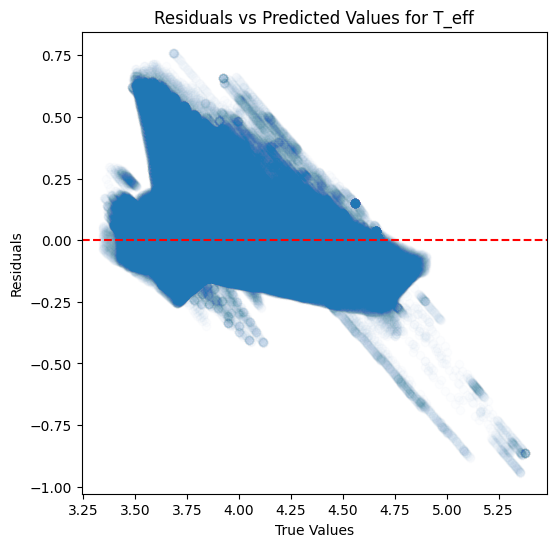

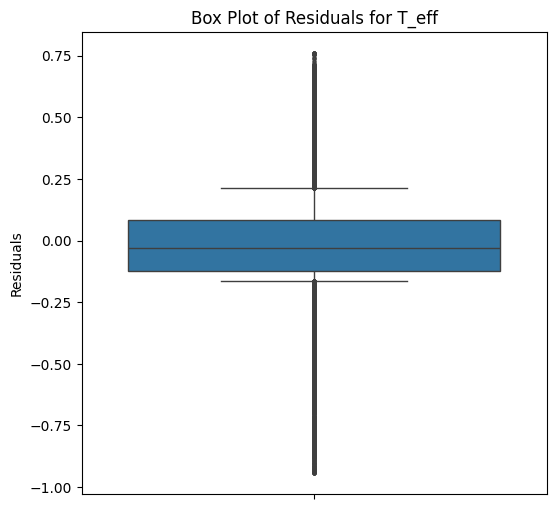

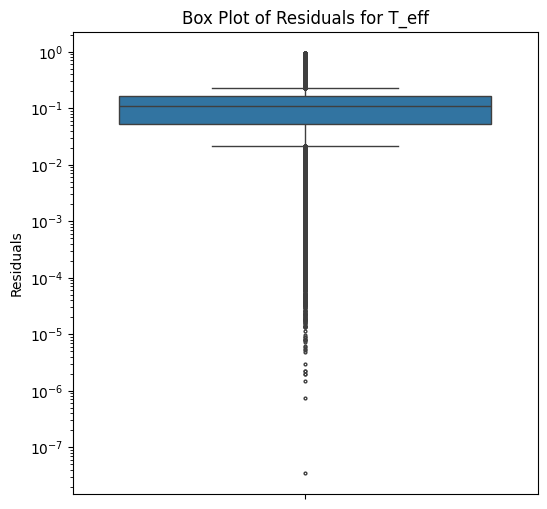

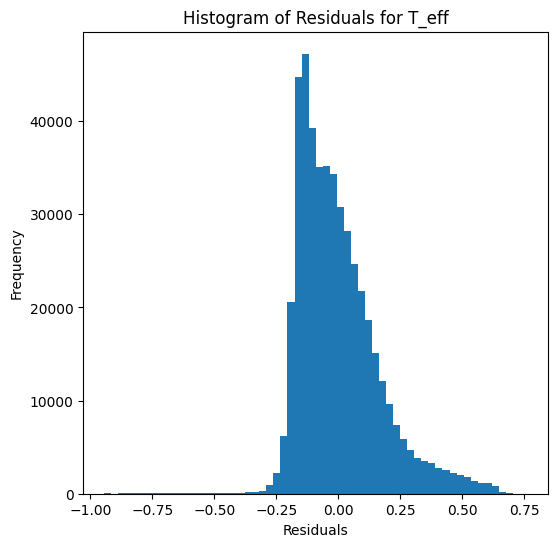

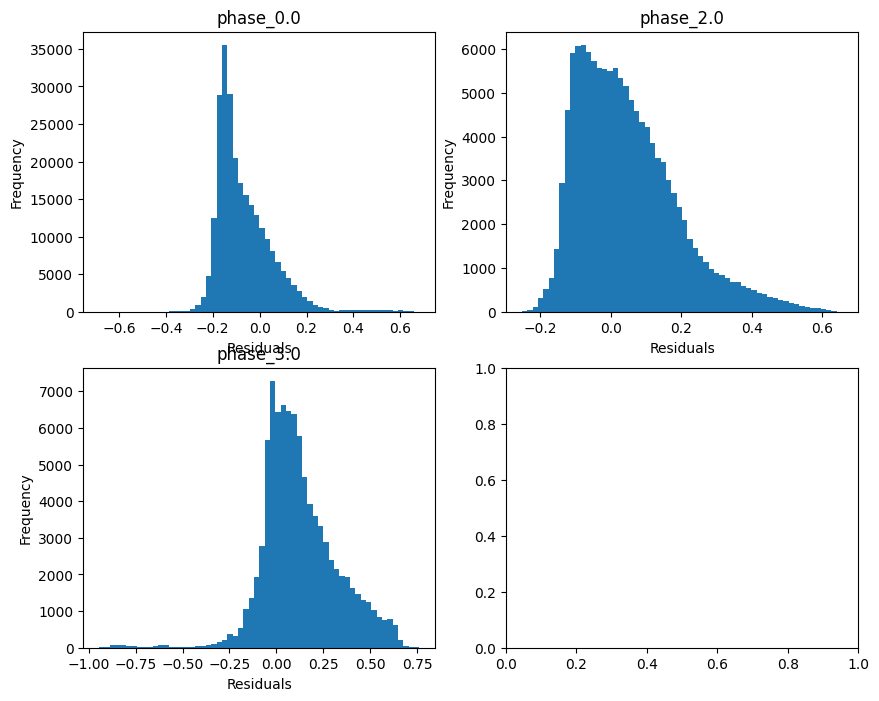

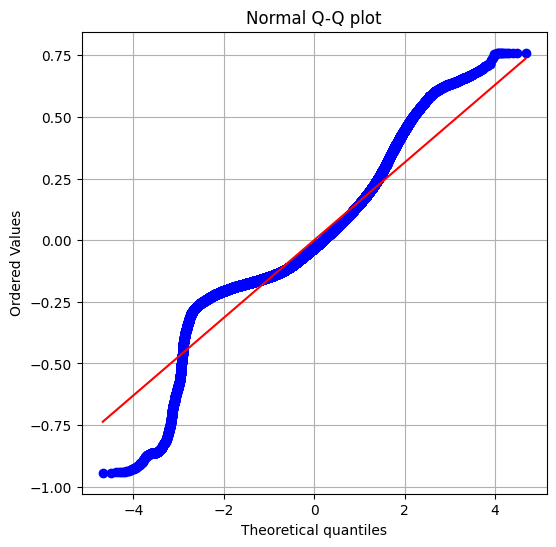

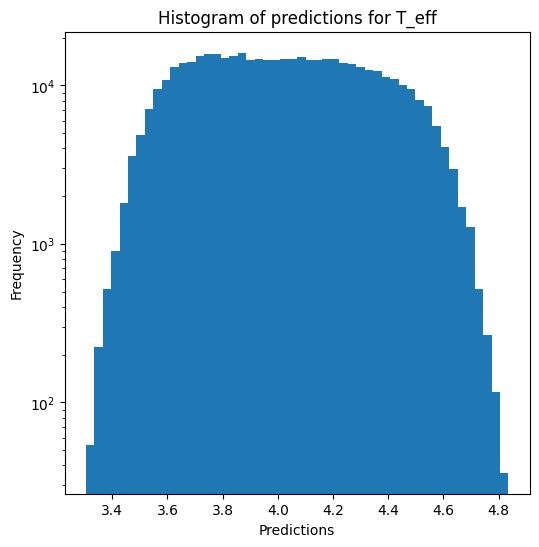

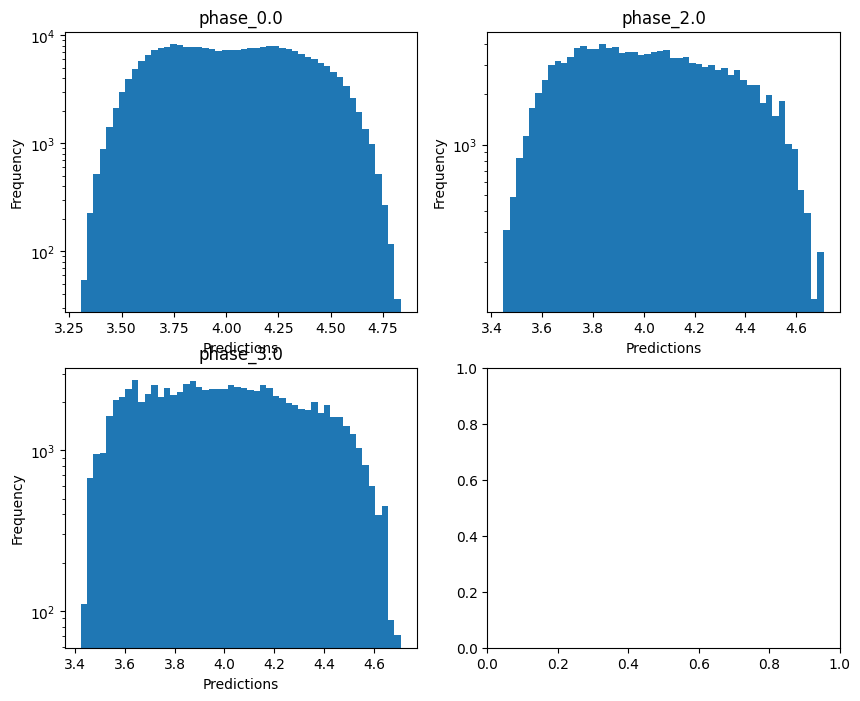

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  -0.12300587991780687
  RMSE :  0.8173150727325537
  MAE :  0.704135870782632
  MedAE :  0.6982983257312794
  CORR :  0.6361928696408995
  MAX_ER :  3.5061671728204025
  Percentiles : 
    75th percentile :  0.9087663868567288
    90th percentile :  1.2110044480979862
    95th percentile :  1.457175138373738
    99th percentile :  1.9329740684481576

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.16932552746124974
  RMSE :  0.8904214619009859
  MAE :  0.6805372562679577
  MedAE :  0.5160021219581785
  CORR :  0.4123851128974287
  MAX_ER :  2.8314716894450633
  Percentiles : 
    75th percentile :  0.9404525069852631
    90th percentile :  1.5676746966711101
    95th percentile :  1.9365810600340927
    99th percentile :  2.398183014380745

log_g results for the phase ca

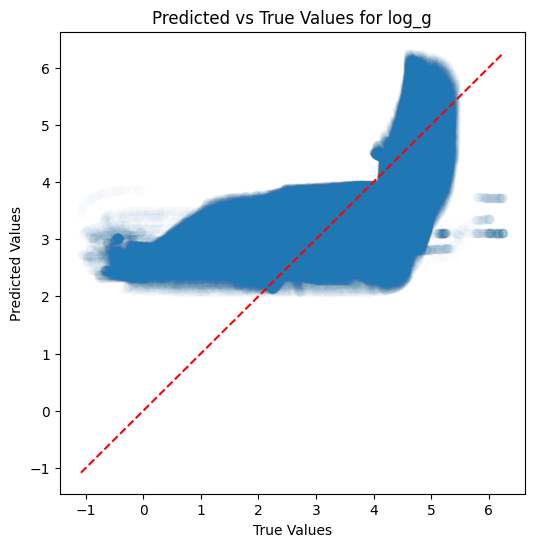

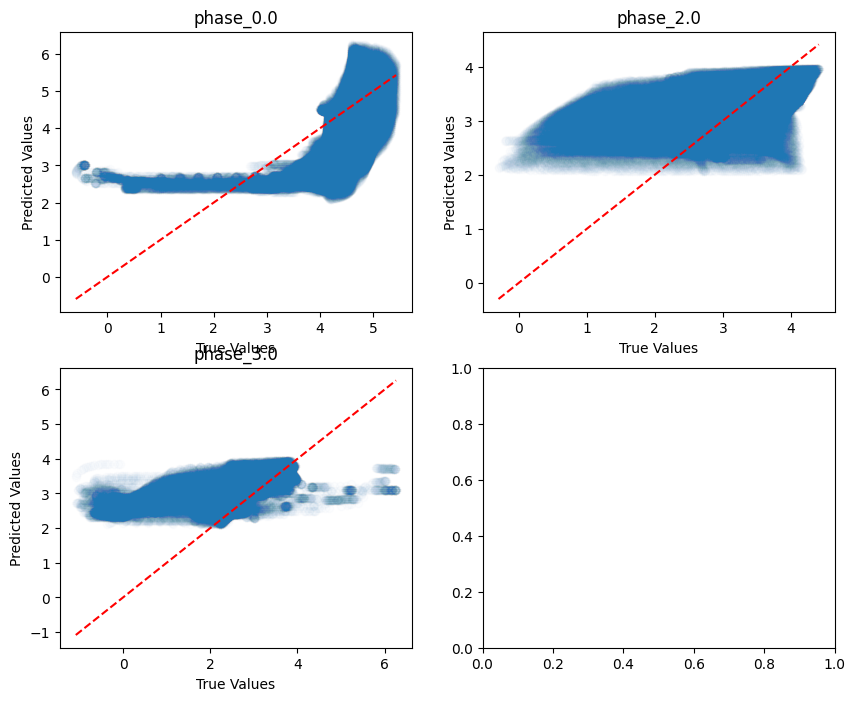

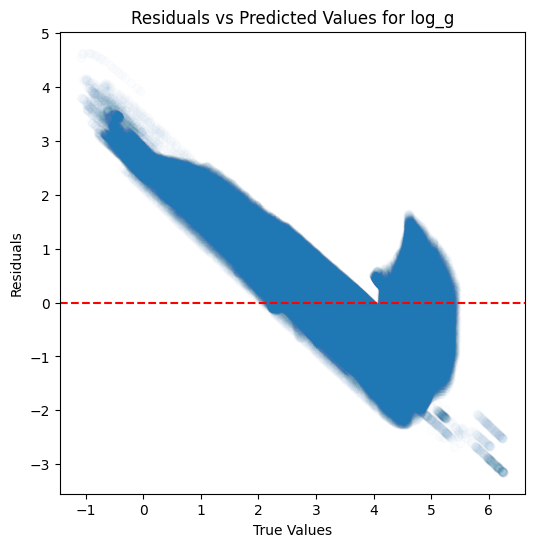

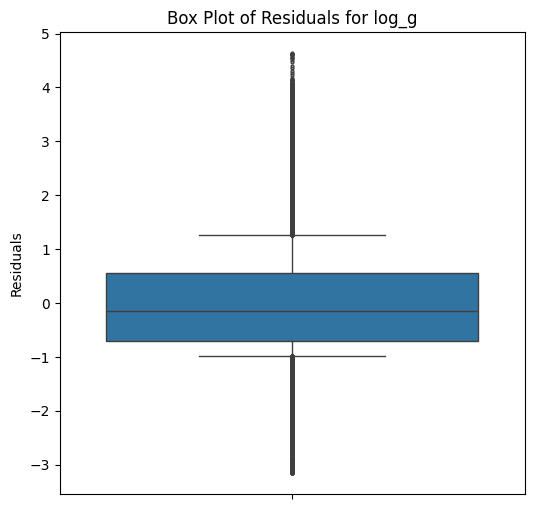

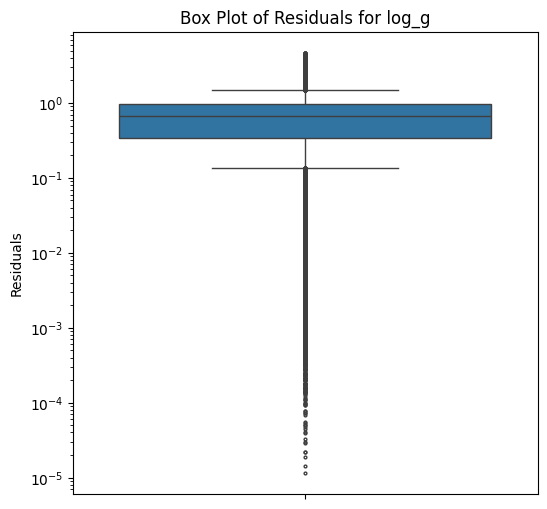

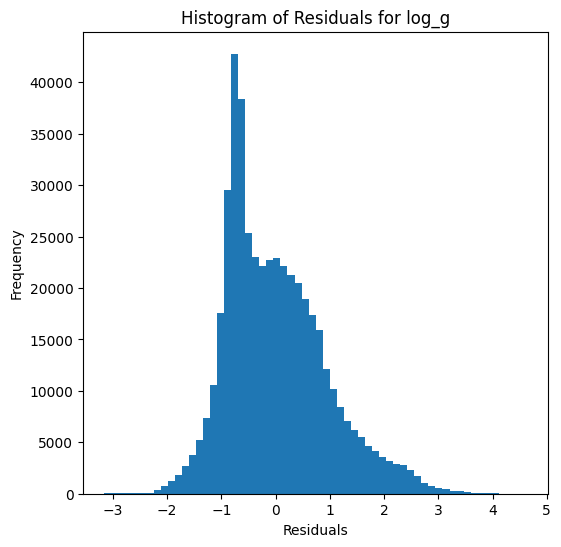

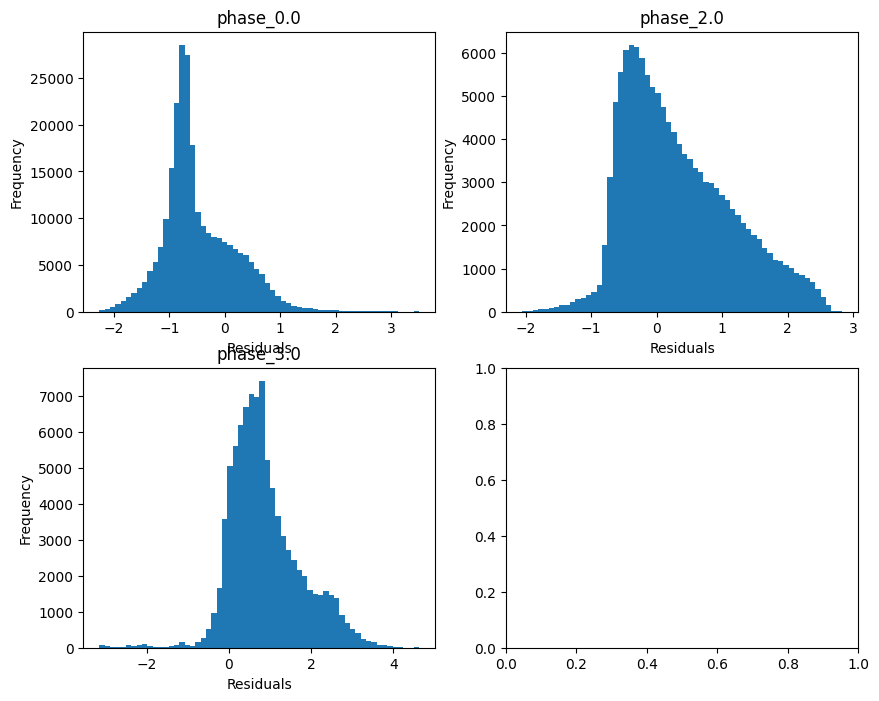

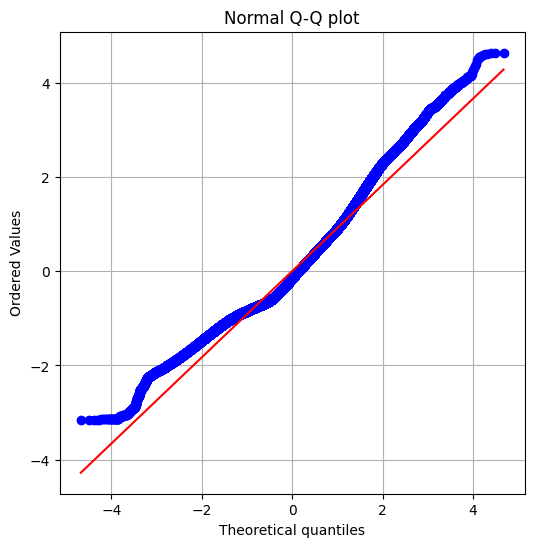

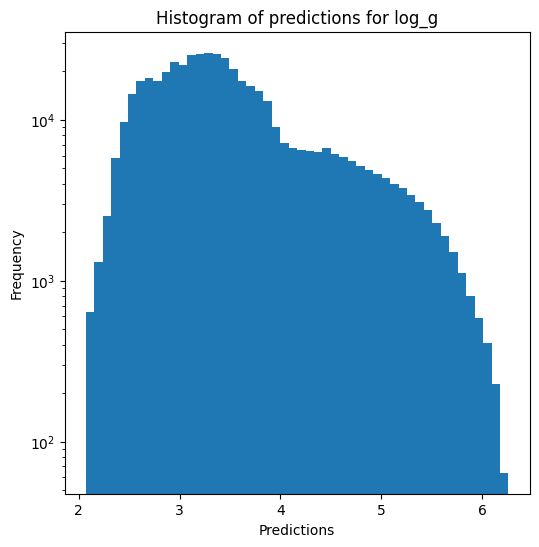

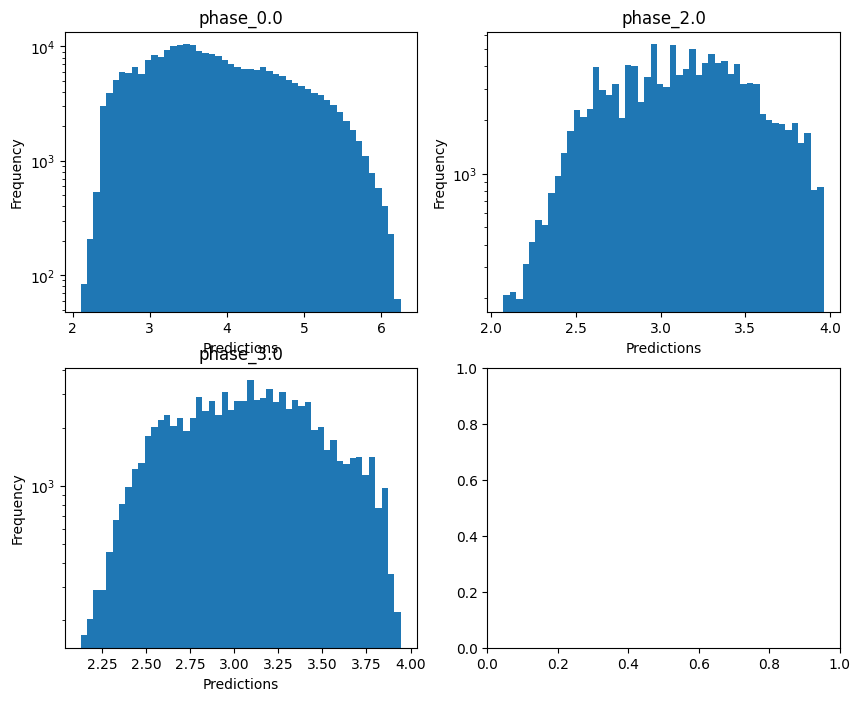


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.6550628400035865
  RMSE :  0.40918716087755397
  MAE :  0.3539437088670491
  MedAE :  0.3618674498912918
  CORR :  0.8498640321814145
  MAX_ER :  1.7212427306830413
  Percentiles : 
    75th percentile :  0.4596367497734451
    90th percentile :  0.5961799750569671
    95th percentile :  0.7250407385131233
    99th percentile :  0.9425147679490091

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.28094218366076096
  RMSE :  0.4452169007068732
  MAE :  0.3401535033088033
  MedAE :  0.260234421178396
  CORR :  0.5635259159397945
  MAX_ER :  1.3844481011662912
  Percentiles : 
    75th percentile :  0.46261856642512234
    90th percentile :  0.7809672743914715
    95th percentile :  0.9704520323530234
    99th percentile :  1.2124632614821849

radius results for the phase category with a 

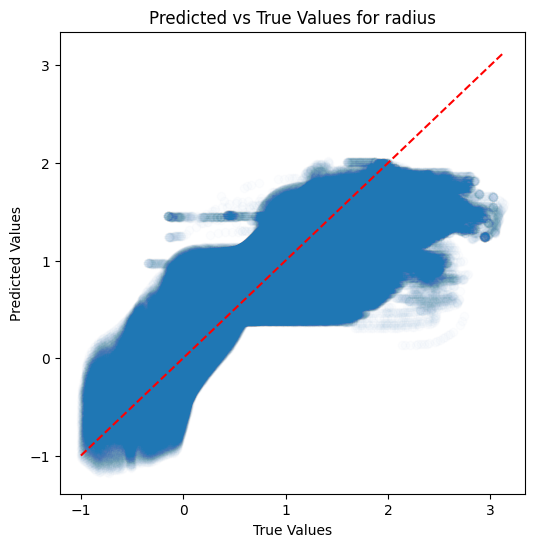

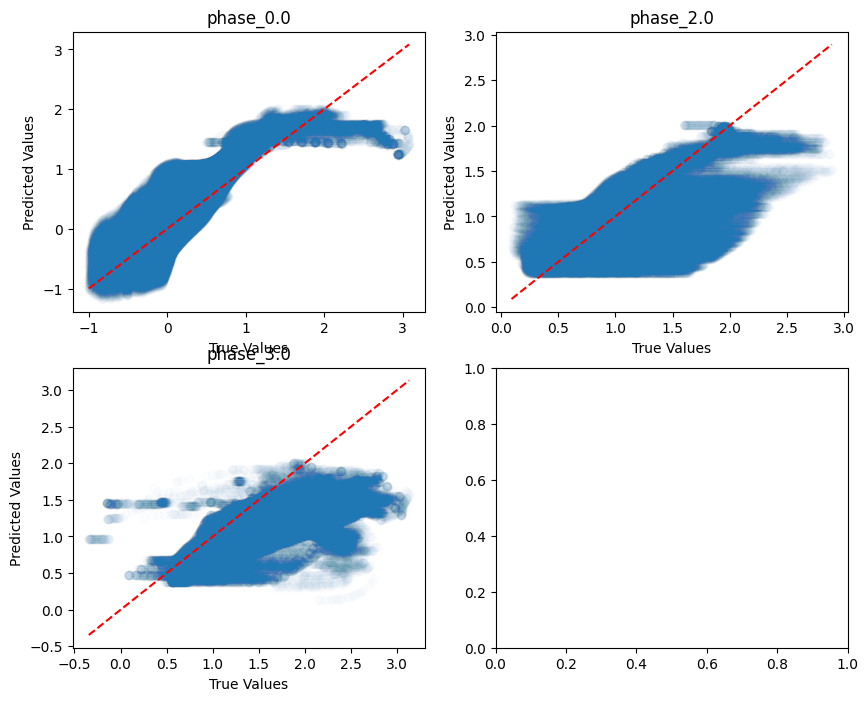

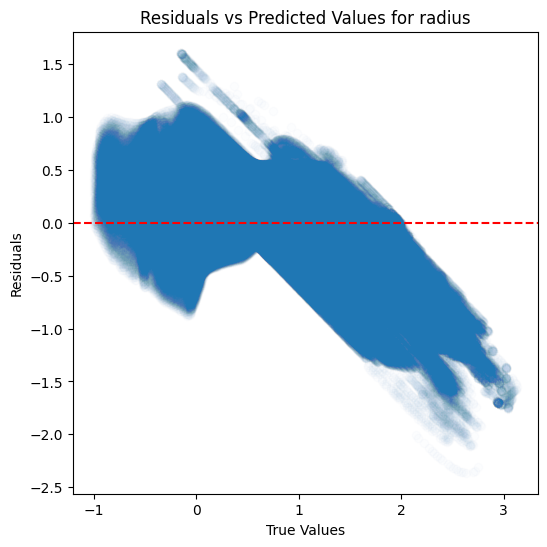

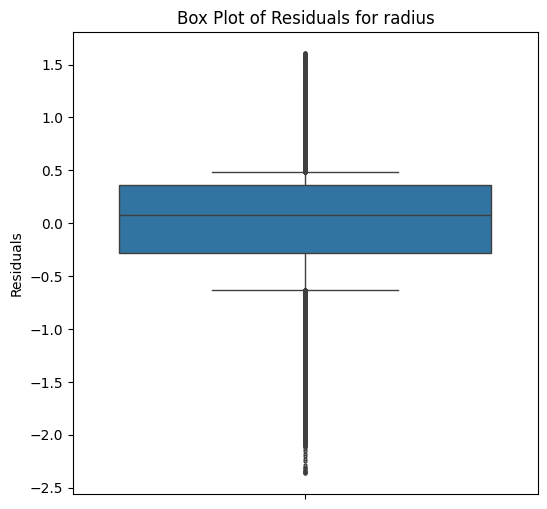

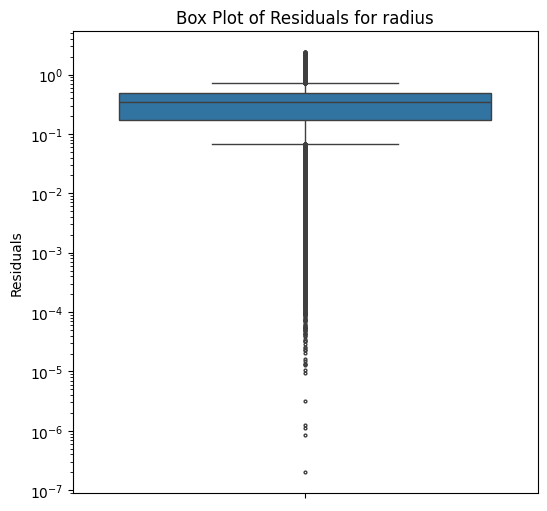

...

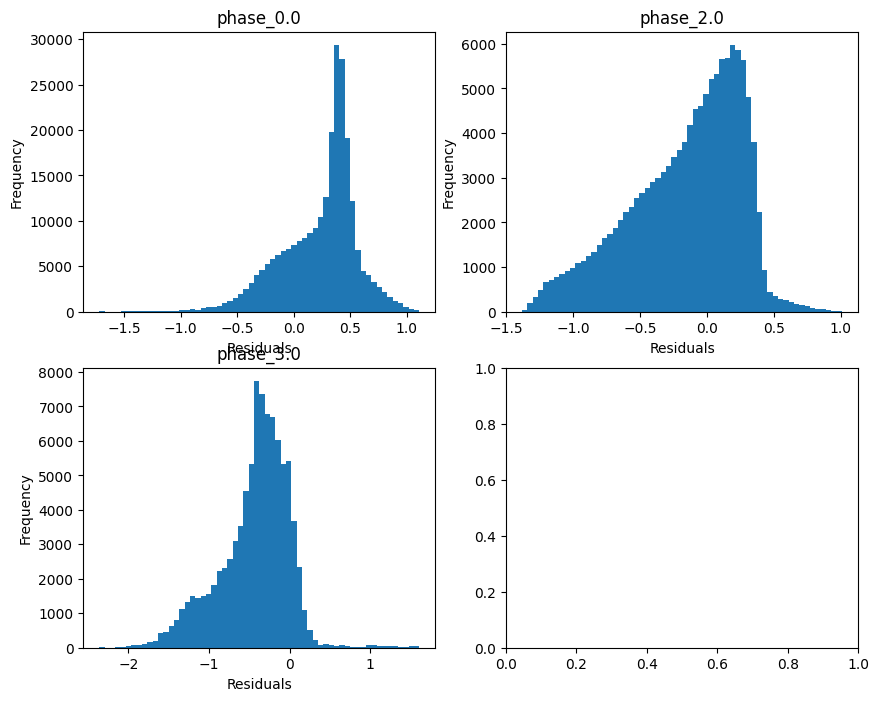

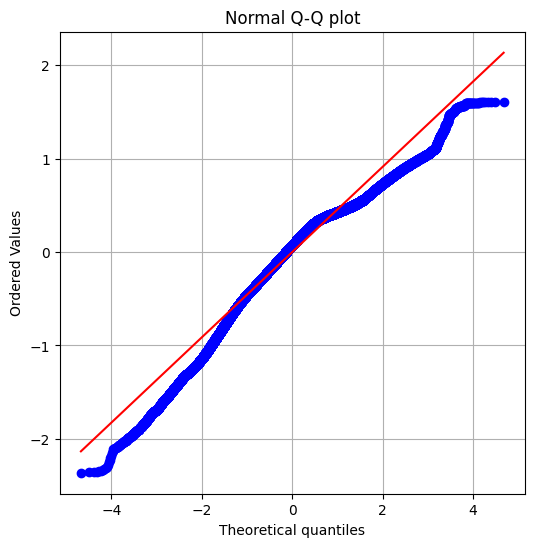

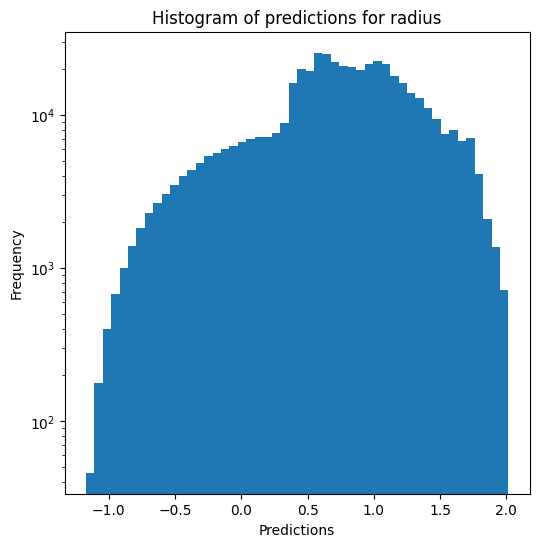

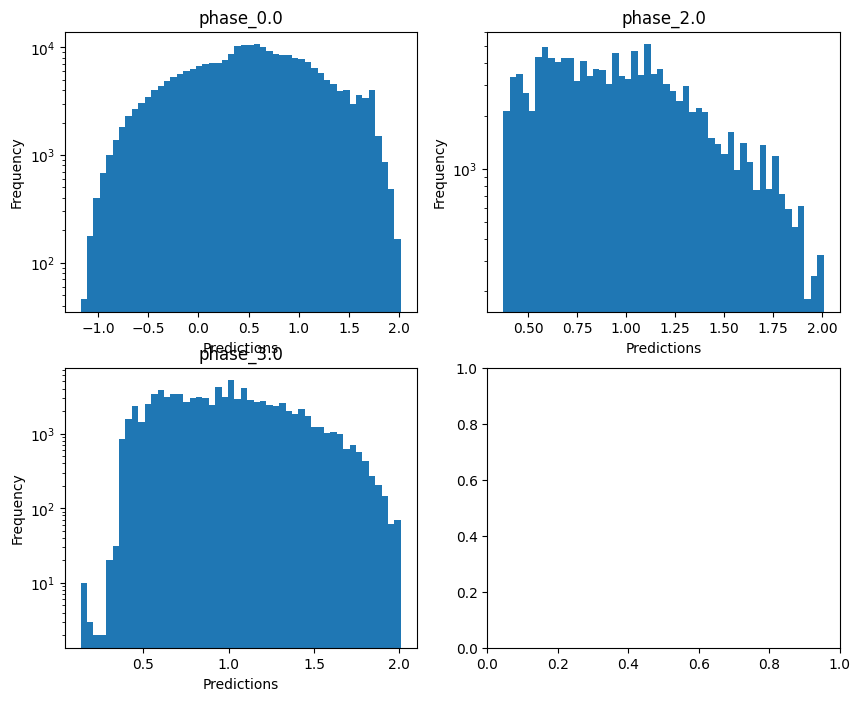

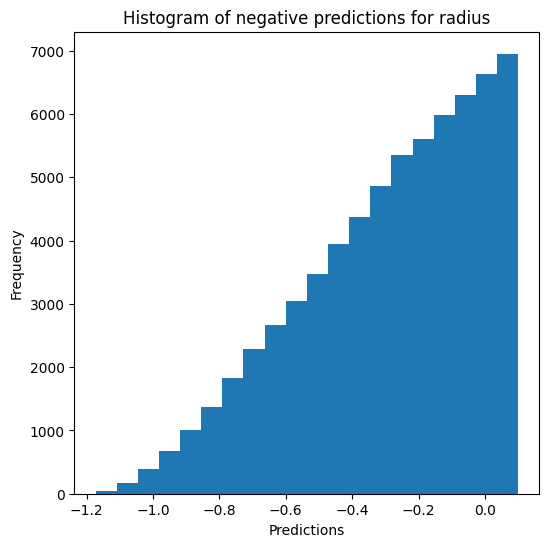

Saving predictions and results...


In [13]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name) #, override=False, use_preds=True

### Decision tree

In [14]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9601523820454696
  RMSE :  0.07038375110169467
  MAE :  0.011682774983057375
  MedAE :  0.0011518644089916208
  CORR :  0.9802905465241833
  MAX_ER :  0.9507131678891638
  Percentiles : 
    75th percentile :  0.002568486584413554
    90th percentile :  0.004750117517008202
    95th percentile :  0.01187770409683626
    99th percentile :  0.40605869452801646

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.9589604262887346
  RMSE :  0.06410845041558005
  MAE :  0.023895550281012423
  MedAE :  0.0032317636652767767
  CORR :  0.9794262869598029
  MAX_ER :  0.8470942576263263
  Percentiles : 
    75th percentile :  0.007872994213691475
    90th percentile :  0.08249096605623855

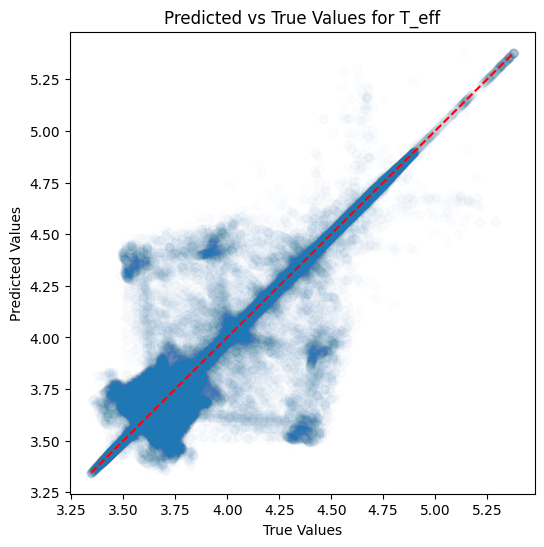

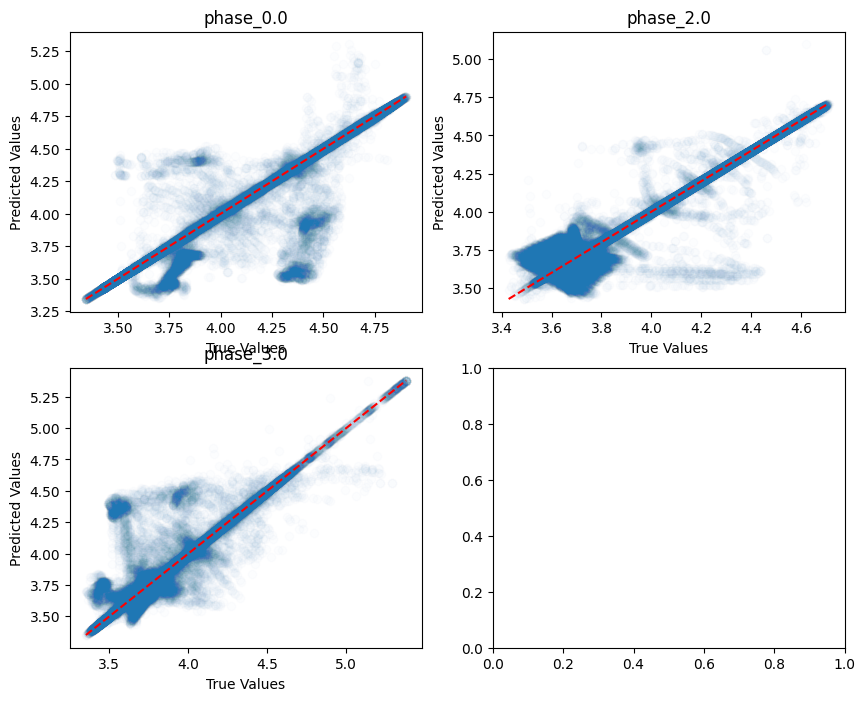

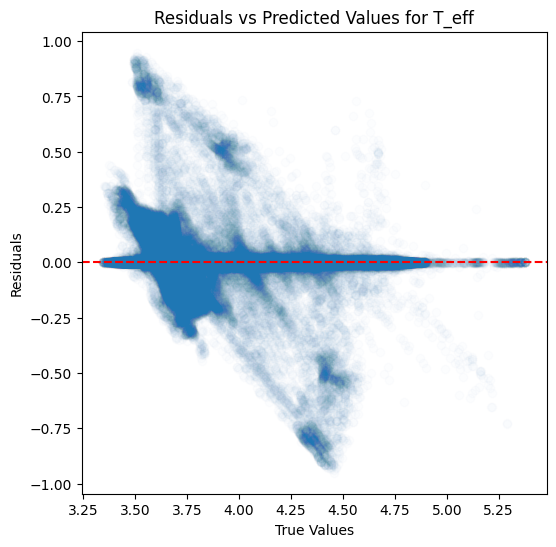

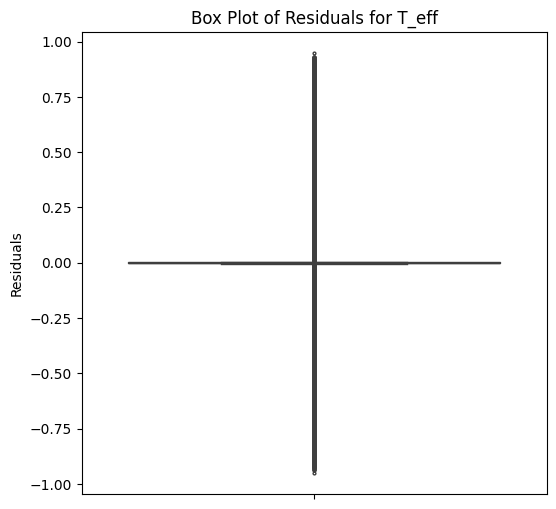

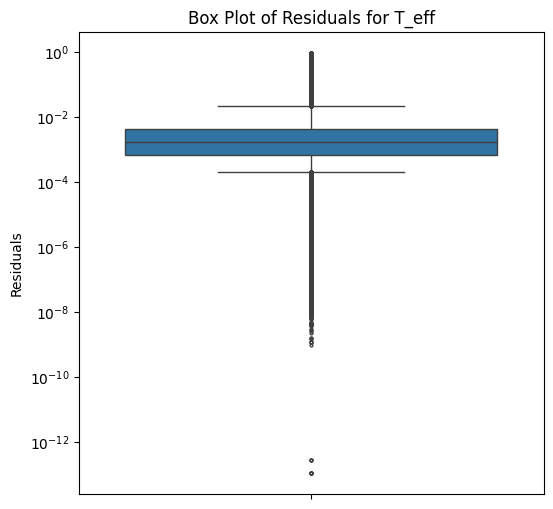

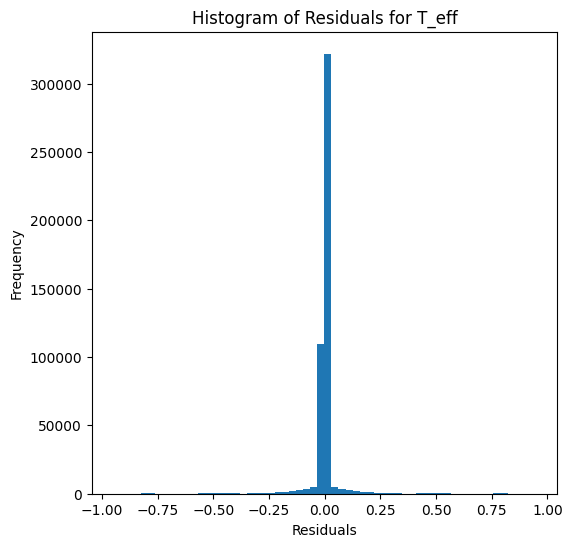

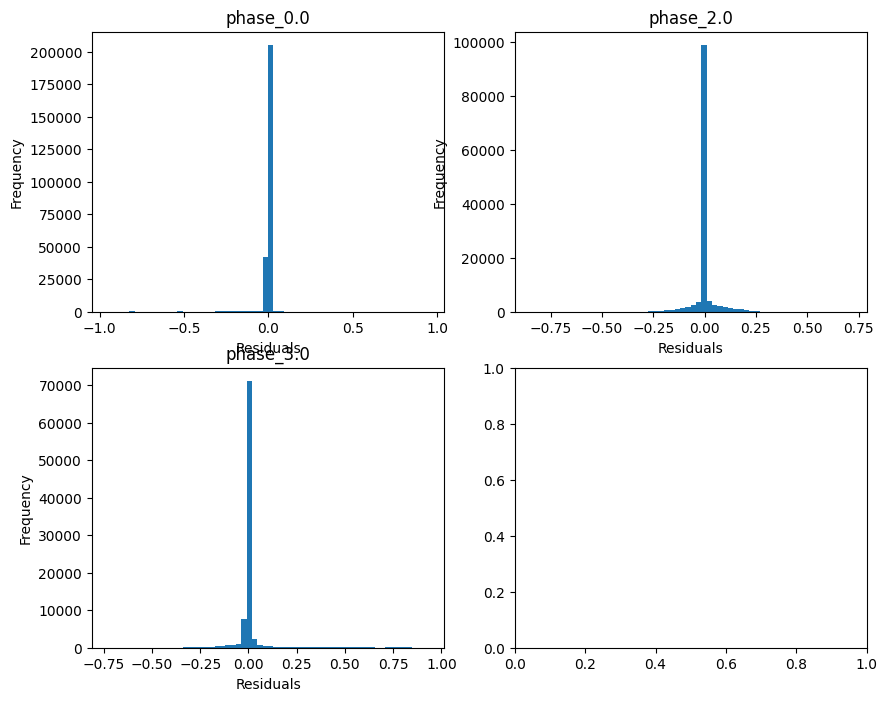

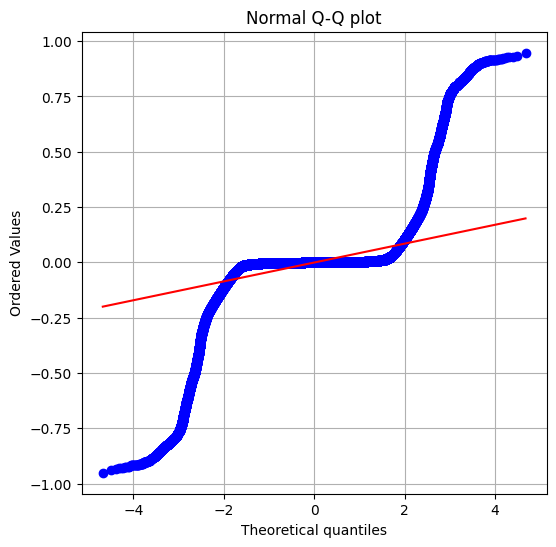

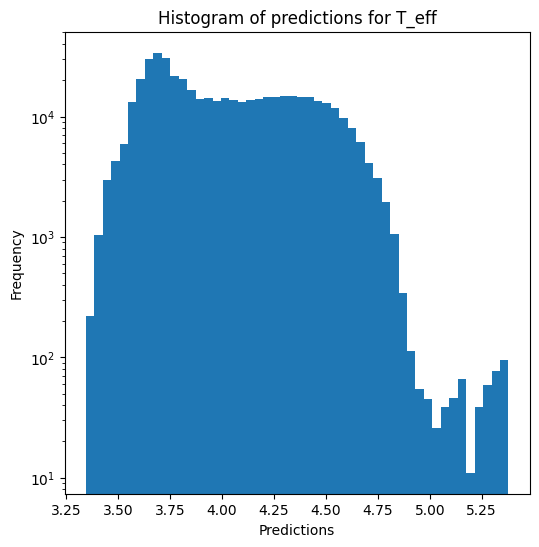

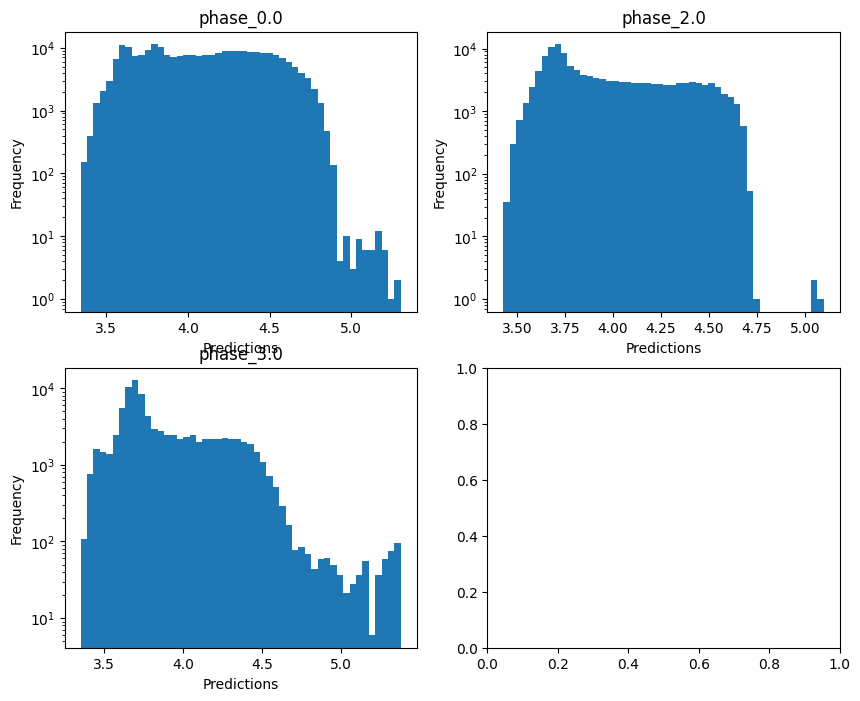


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.45740611827176303
  RMSE :  0.46417497049973805
  MAE :  0.07446453121191389
  MedAE :  0.004125946162152783
  CORR :  0.8062874619439341
  MAX_ER :  5.681742527263148
  Percentiles : 
    75th percentile :  0.008242208652673
    90th percentile :  0.017157051243831847
    95th percentile :  0.03707111591996584
    99th percentile :  3.0959862871720576

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.10768816507489454
  RMSE :  0.8599558174697169
  MAE :  0.3516912959370888
  MedAE :  0.015909381583044446
  CORR :  0.5514488118229172
  MAX_ER :  4.585015970670848
  Percentiles : 
    75th percentile :  0.044757022339408925
    90th percentile :  1.5068504120394564
    95th percentile :  2.335348421424693
    99th percentile :  3.4626735545737133

log_g results for the phase category wit

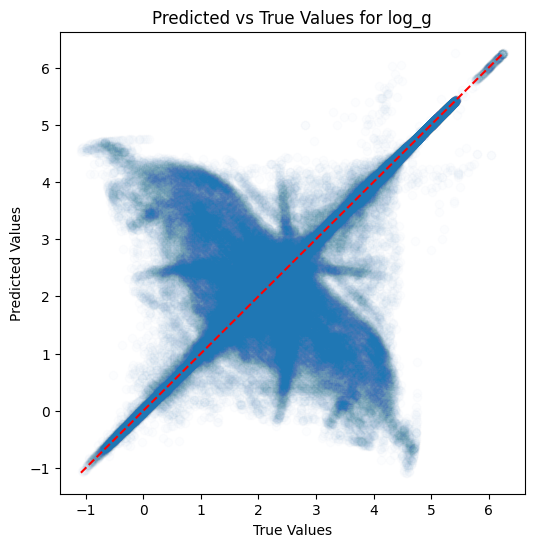

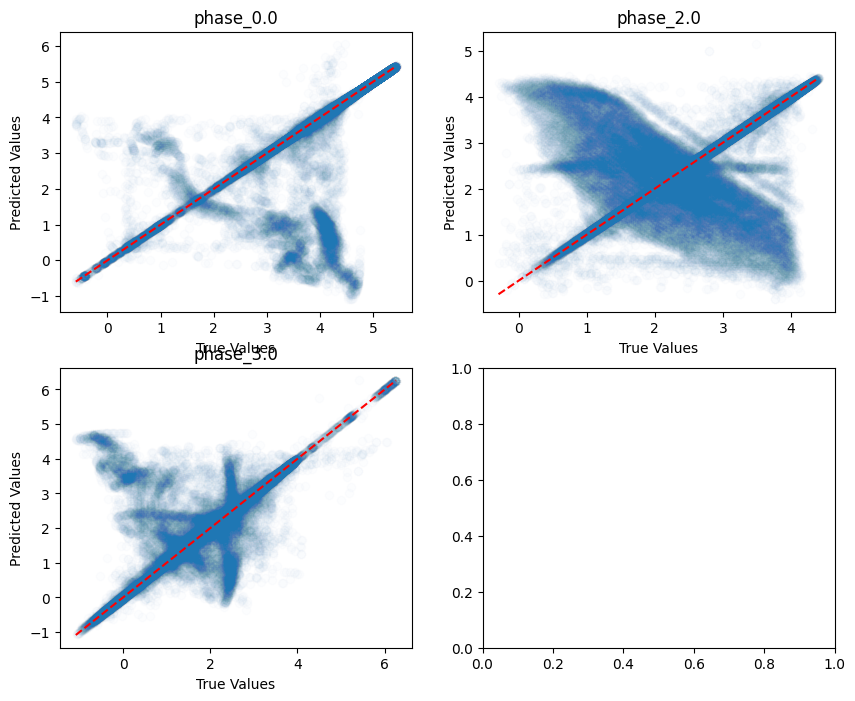

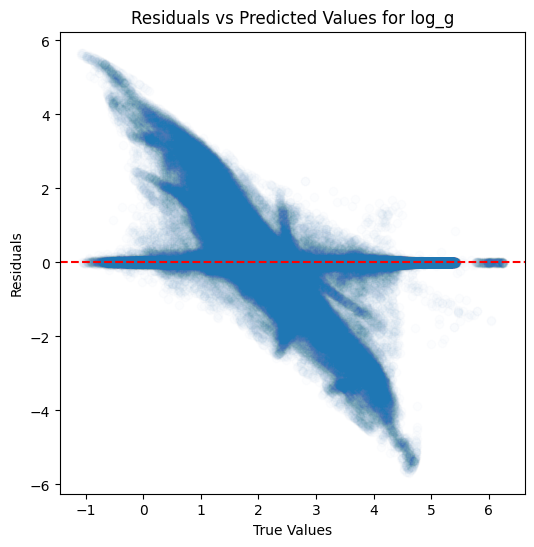

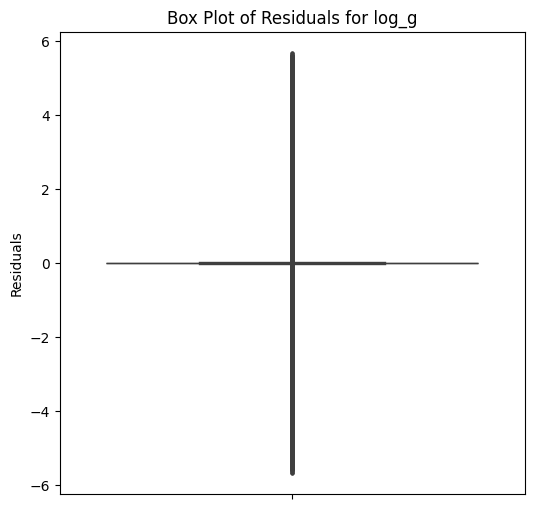

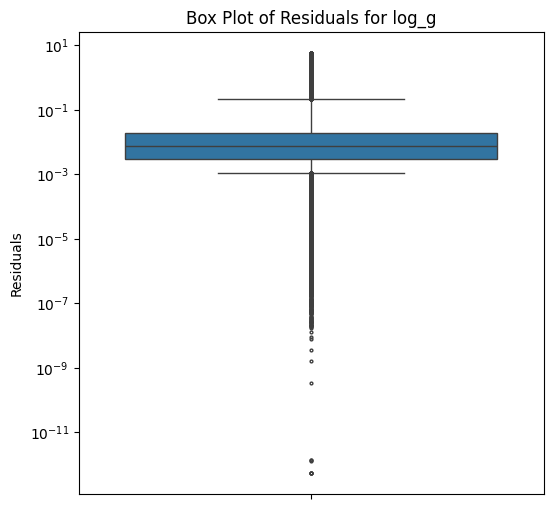

...

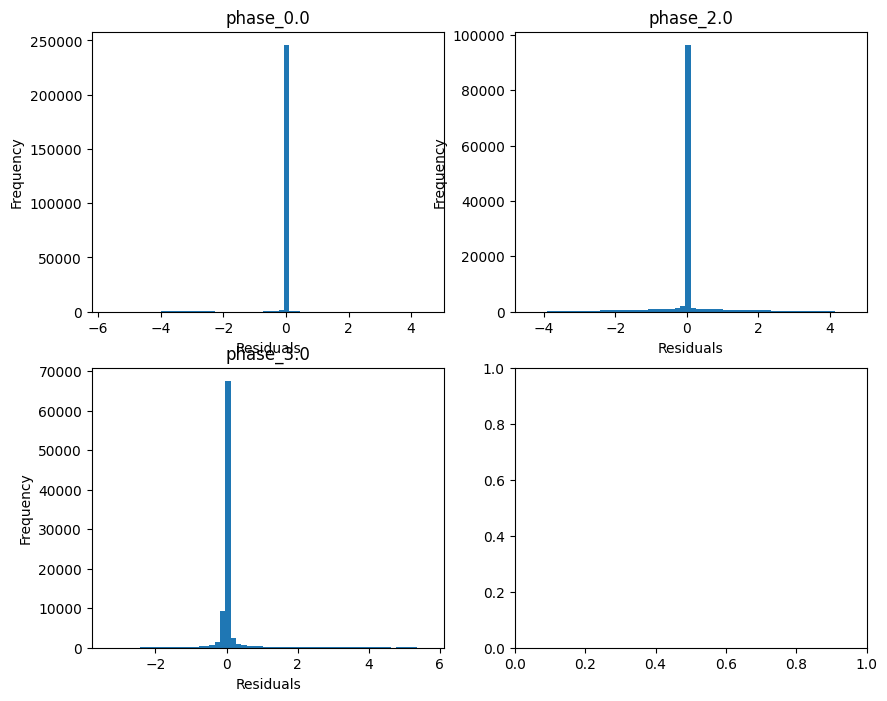

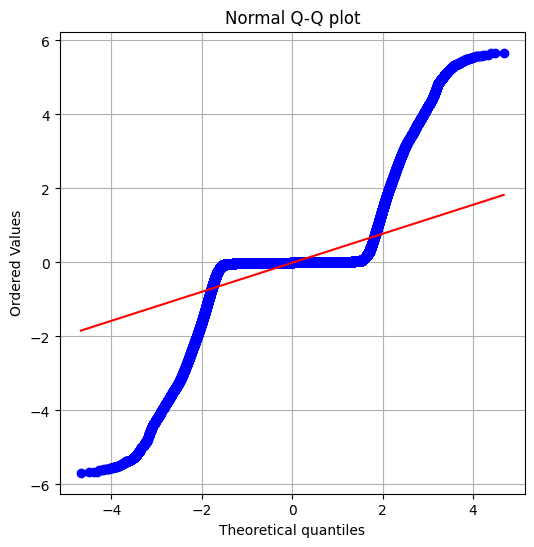

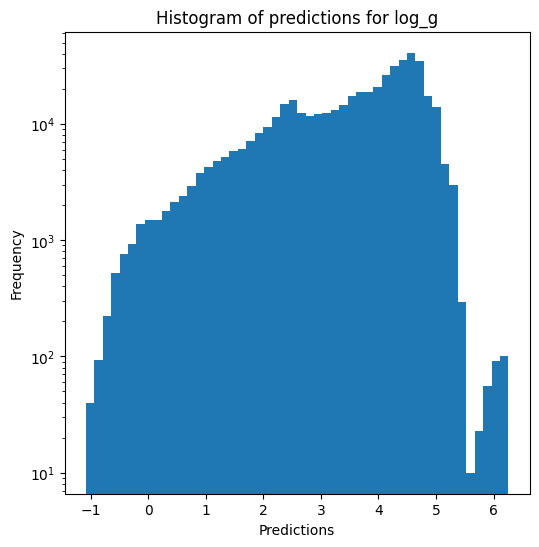

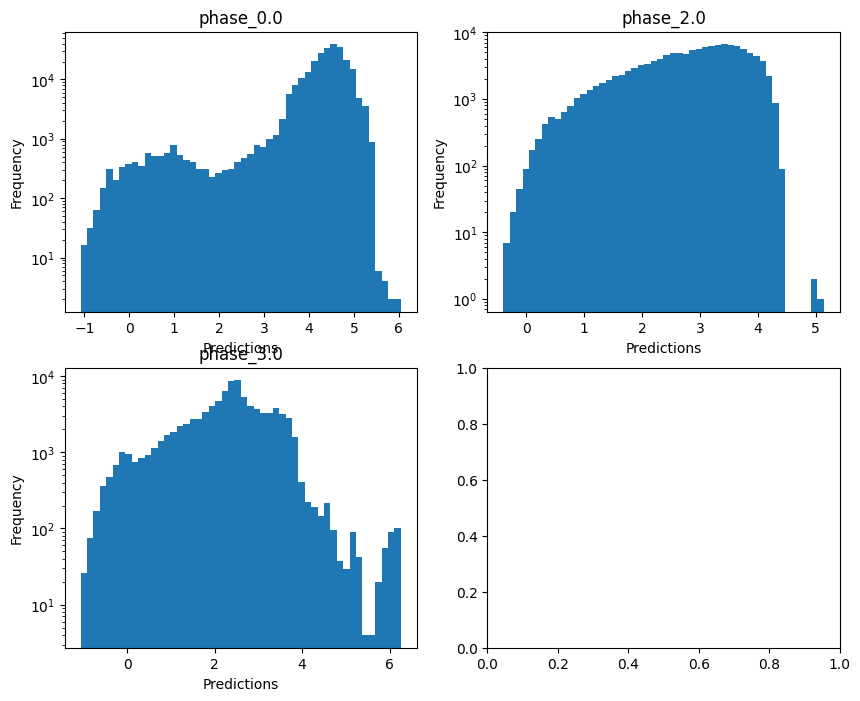

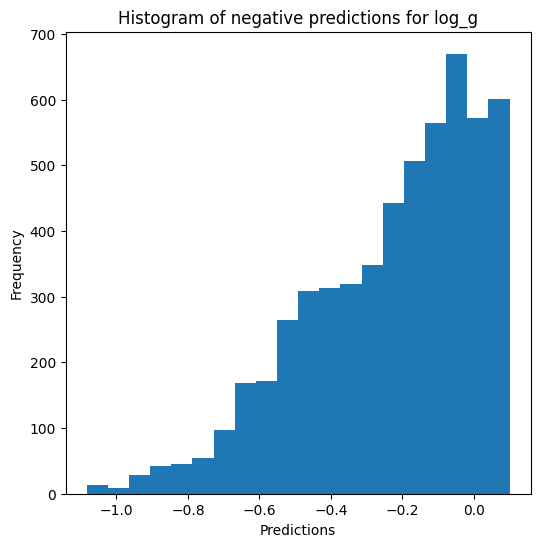


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8360114422390652
  RMSE :  0.23236092318709384
  MAE :  0.03820292823416225
  MedAE :  0.0028576144390196068
  CORR :  0.9265557627158635
  MAX_ER :  2.8409947115068483
  Percentiles : 
    75th percentile :  0.005419340262364417
    90th percentile :  0.01103244553389607
    95th percentile :  0.02145694311762852
    99th percentile :  1.5504894793913153

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.2324716000482907
  RMSE :  0.4299704996595848
  MAE :  0.17585493972762414
  MedAE :  0.007971095155651309
  CORR :  0.6237079498362755
  MAX_ER :  2.2923746376311427
  Percentiles : 
    75th percentile :  0.02248003402753418
    90th percentile :  0.7535057682415839
    95th percentile :  1.167459805962261
    99th percentile :  1.7317095842818921

radius results for the phase catego

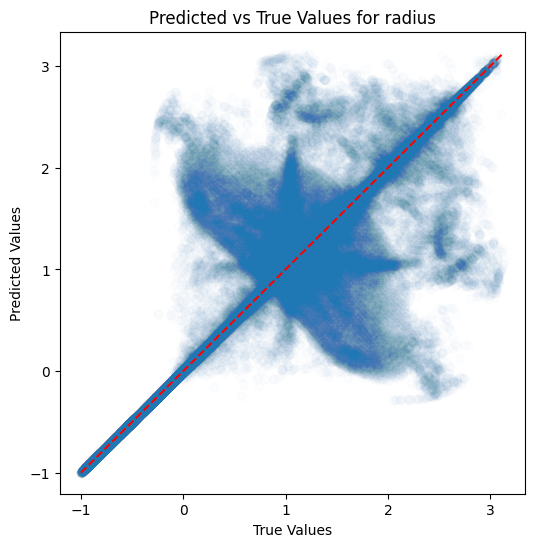

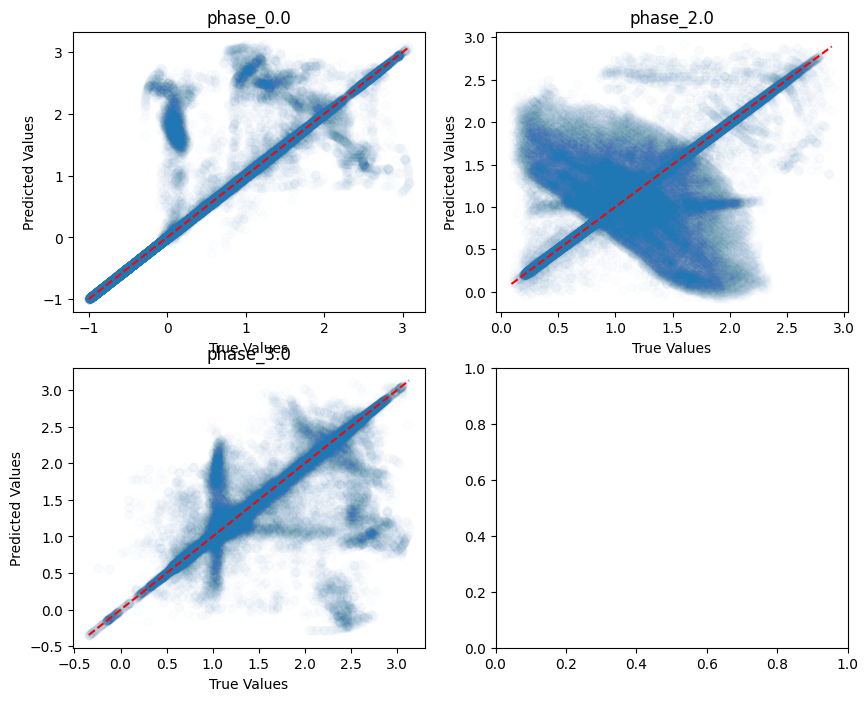

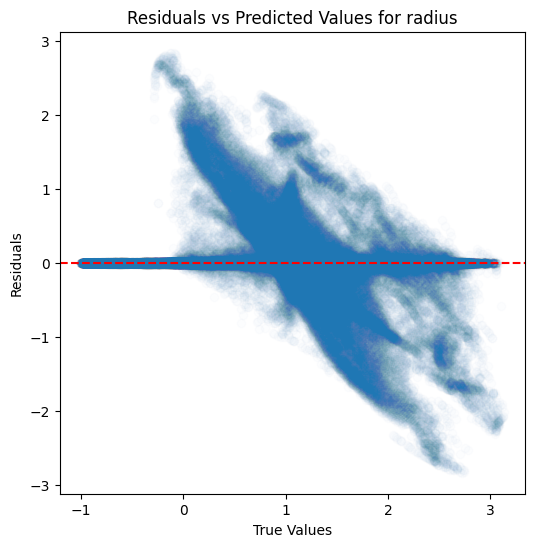

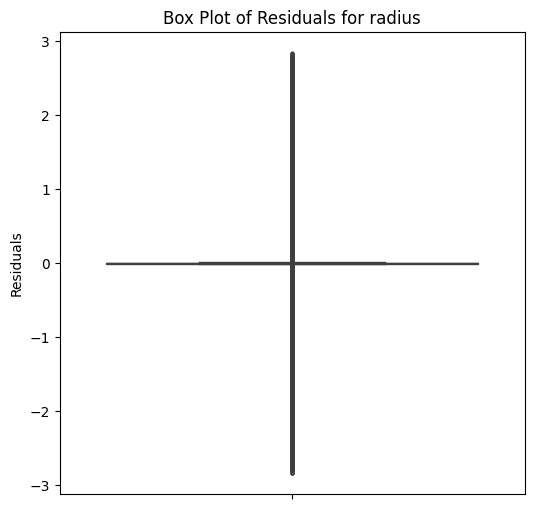

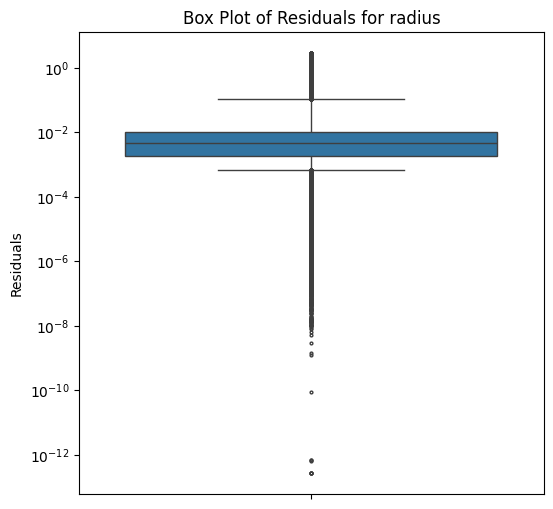

...

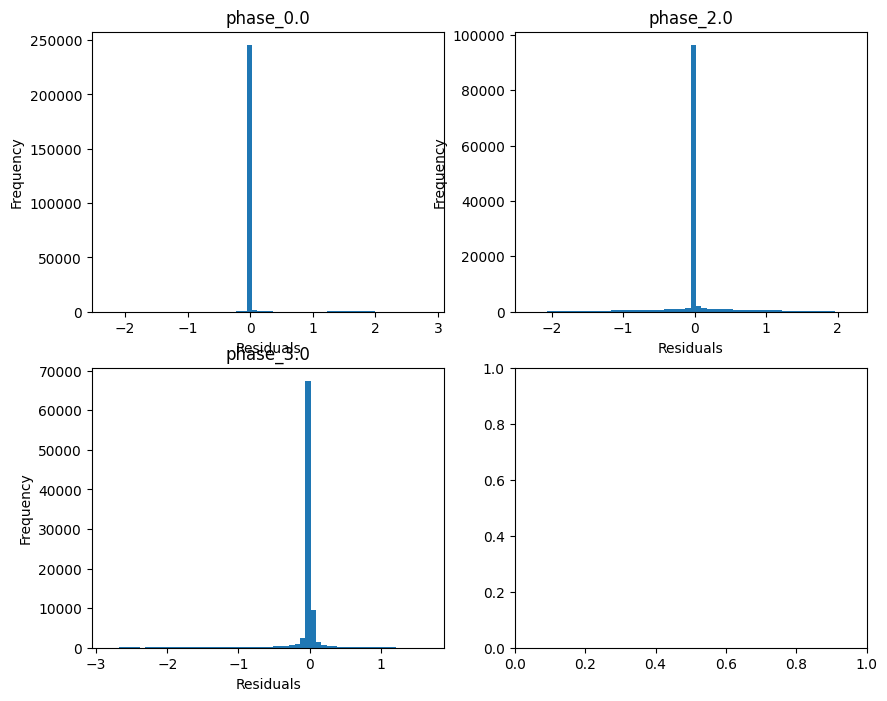

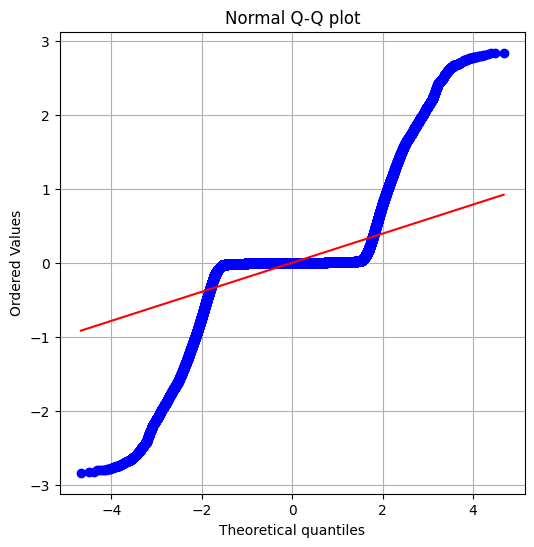

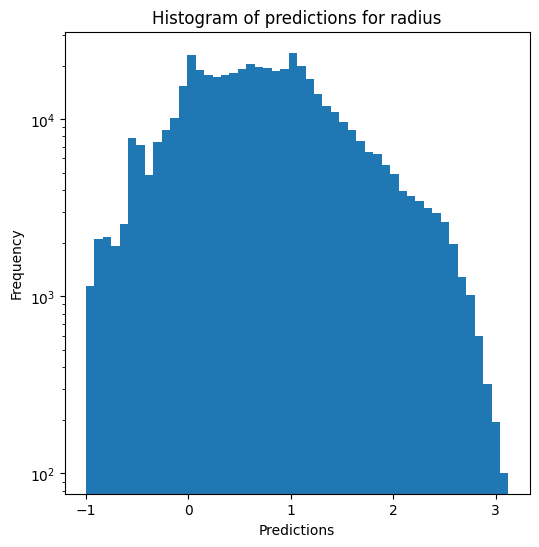

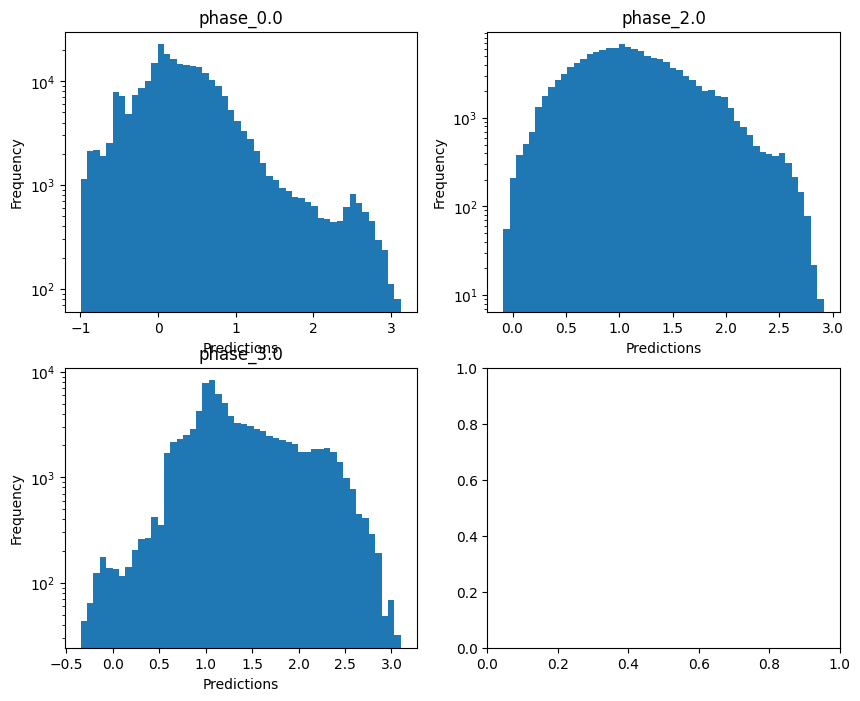

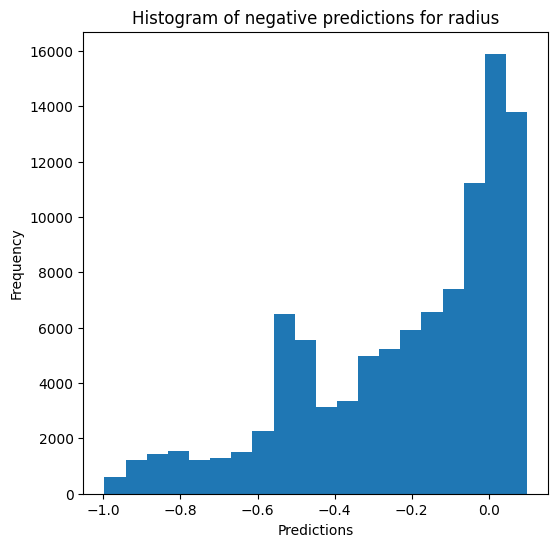

Saving predictions and results...


In [15]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### K-nearest neighbours

In [16]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9804756634381895
  RMSE :  0.049300240751877486
  MAE :  0.009101445982197733
  MedAE :  0.0012275817561169244
  CORR :  0.9902447996113808
  MAX_ER :  0.9161086762692139
  Percentiles : 
    75th percentile :  0.002467714634181606
    90th percentile :  0.004678394826360634
    95th percentile :  0.009196661679454
    99th percentile :  0.2449307554145331

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.984616766946925
  RMSE :  0.03925667596443798
  MAE :  0.016427311685577498
  MedAE :  0.0021411804825790526
  CORR :  0.992284111315052
  MAX_ER :  0.7125480731818836
  Percentiles : 
    75th percentile :  0.010303822740150848
    90th percentile :  0.056336117027518465
  

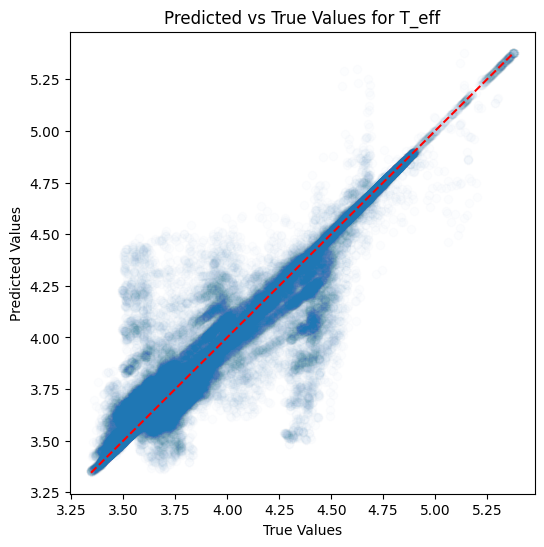

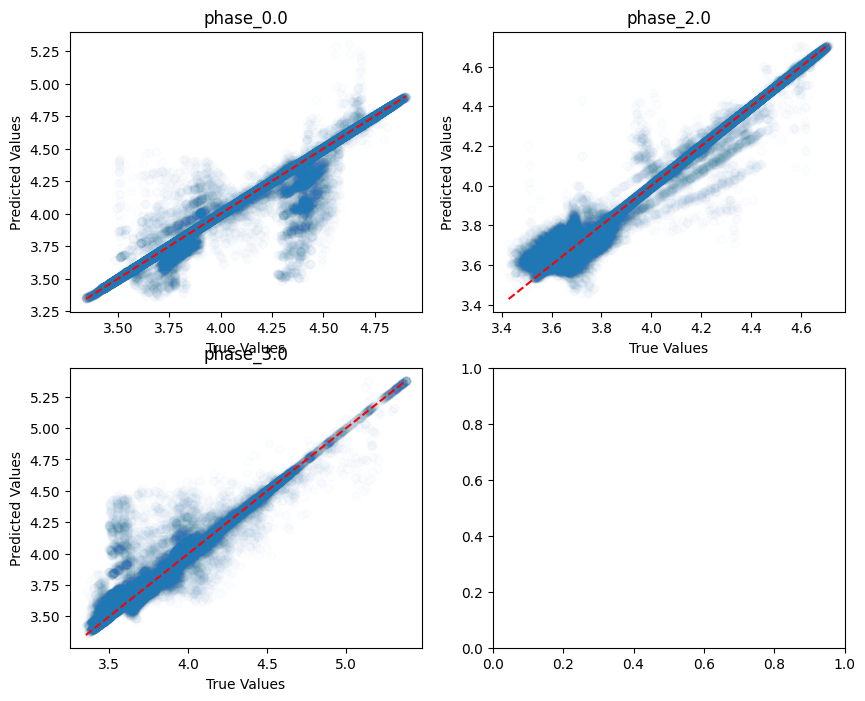

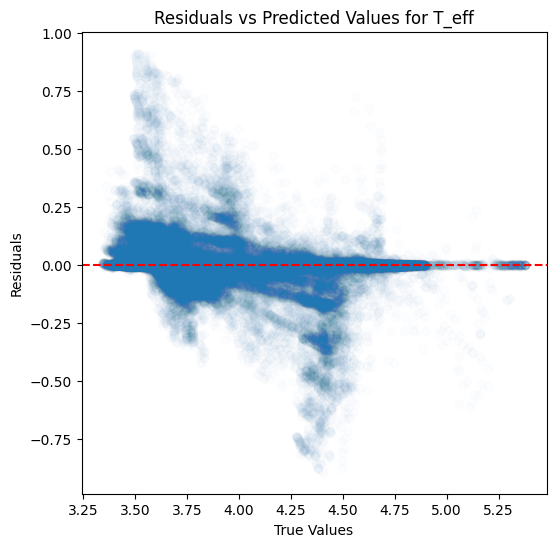

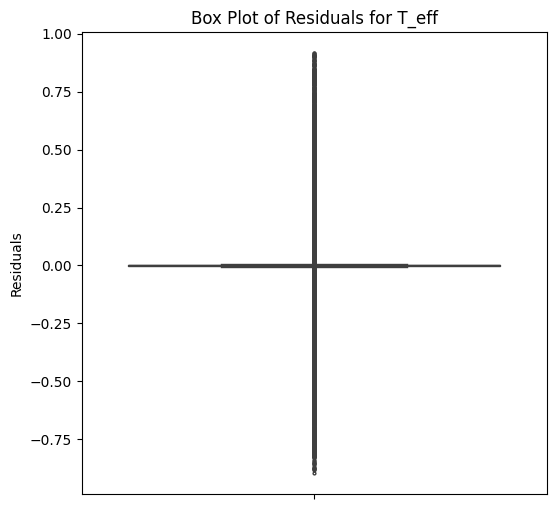

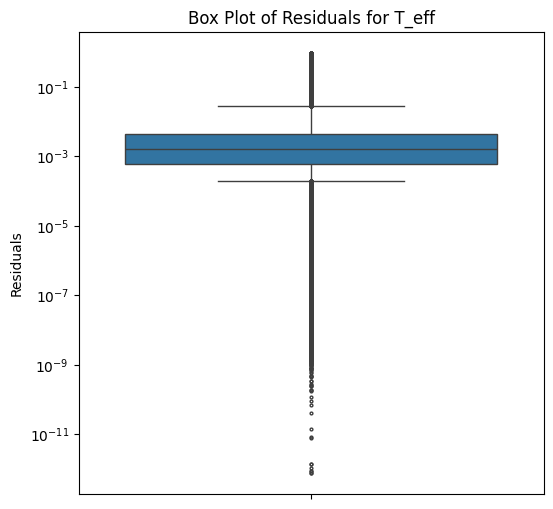

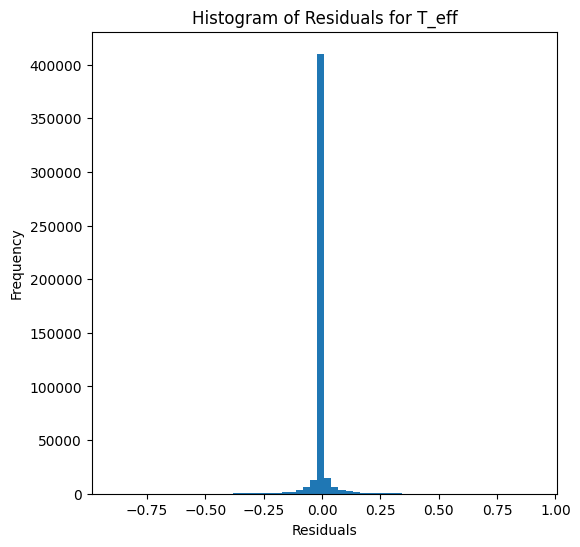

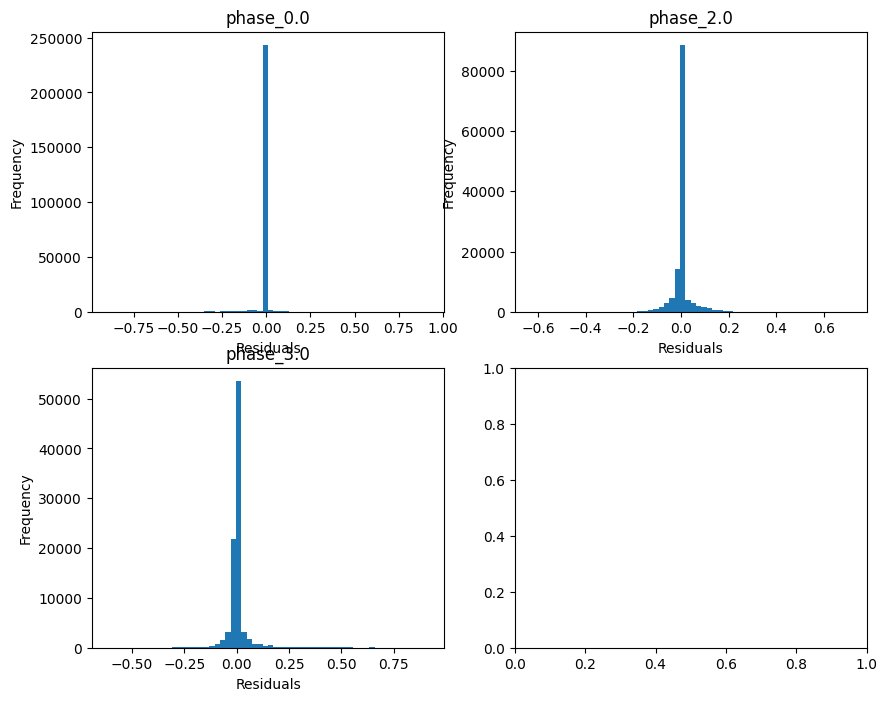

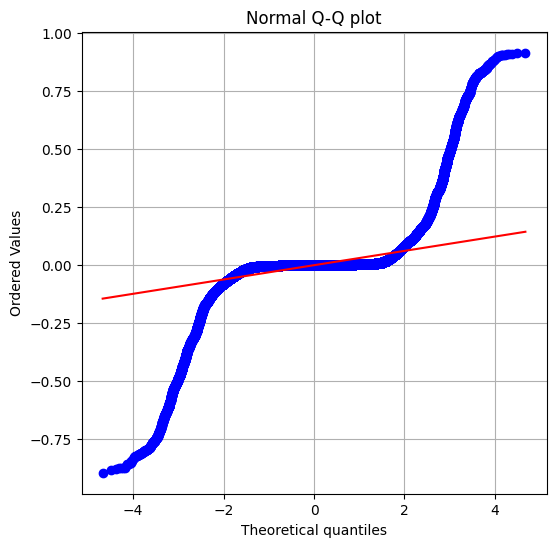

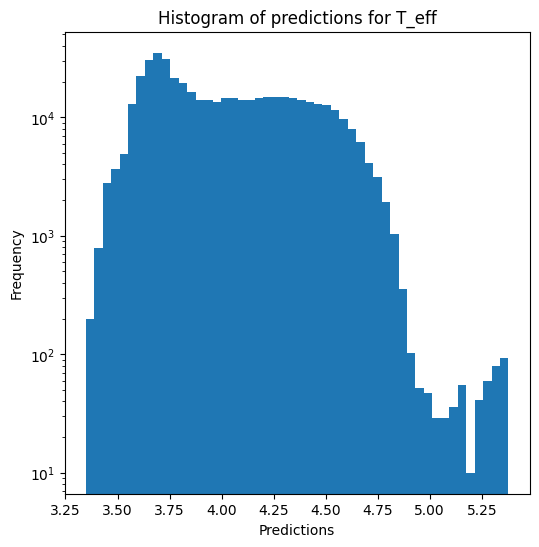

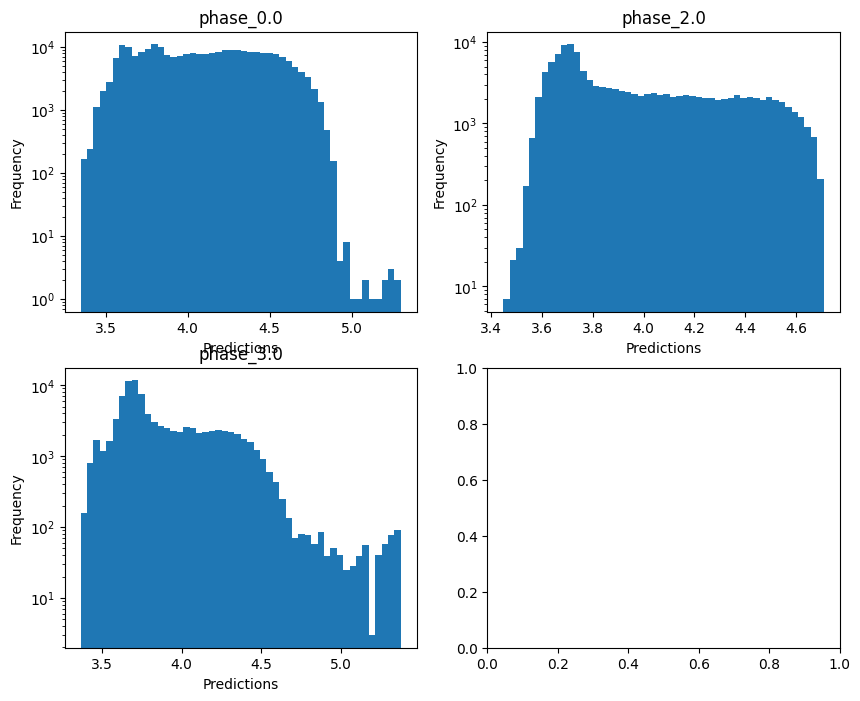


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.7282076009653046
  RMSE :  0.3291533292267911
  MAE :  0.0574367574186446
  MedAE :  0.002480729481717958
  CORR :  0.8877096449591447
  MAX_ER :  5.572704498947318
  Percentiles : 
    75th percentile :  0.006005711847979489
    90th percentile :  0.013819524072821223
    95th percentile :  0.035471893704741804
    99th percentile :  1.796652598626393

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.5965656849446874
  RMSE :  0.5784951998697813
  MAE :  0.24671000774389054
  MedAE :  0.010268520160761963
  CORR :  0.7763917178718475
  MAX_ER :  4.587359712892218
  Percentiles : 
    75th percentile :  0.13924212472226527
    90th percentile :  0.9730730313200163
    95th percentile :  1.4706176184457642
    99th percentile :  2.3189012695148263

log_g results for the phase category wit

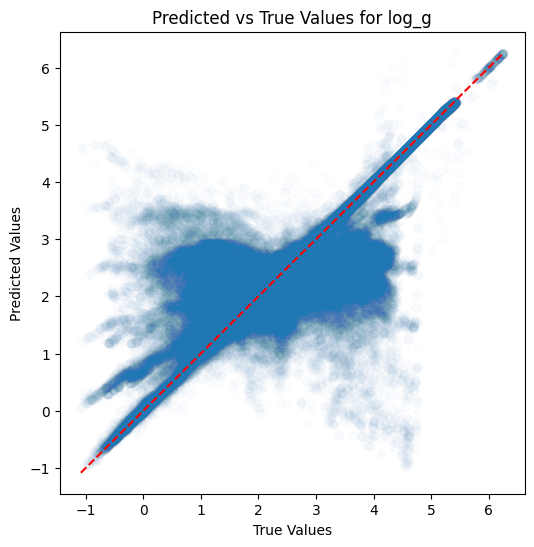

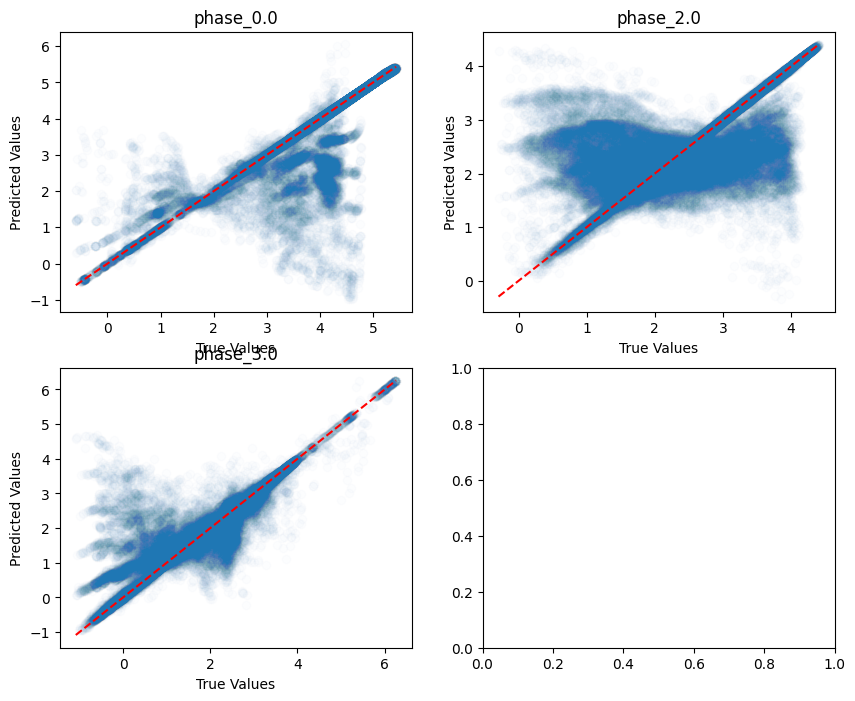

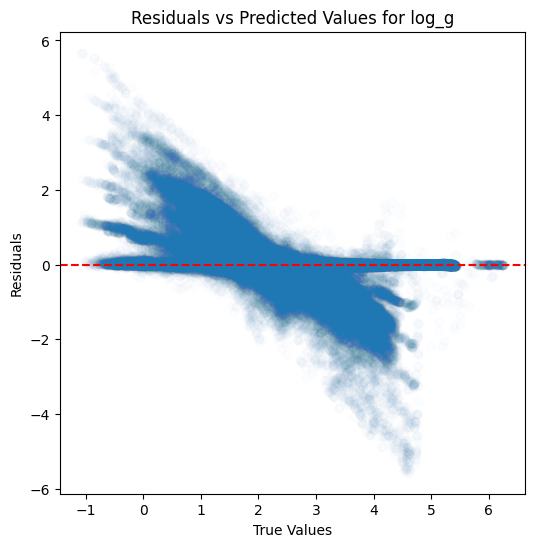

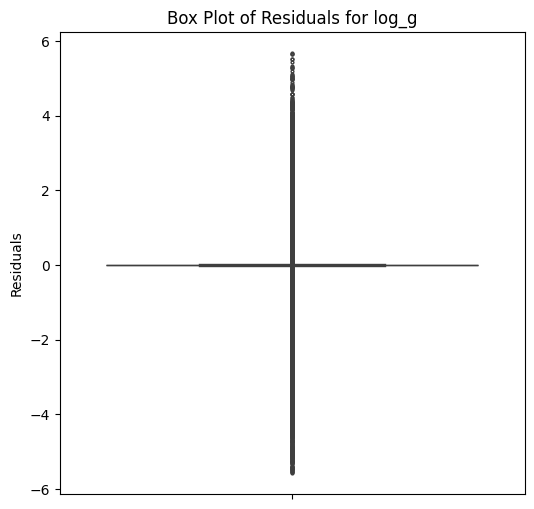

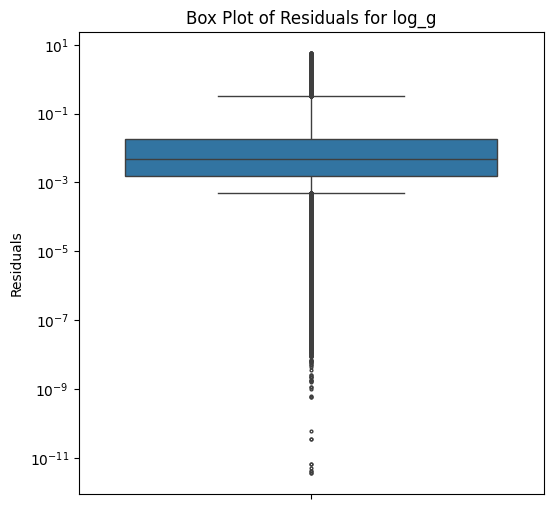

...

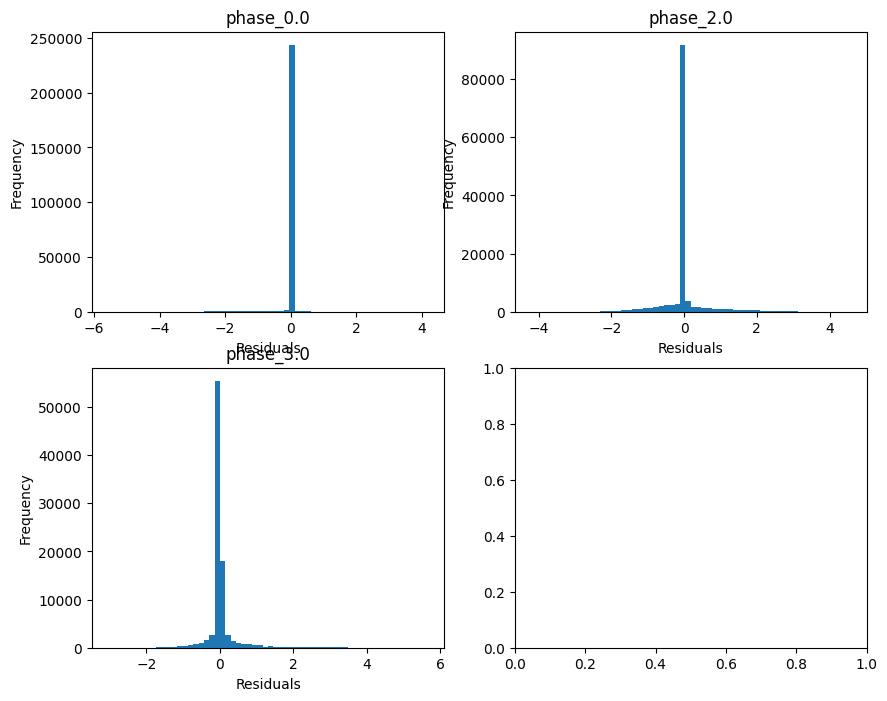

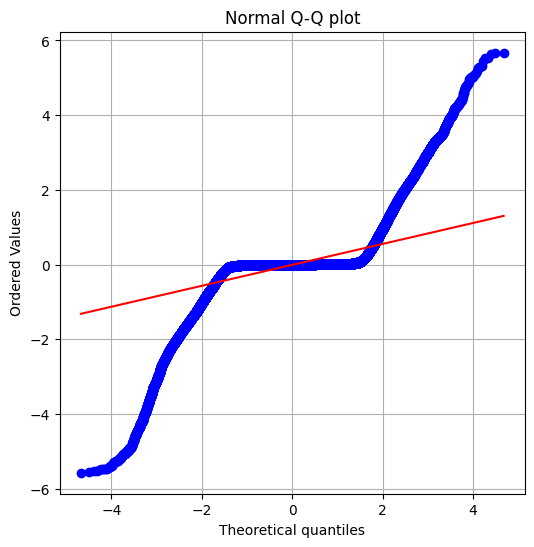

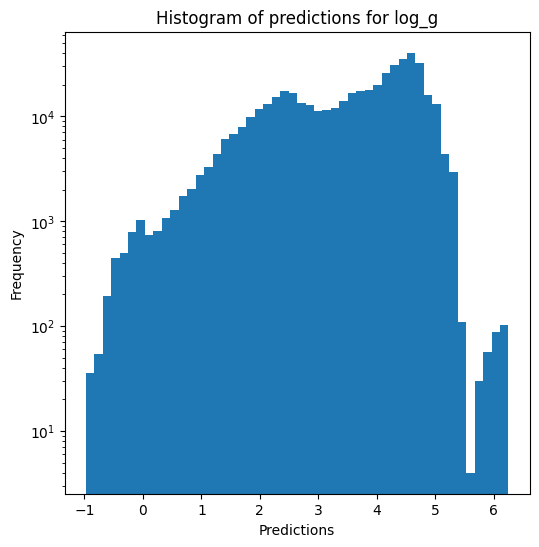

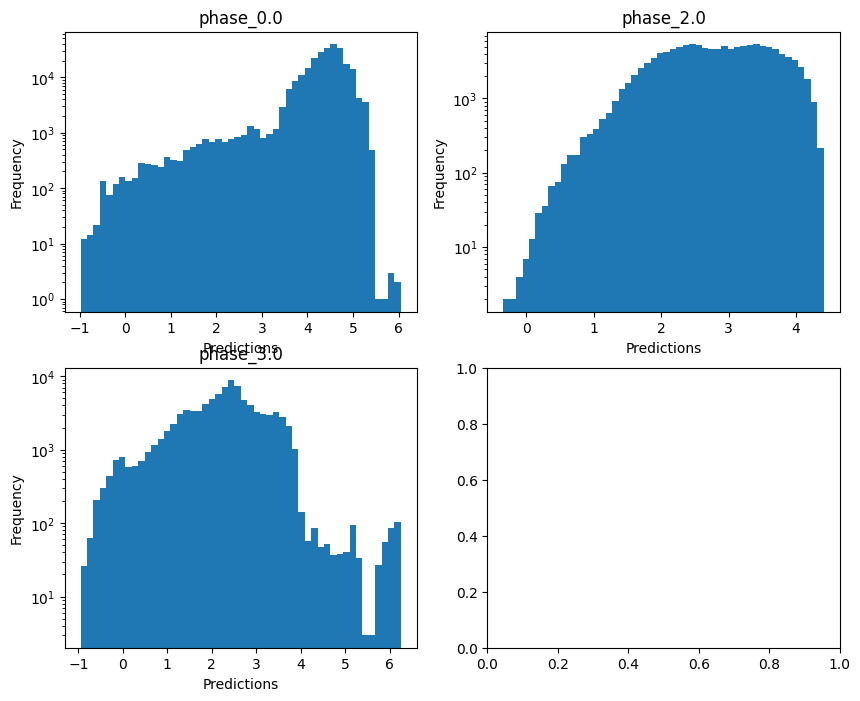

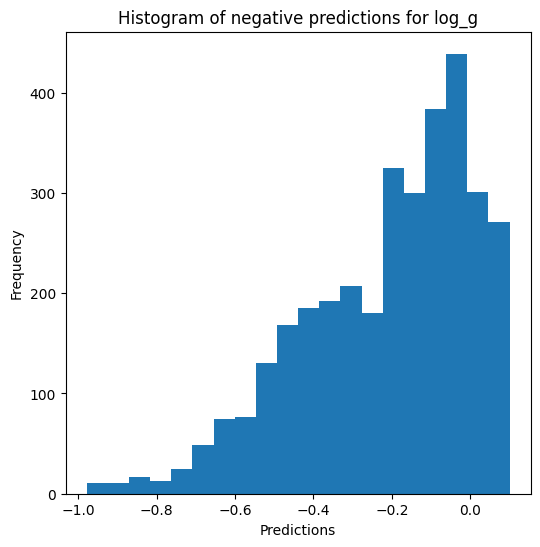


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.9178264630814648
  RMSE :  0.16480826576368168
  MAE :  0.030095620643032776
  MedAE :  0.0024161681750941833
  CORR :  0.9611875575805502
  MAX_ER :  2.788066779003325
  Percentiles : 
    75th percentile :  0.0048872168046370235
    90th percentile :  0.01024055967951863
    95th percentile :  0.026111044532786724
    99th percentile :  0.8992005781335304

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.652982705350065
  RMSE :  0.28924271083573033
  MAE :  0.1233615817186418
  MedAE :  0.005147113553169769
  CORR :  0.8129360129355288
  MAX_ER :  2.2937092246449966
  Percentiles : 
    75th percentile :  0.06962802944125734
    90th percentile :  0.486468018250816
    95th percentile :  0.7352843226684695
    99th percentile :  1.159490682757709

radius results for the phase catego

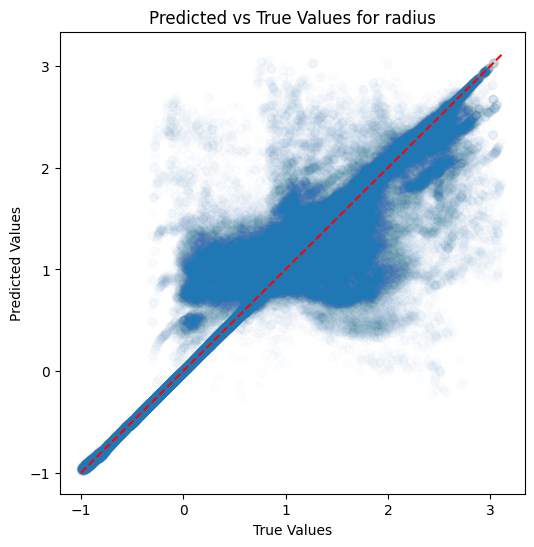

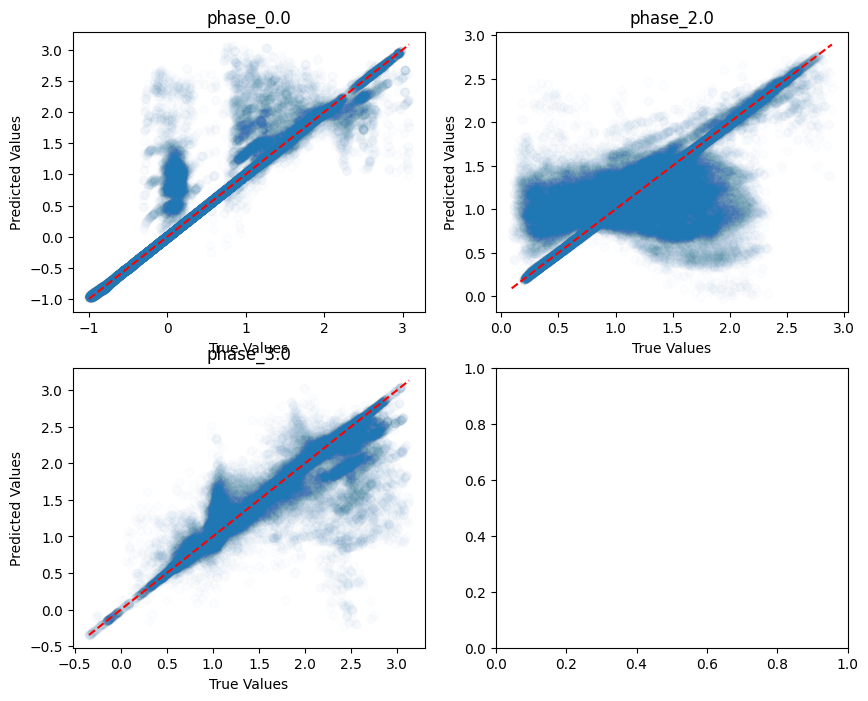

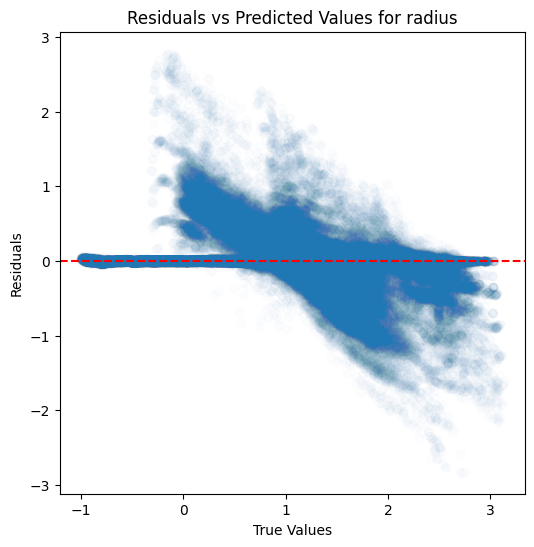

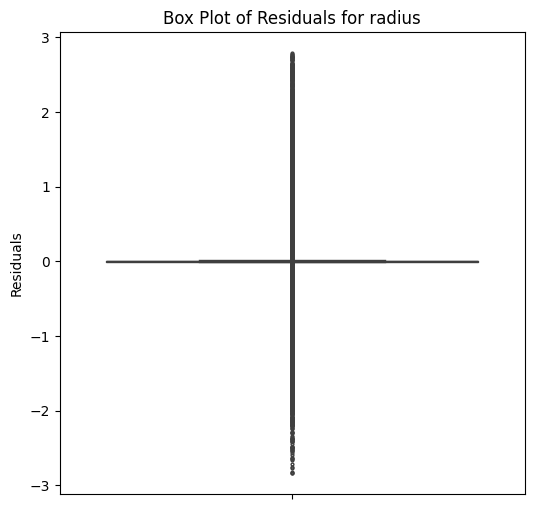

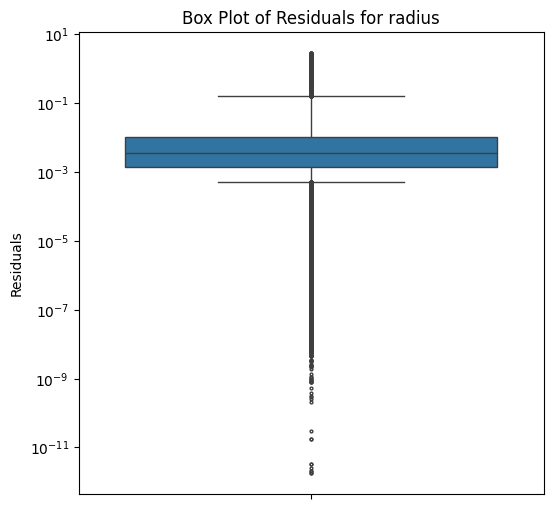

...

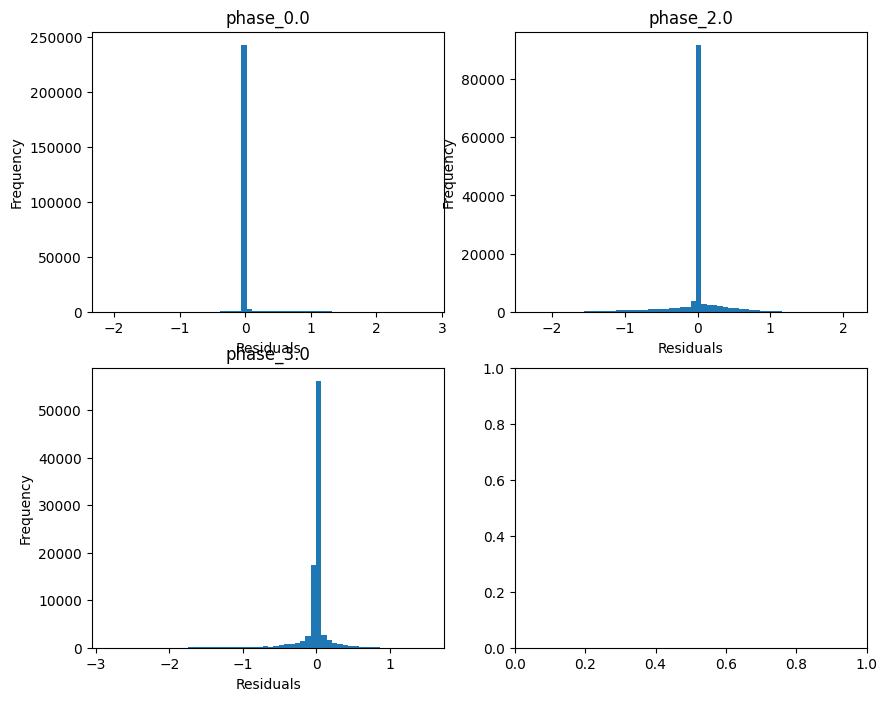

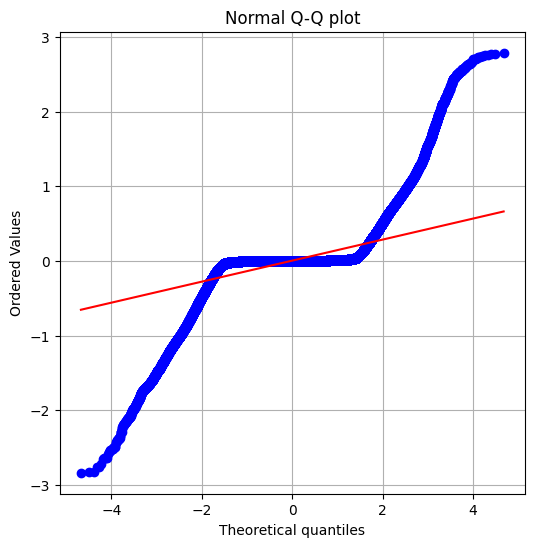

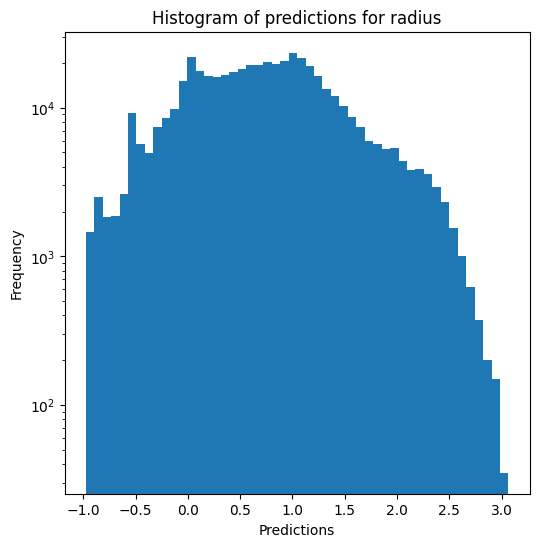

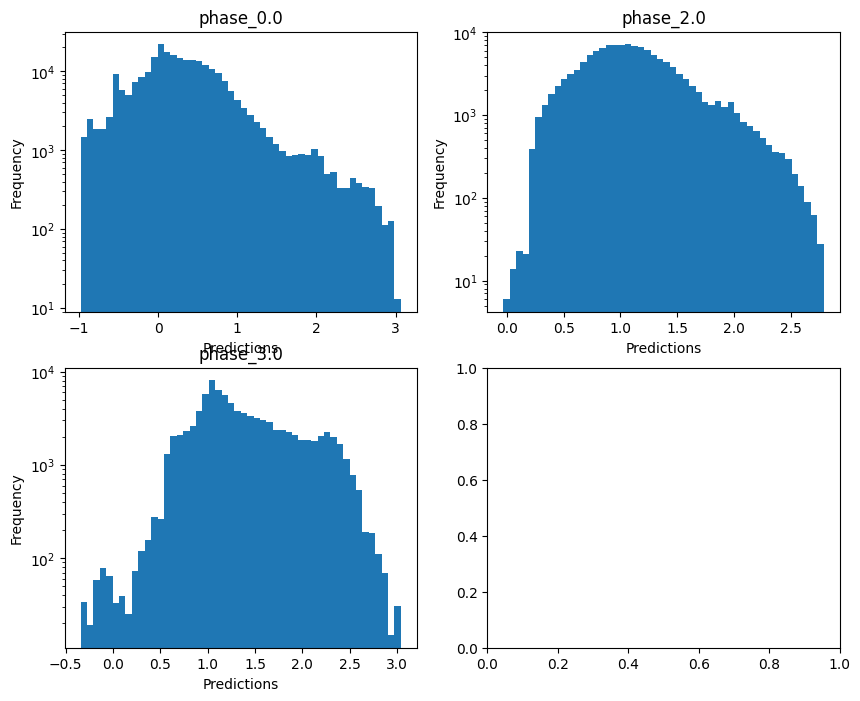

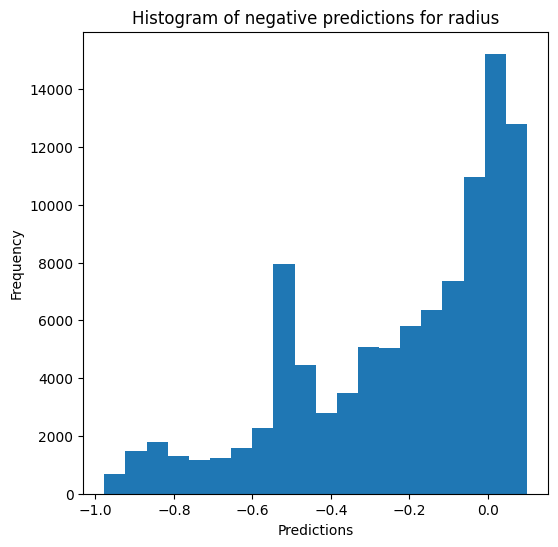

Saving predictions and results...


In [17]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### Random forests

In [18]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9741790168630927
  RMSE :  0.056737322802883926
  MAE :  0.01024046369729759
  MedAE :  0.0005805318581346697
  CORR :  0.9871268181464751
  MAX_ER :  0.9062704857537334
  Percentiles : 
    75th percentile :  0.0014955873619917348
    90th percentile :  0.005039449032544366
    95th percentile :  0.022185987926644623
    99th percentile :  0.30808955511672986

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.9748517740047027
  RMSE :  0.05018917329063841
  MAE :  0.019917669925581194
  MedAE :  0.0020875444345103134
  CORR :  0.9873497472698224
  MAX_ER :  0.7218829083489968
  Percentiles : 
    75th percentile :  0.011224204068788213
    90th percentile :  0.068643664770172

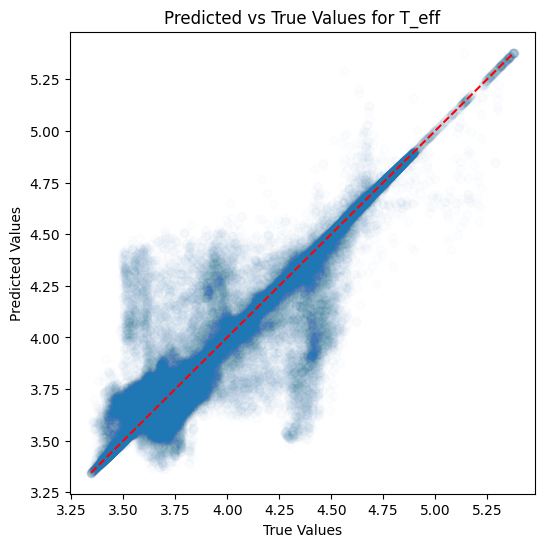

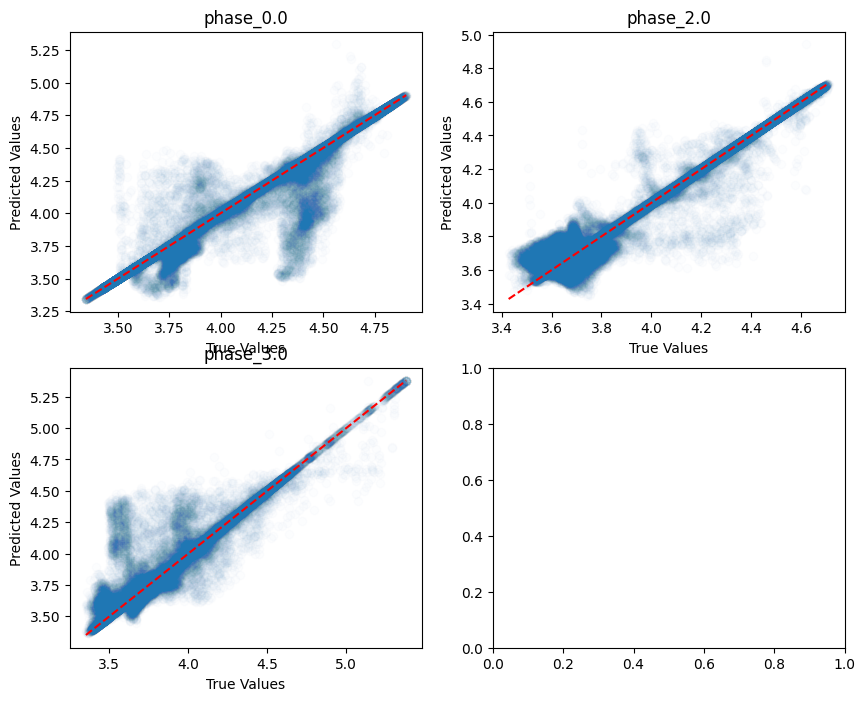

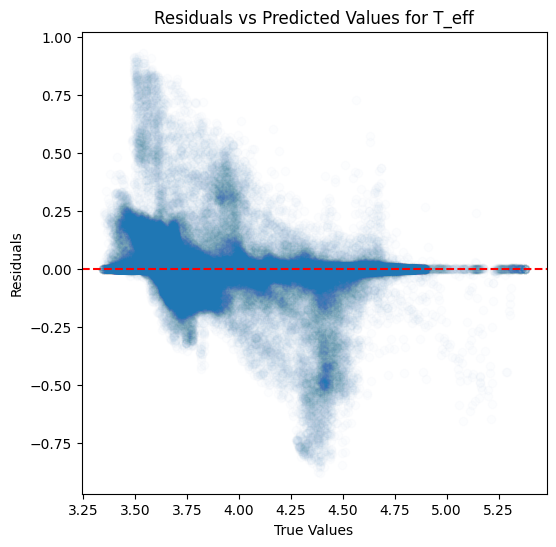

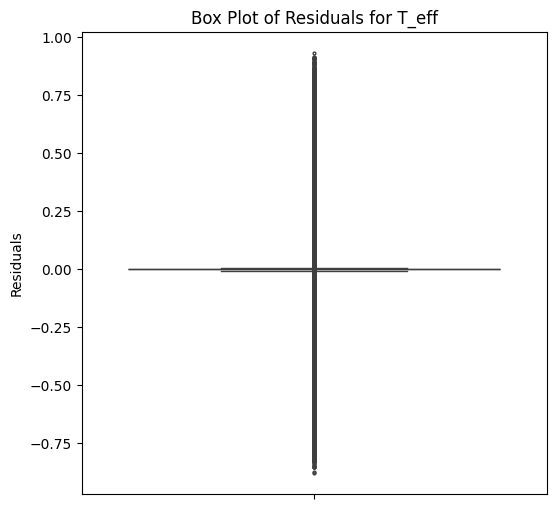

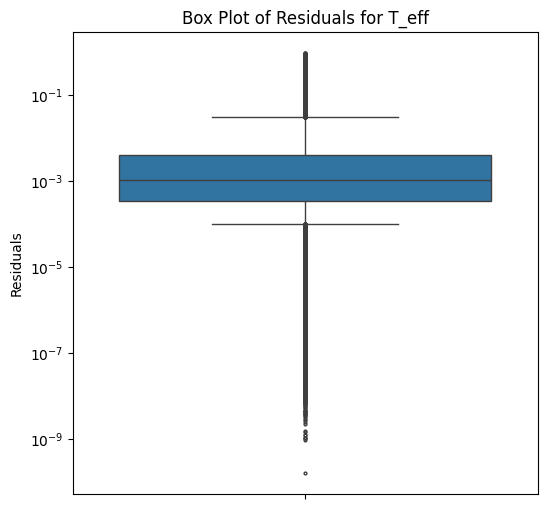

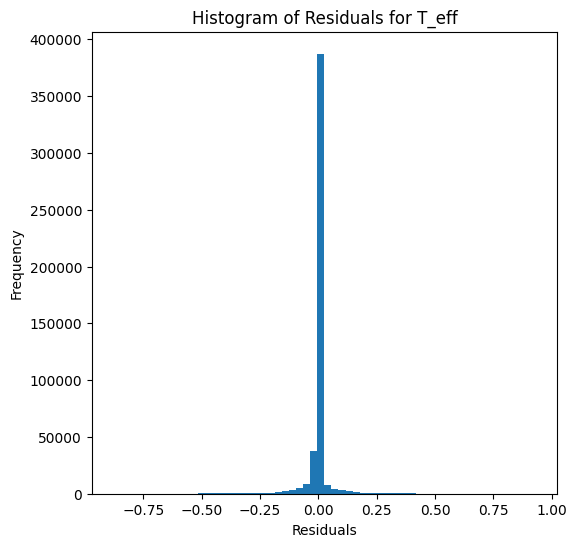

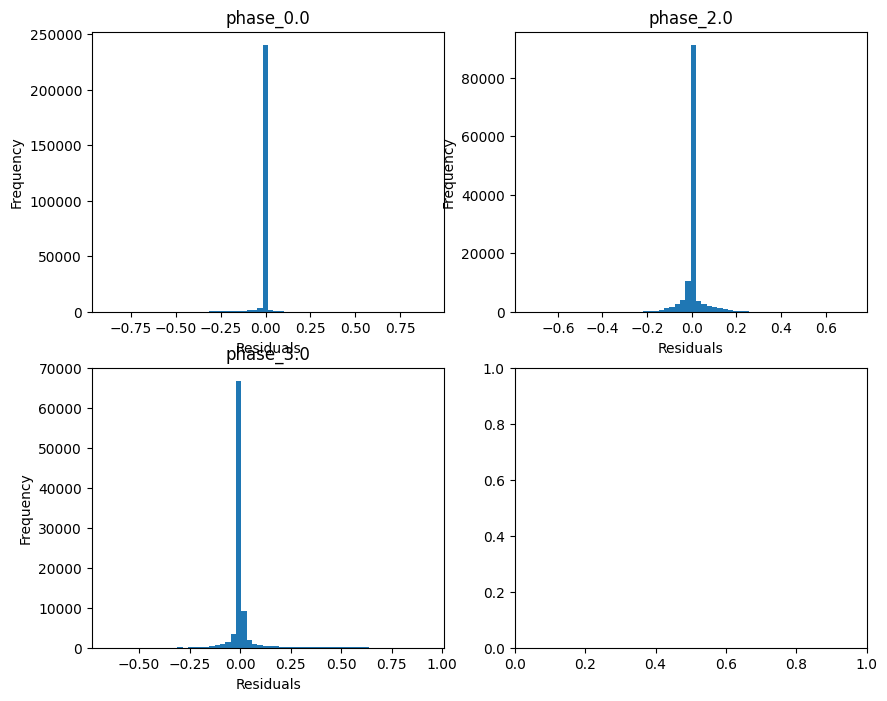

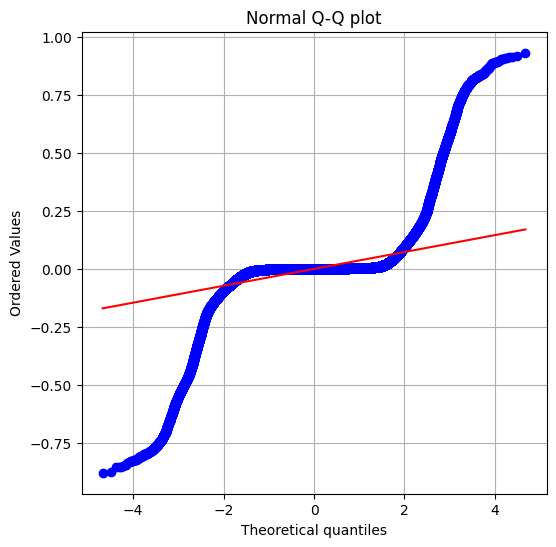

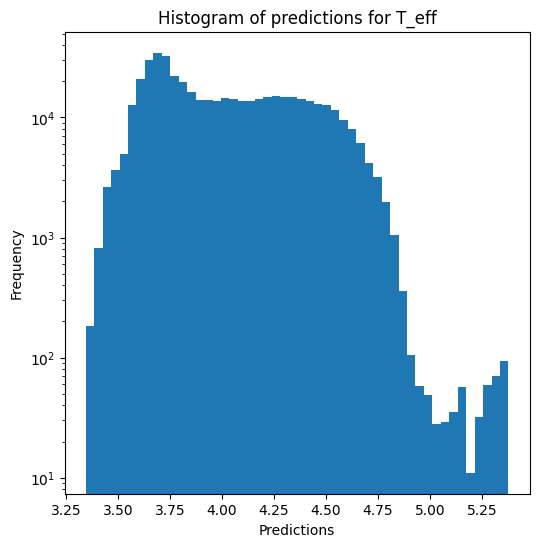

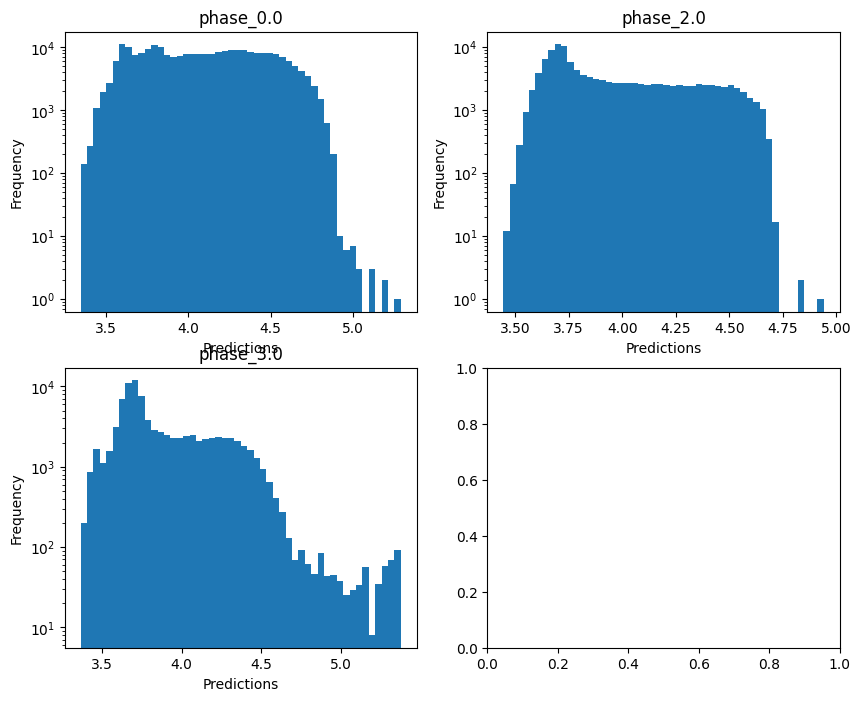


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.655578527090177
  RMSE :  0.370945147843555
  MAE :  0.06815893541176649
  MedAE :  0.0017672254513214636
  CORR :  0.8637955961746254
  MAX_ER :  5.581691405934251
  Percentiles : 
    75th percentile :  0.005276076852015477
    90th percentile :  0.019428178336301463
    95th percentile :  0.1398245213836648
    99th percentile :  2.1971387559791995

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.3865126783099391
  RMSE :  0.713288595511472
  MAE :  0.3016695719953585
  MedAE :  0.010245800356776247
  CORR :  0.6632740848405663
  MAX_ER :  4.588042650112612
  Percentiles : 
    75th percentile :  0.13877084723505662
    90th percentile :  1.2365708978240277
    95th percentile :  1.8650059973644568
    99th percentile :  2.8629803927522155

log_g results for the phase category with a

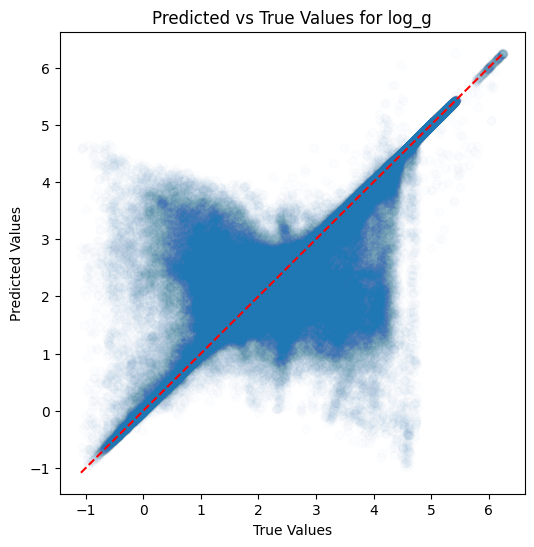

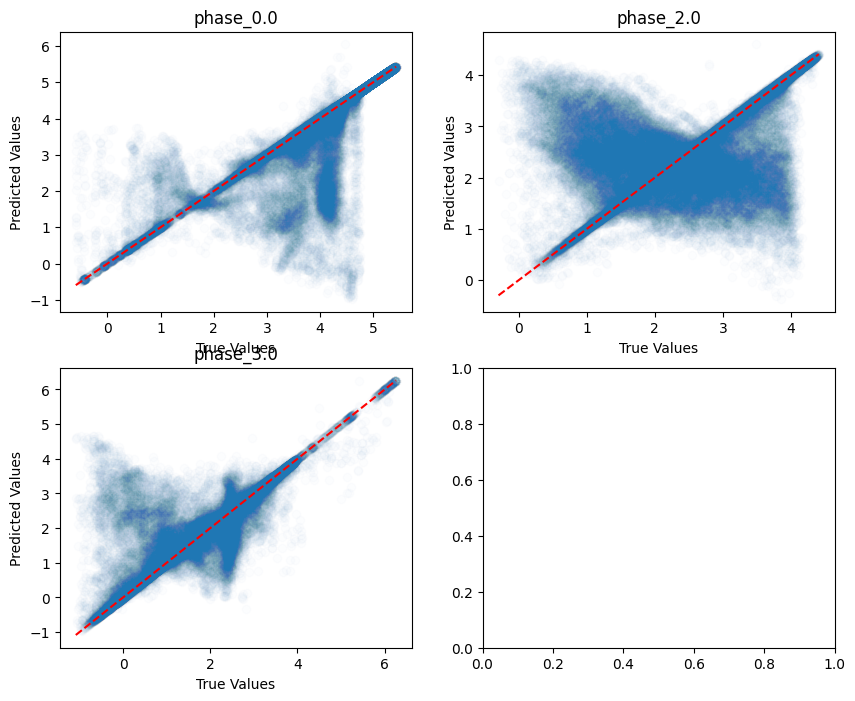

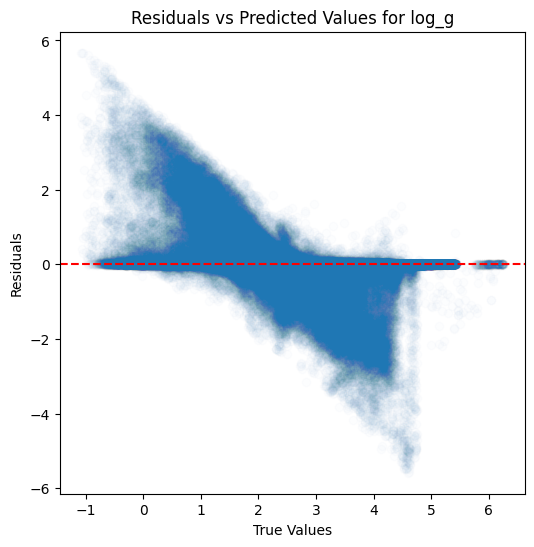

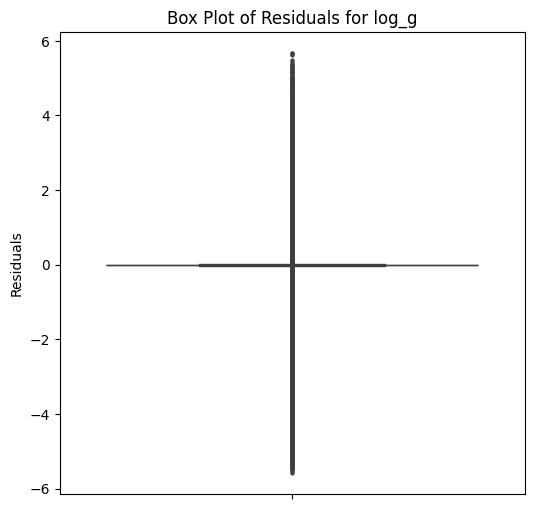

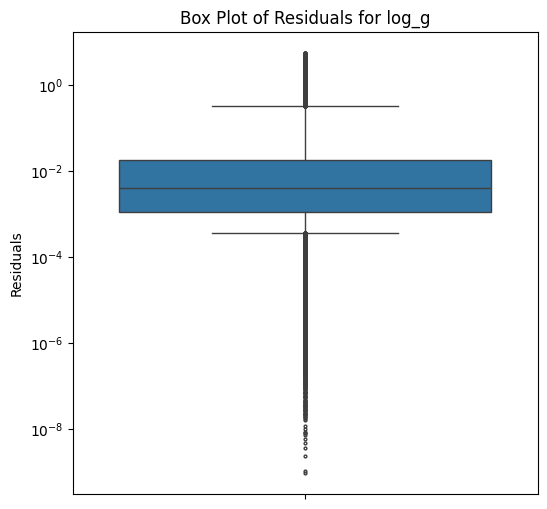

...

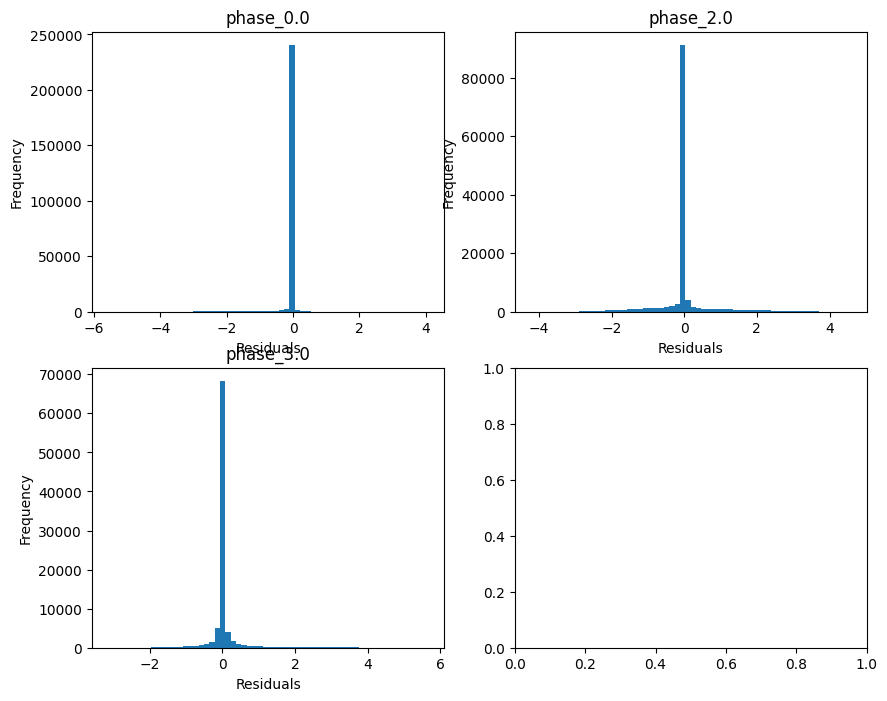

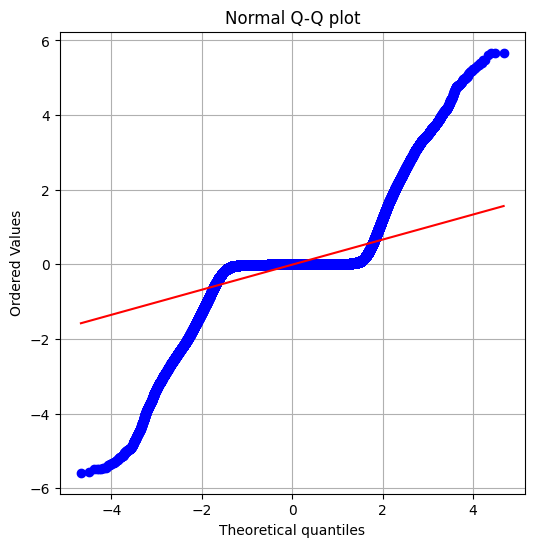

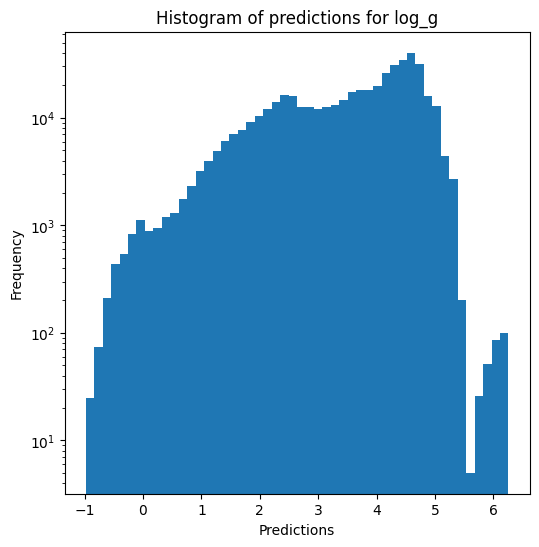

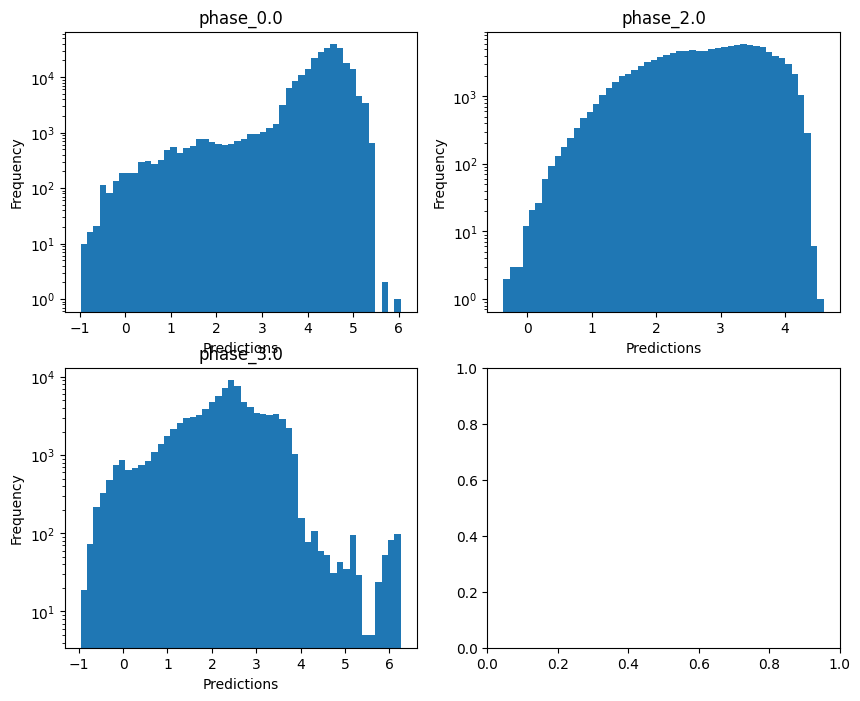

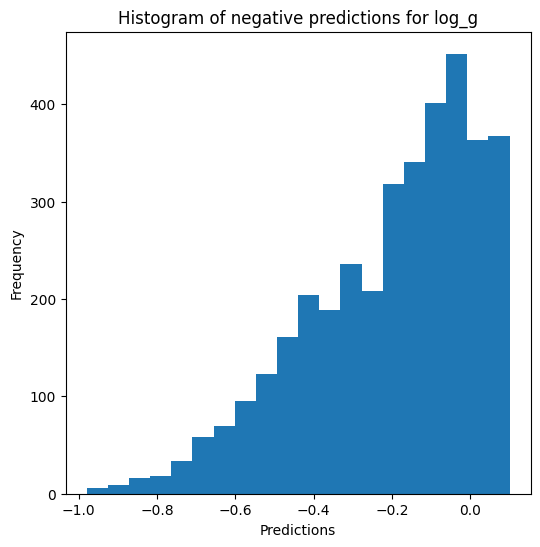


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8959275756314524
  RMSE :  0.1856745455016884
  MAE :  0.03443661593712334
  MedAE :  0.0011518152284766547
  CORR :  0.9515541860187633
  MAX_ER :  2.7926071252493414
  Percentiles : 
    75th percentile :  0.0031731694418088707
    90th percentile :  0.010694924869490209
    95th percentile :  0.07045877947718719
    99th percentile :  1.0991987534099026

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.4723079693772537
  RMSE :  0.35663703855321477
  MAE :  0.15083732772284775
  MedAE :  0.005130617310846908
  CORR :  0.7207160307733551
  MAX_ER :  2.2940788900699105
  Percentiles : 
    75th percentile :  0.06940233997136036
    90th percentile :  0.6182666547531097
    95th percentile :  0.9325265338878368
    99th percentile :  1.4315718373399113

radius results for the phase cat

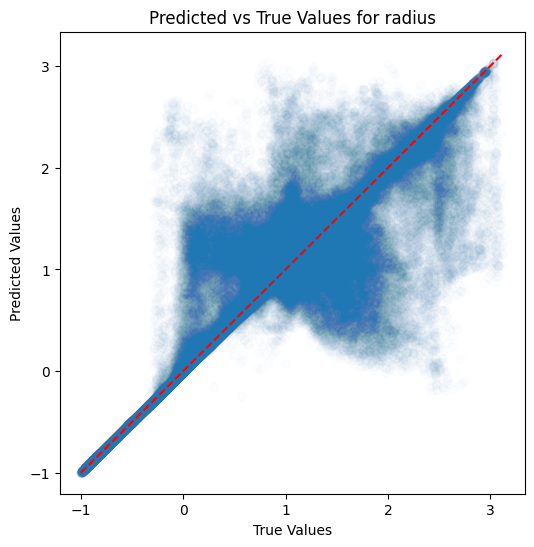

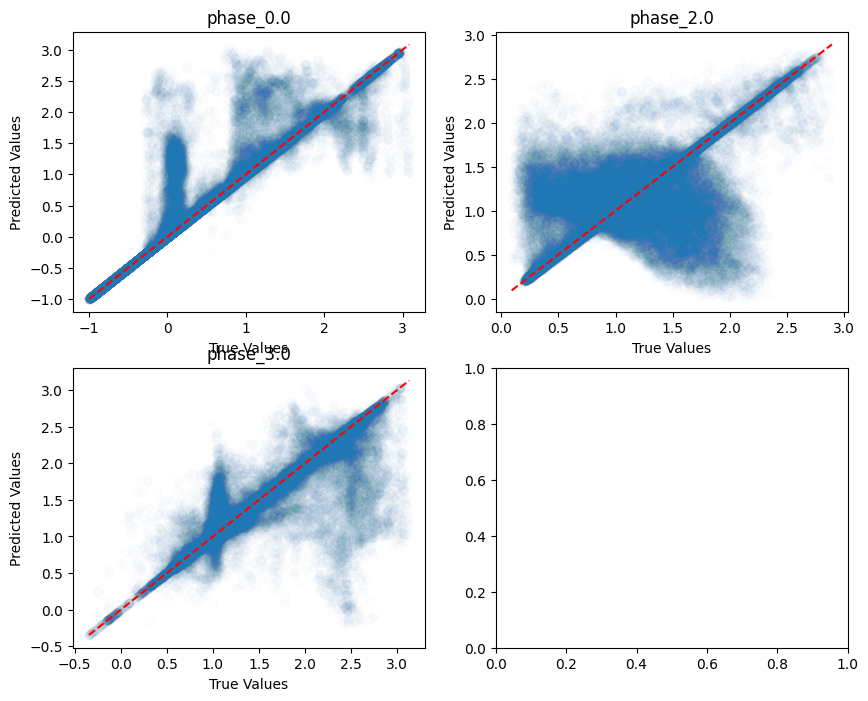

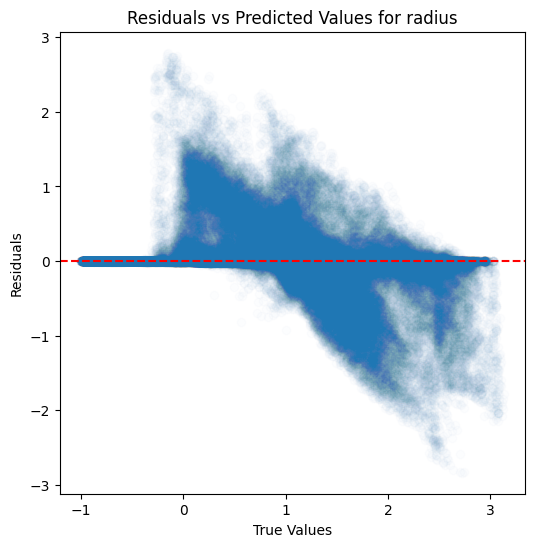

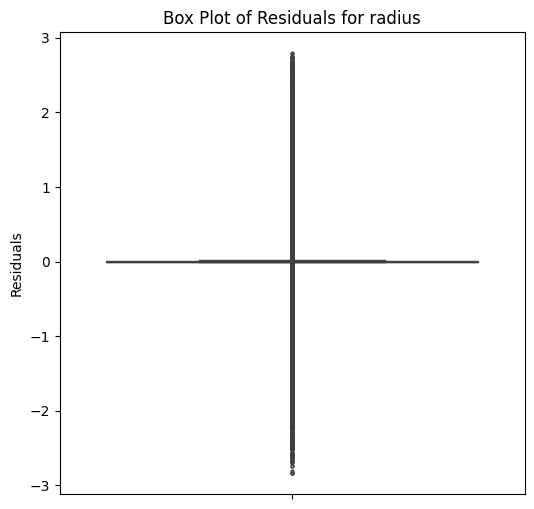

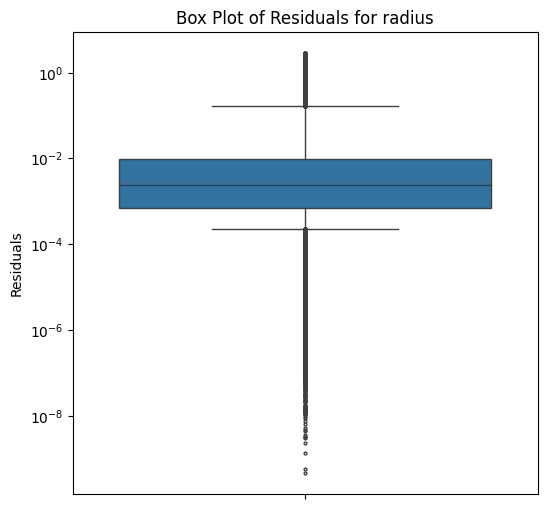

...

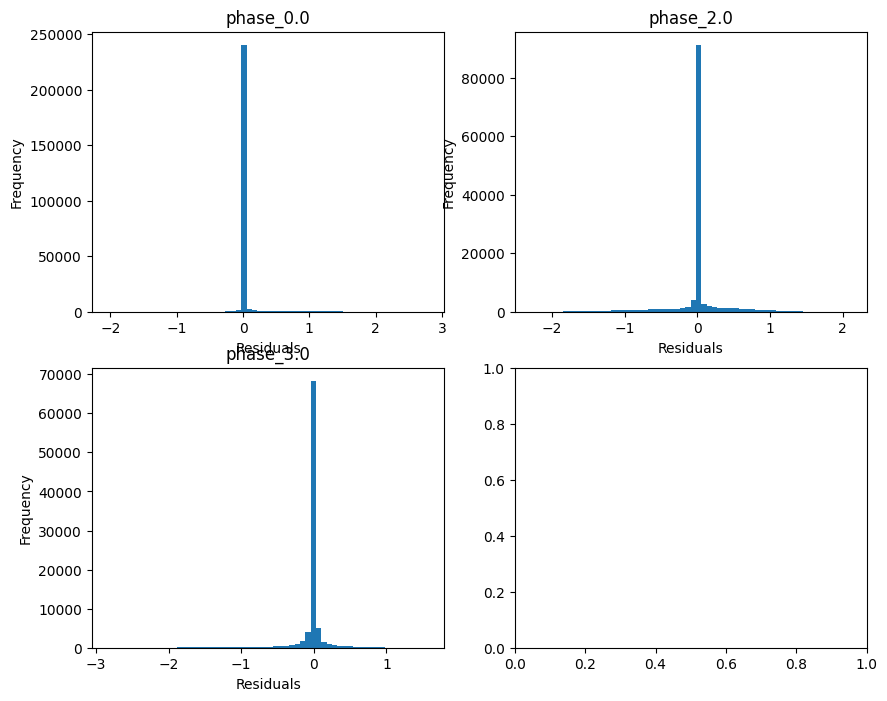

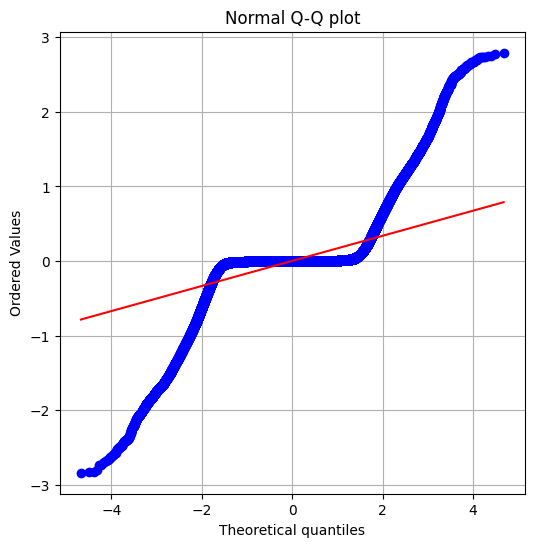

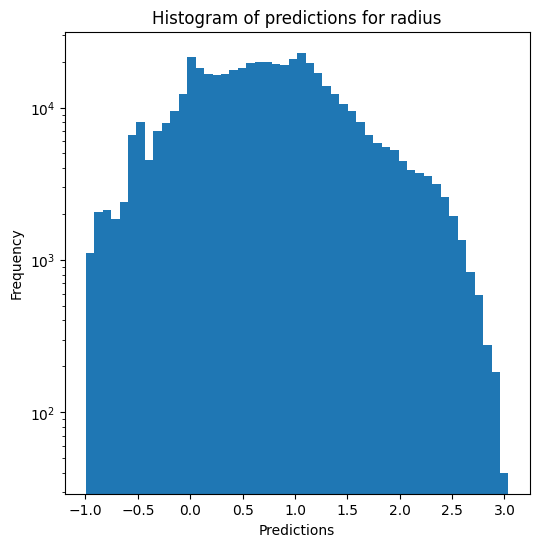

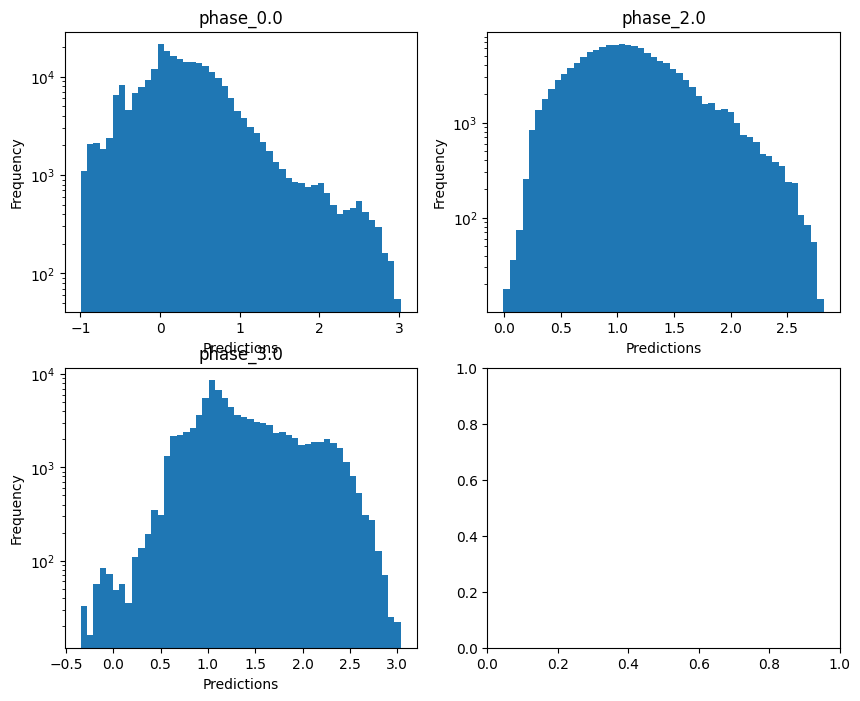

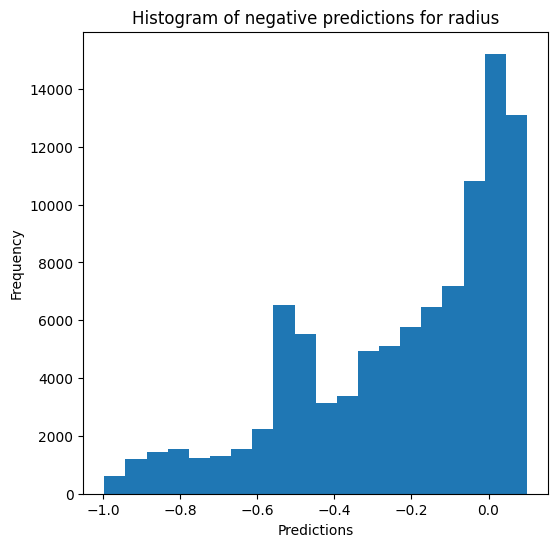

Saving predictions and results...


In [19]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)
# average depth de 44-46

### XGBoost

In [20]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9411979038677618
  RMSE :  0.09190744674474444
  MAE :  0.050555797119303886
  MedAE :  0.01590655162132526
  CORR :  0.9704129128295416
  MAX_ER :  0.777952955880413
  Percentiles : 
    75th percentile :  0.061420609241444435
    90th percentile :  0.15532772584849133
    95th percentile :  0.2225819508426598
    99th percentile :  0.3464411070091212

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.874489716153028
  RMSE :  0.11413188426520413
  MAE :  0.08515972438817844
  MedAE :  0.06452264345746261
  CORR :  0.9358520653482332
  MAX_ER :  0.4923524372425172
  Percentiles : 
    75th percentile :  0.11840149922954546
    90th percentile :  0.1881439894173232
    95th pe

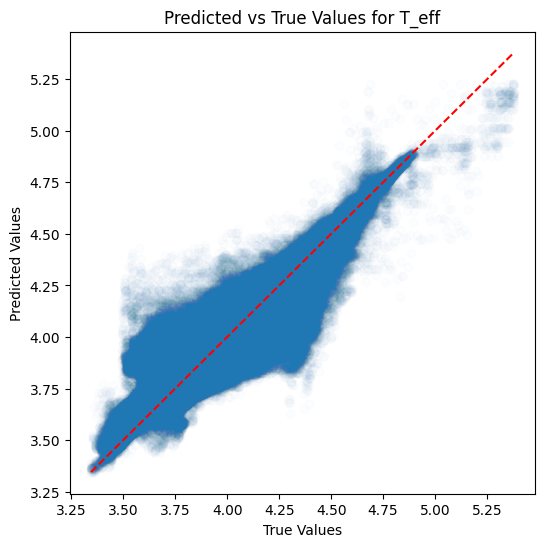

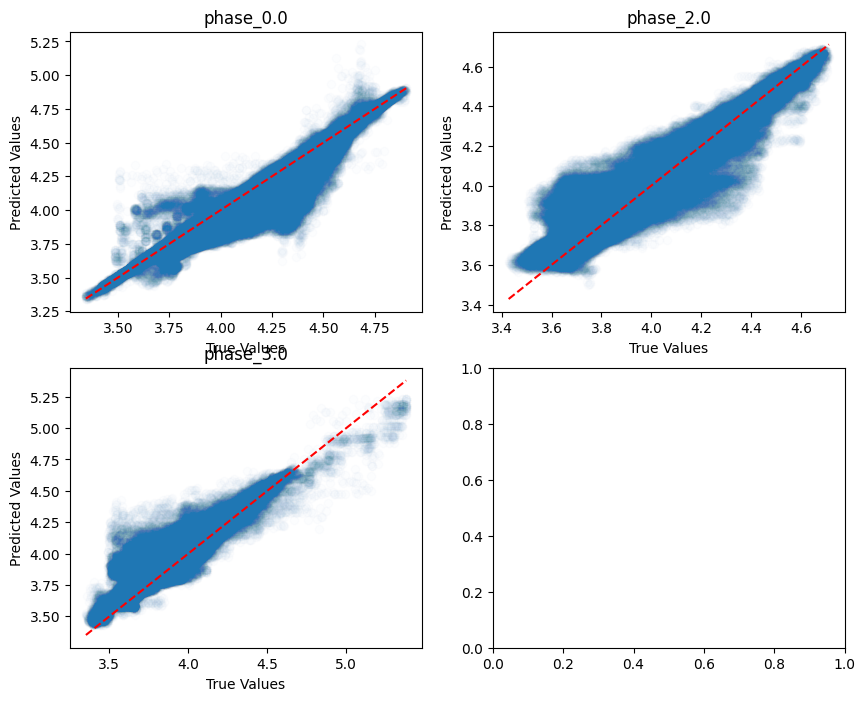

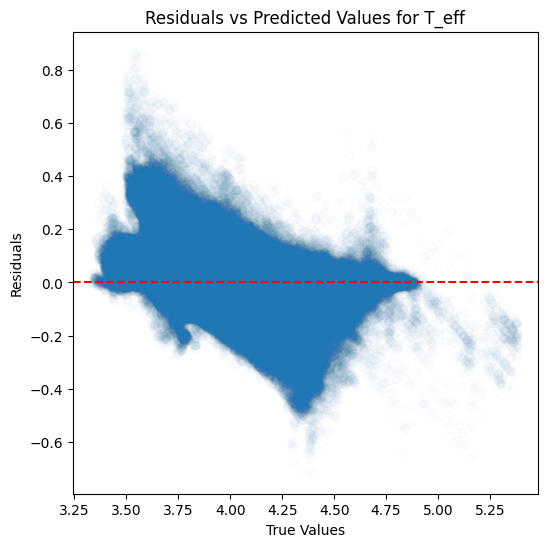

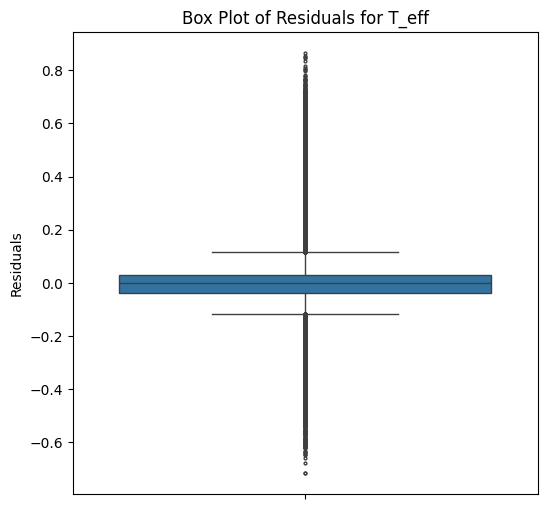

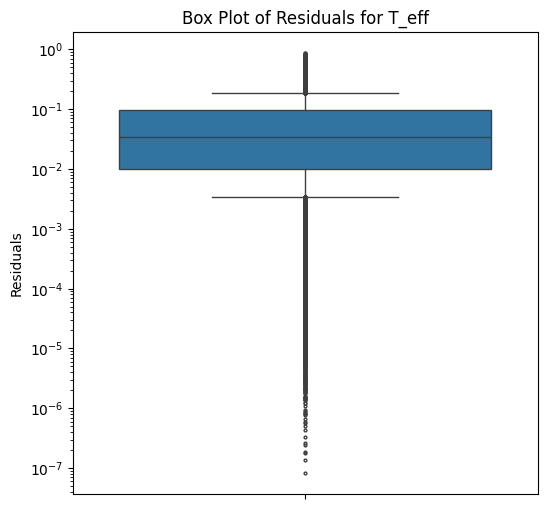

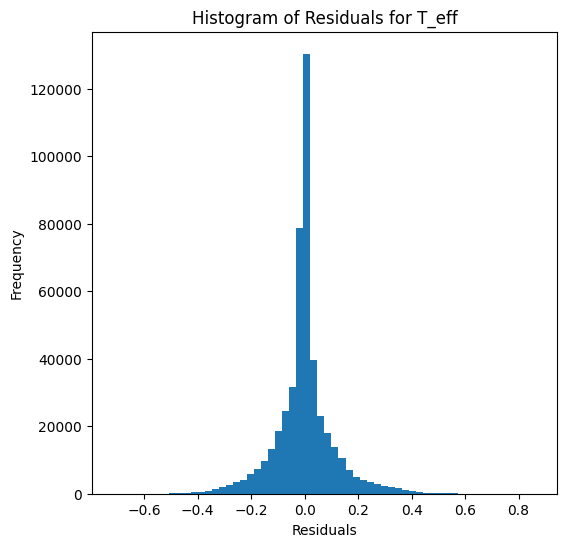

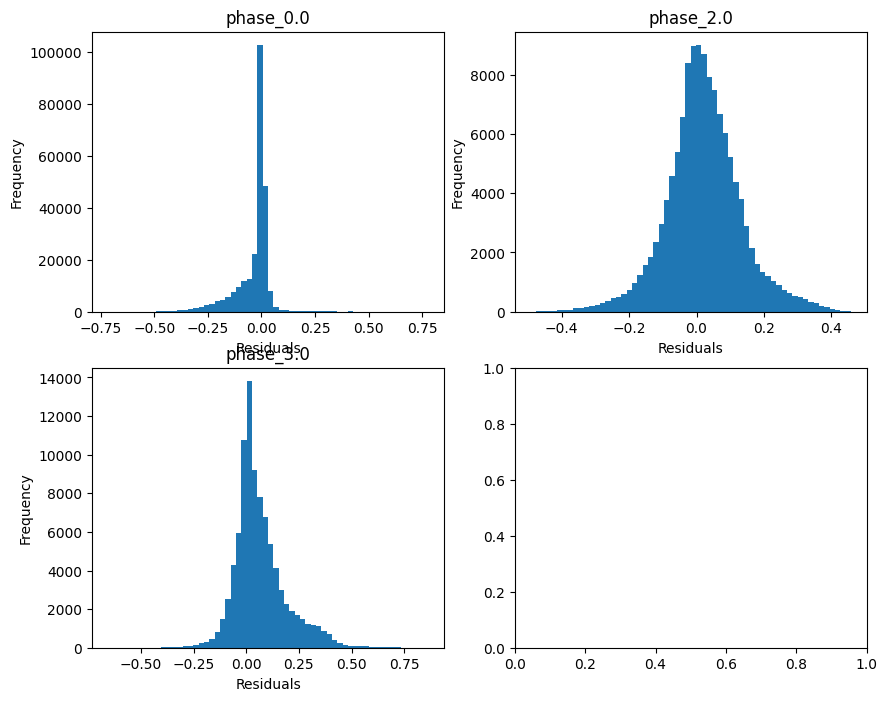

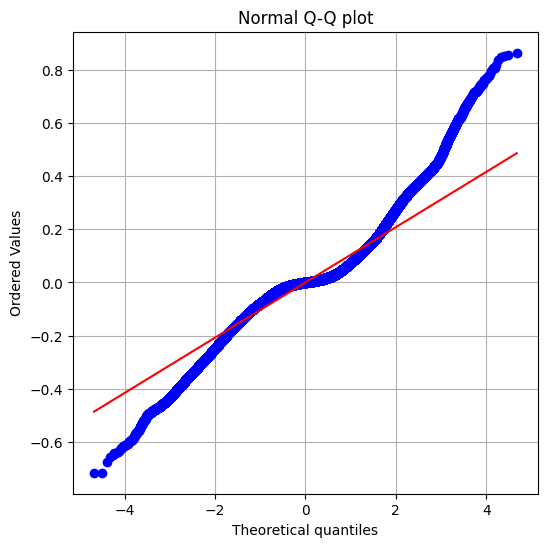

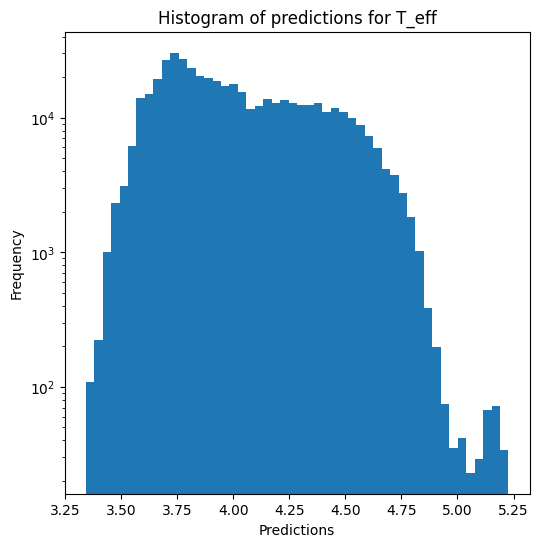

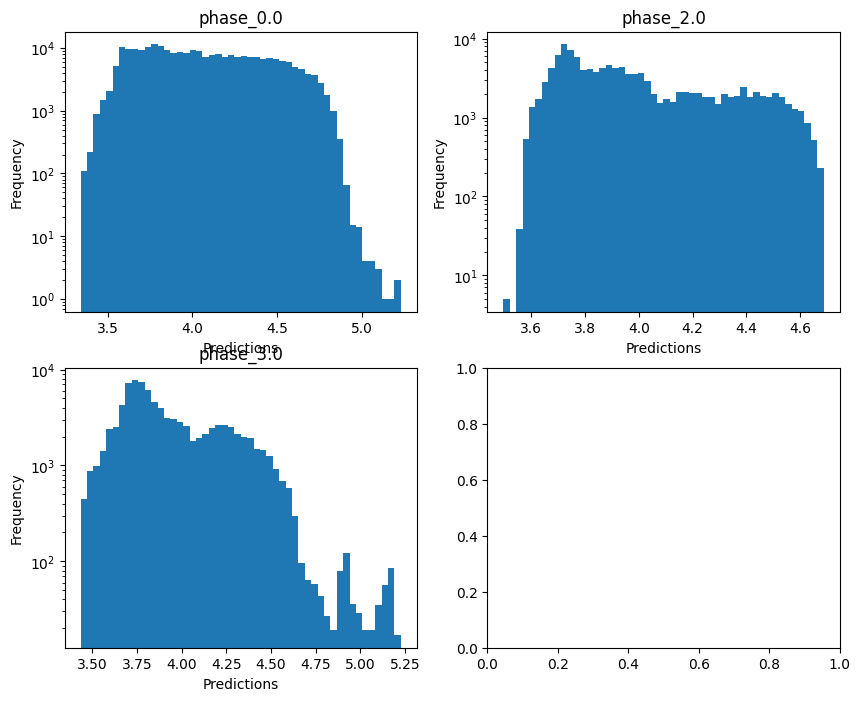


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.44725040714391595
  RMSE :  0.5083857422564912
  MAE :  0.2840197453411623
  MedAE :  0.08410799582765671
  CORR :  0.8355283484911415
  MAX_ER :  5.006997007785429
  Percentiles : 
    75th percentile :  0.37590552204225003
    90th percentile :  0.8888548148617991
    95th percentile :  1.1847854488249754
    99th percentile :  1.7279796667302267

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.4145312350522812
  RMSE :  0.7032688283624204
  MAE :  0.5284741013982597
  MedAE :  0.39693018905222655
  CORR :  0.6440115892267994
  MAX_ER :  3.7436556122563713
  Percentiles : 
    75th percentile :  0.7715153976698822
    90th percentile :  1.1788450249099511
    95th percentile :  1.4506624570536135
    99th percentile :  2.0291985432054718

log_g results for the phase category with a va

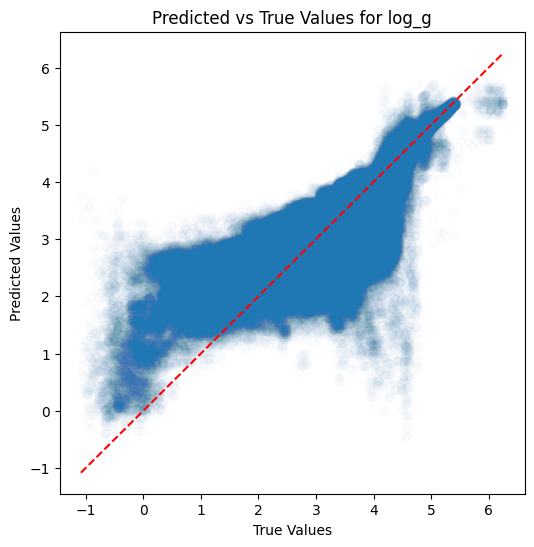

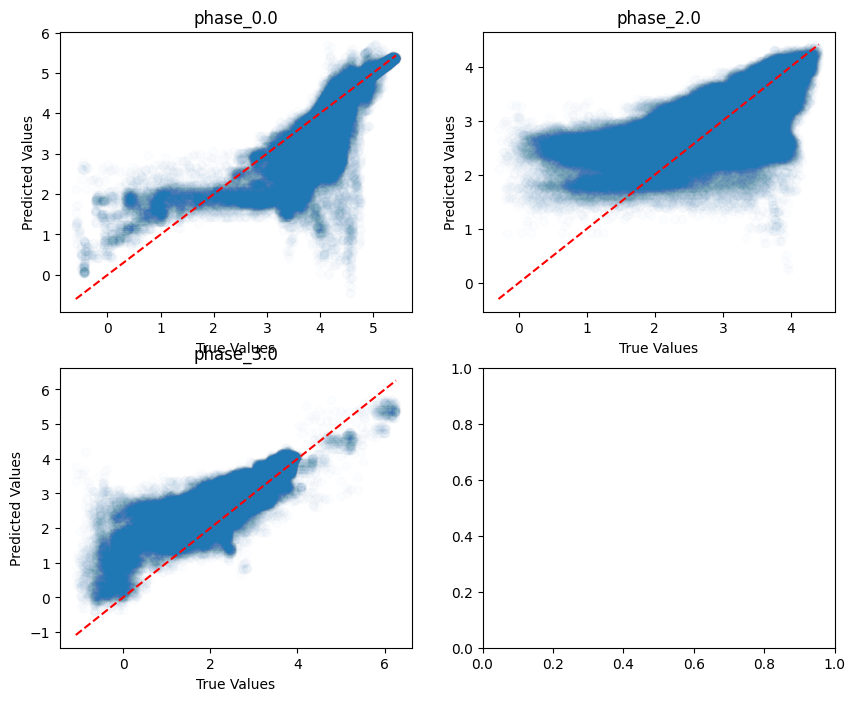

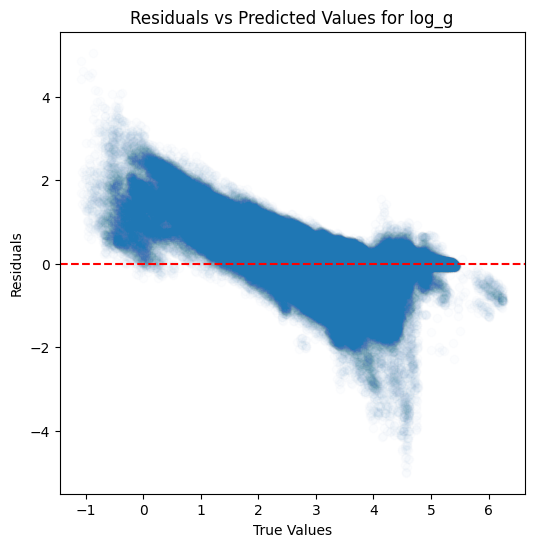

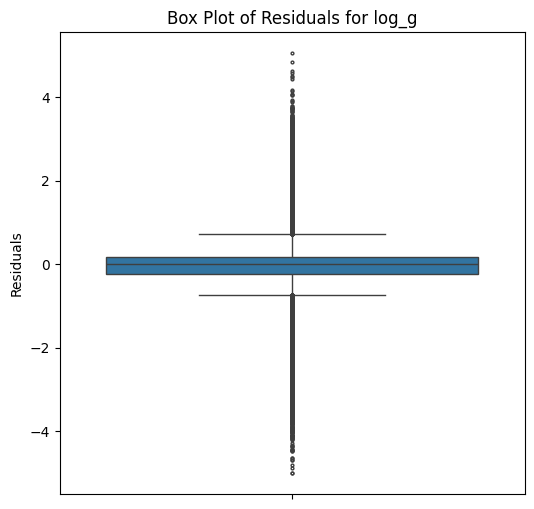

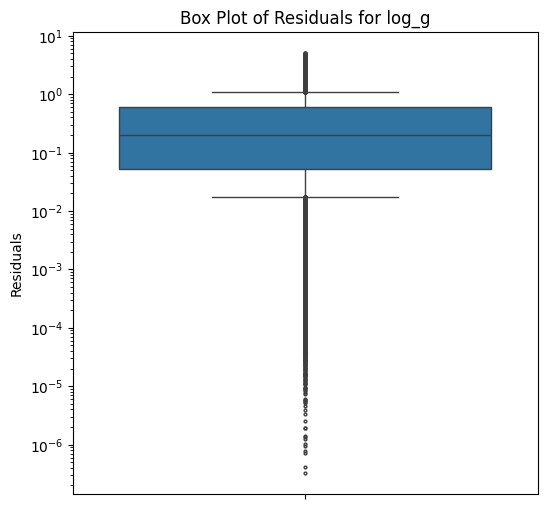

...

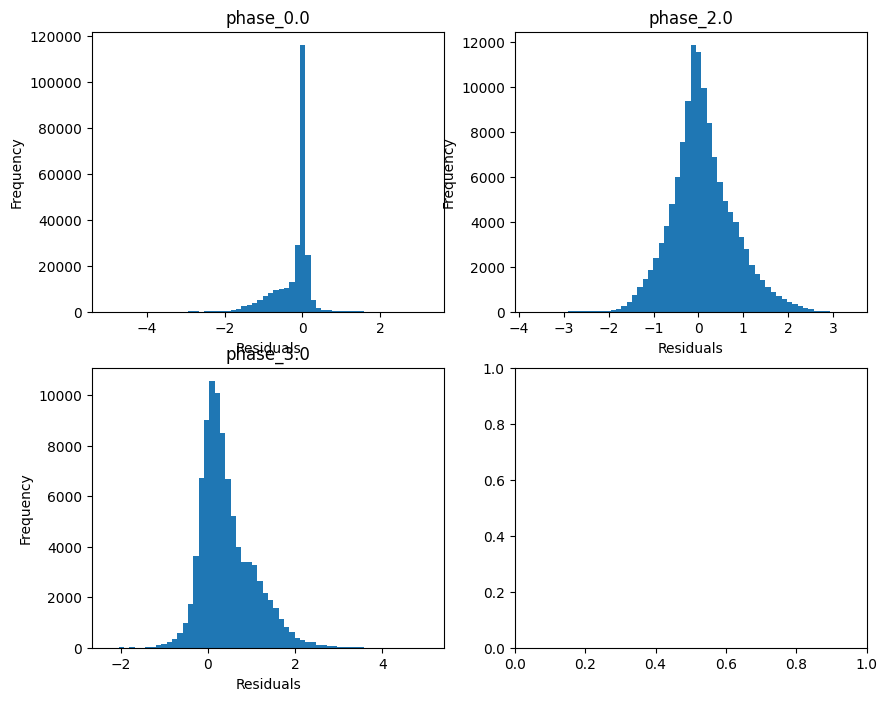

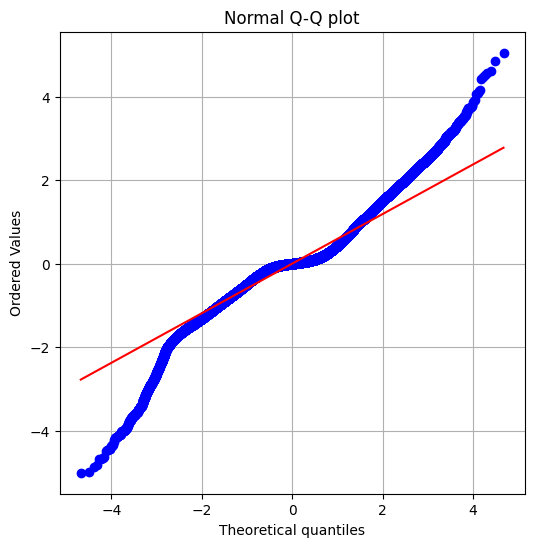

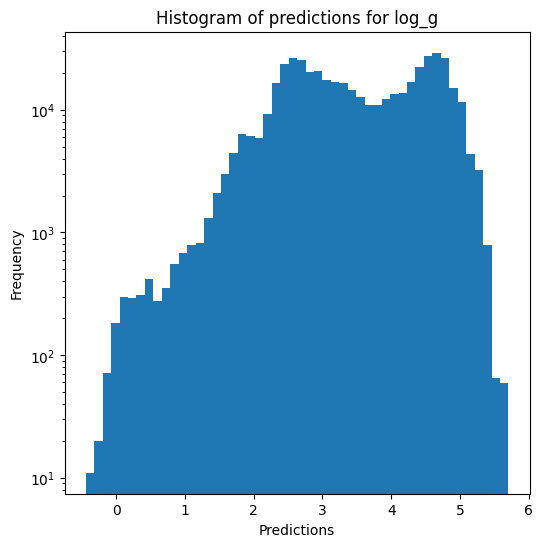

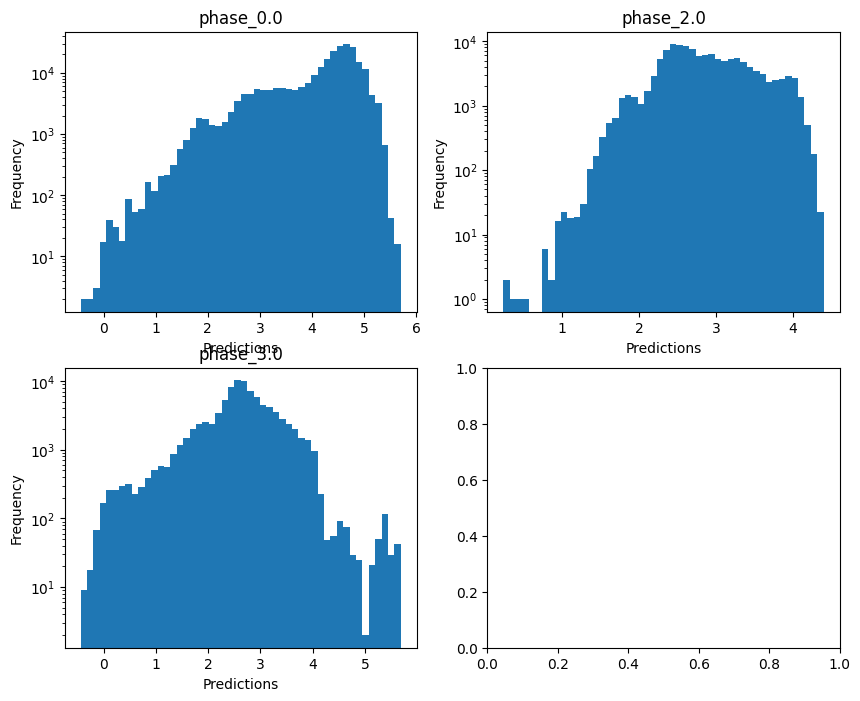

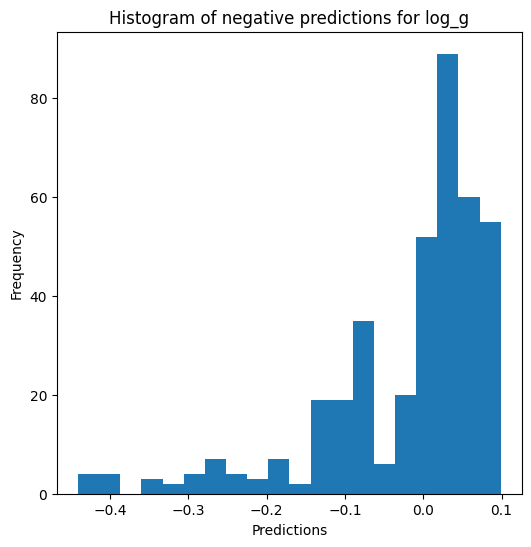


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8315916300000741
  RMSE :  0.25547440188236287
  MAE :  0.1417245525920178
  MedAE :  0.03883486275860126
  CORR :  0.9313568658432774
  MAX_ER :  2.549726285254965
  Percentiles : 
    75th percentile :  0.18825588629234136
    90th percentile :  0.44734104665259733
    95th percentile :  0.5999038302471098
    99th percentile :  0.8622992941808818

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.49662050975293337
  RMSE :  0.35143256699688324
  MAE :  0.264171894210389
  MedAE :  0.19836385117455846
  CORR :  0.7060130202280788
  MAX_ER :  1.9207776504055352
  Percentiles : 
    75th percentile :  0.38561543656260217
    90th percentile :  0.5901375528446513
    95th percentile :  0.7244963419895144
    99th percentile :  1.016306036088848

radius results for the phase category with

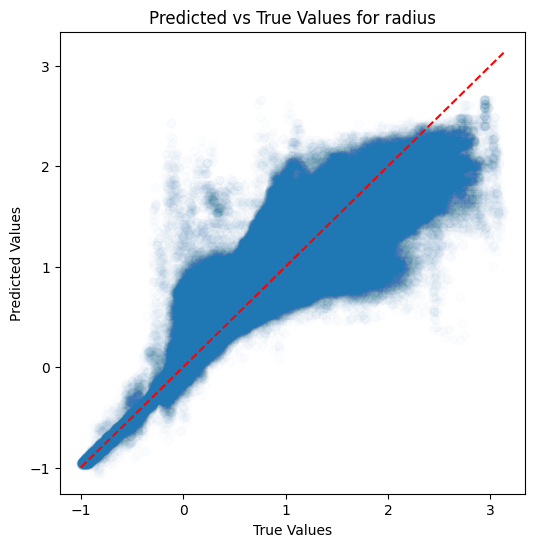

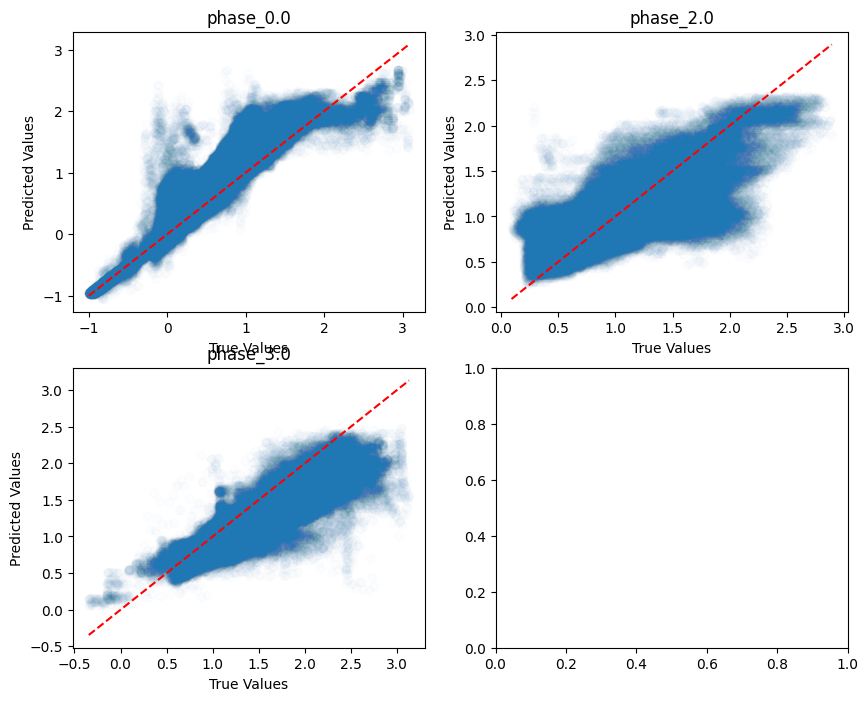

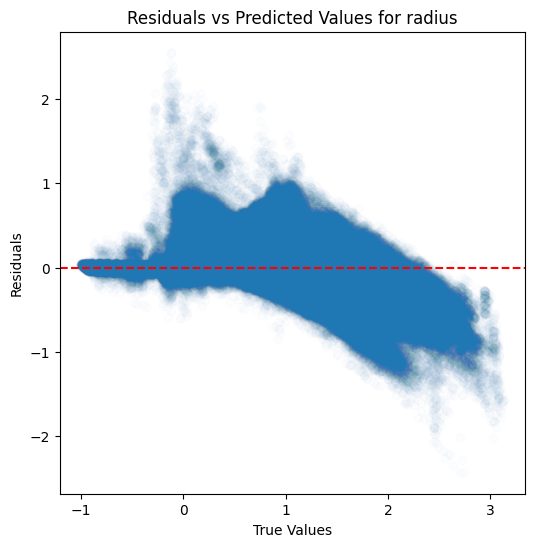

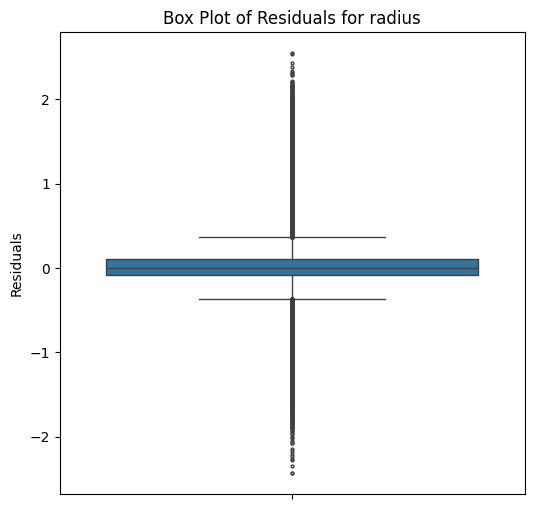

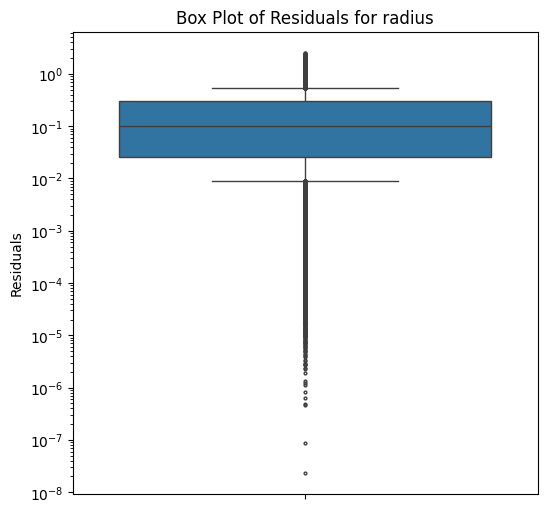

...

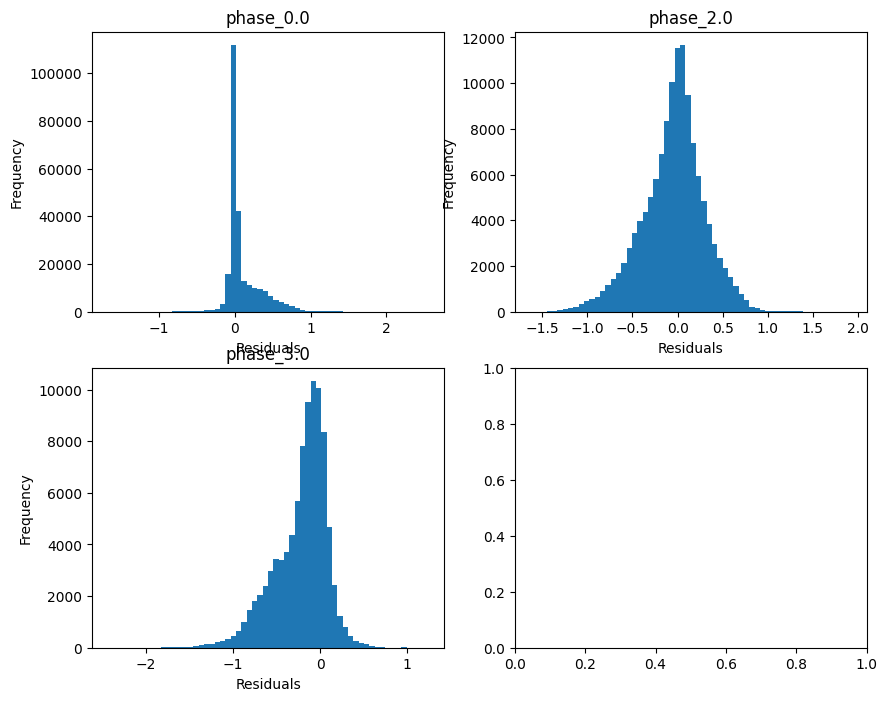

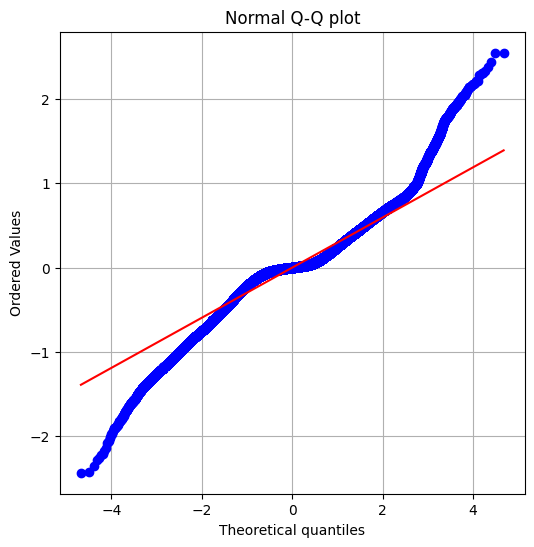

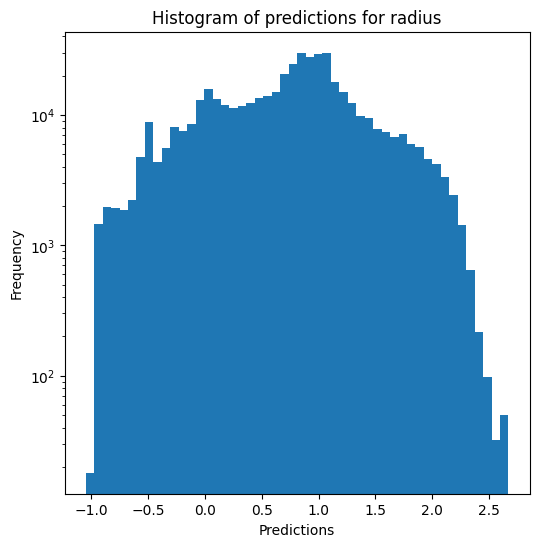

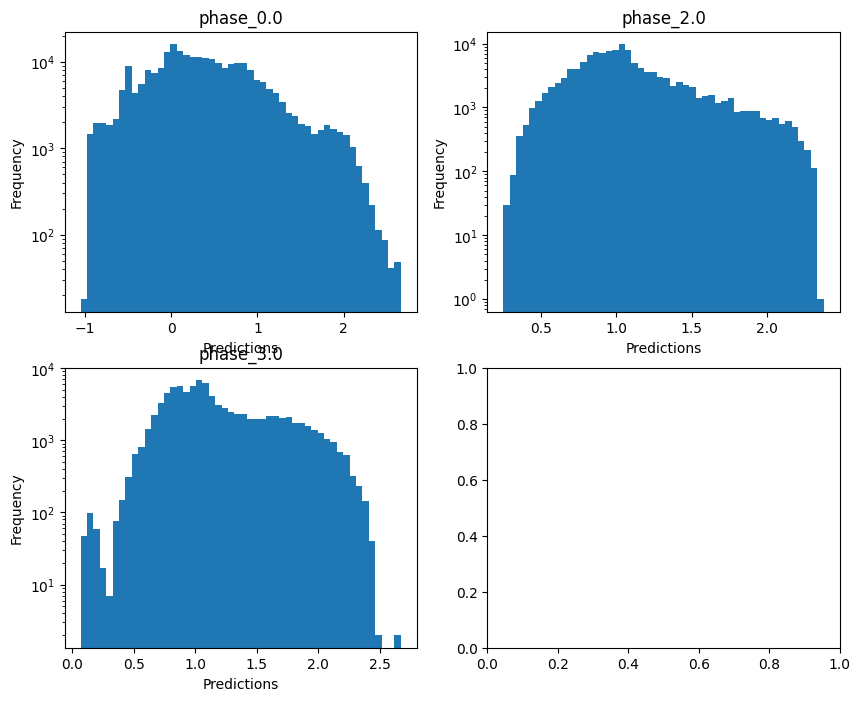

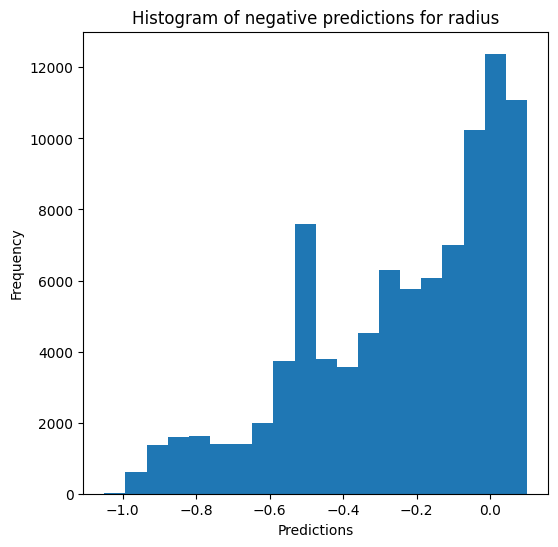

Saving predictions and results...


In [21]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)

### Multi-layer perceptron

In [22]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_power train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07579292946106642
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07636721457466251
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07462809095314467
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07499606547403649
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.0759253172701292

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.9301492649805465
  RMSE :  0.0930161474027386
  MAE :  0.06252026046129996
  MedAE :  0.04628752743959064
  CORR :  0.9652979820066797
  MAX_ER :  0.819166387795776
  Percentiles : 
    75th percentile :  0.07423306128062479
    90th percentile :  0.11972642676100877
    95th percentile :  0.20312937299842396
    99th percentile :  0.3697761838397998

T_eff results for the phase category with a value of 2.0
  value range :  3.42785685311742 - 4.711472733477716
  RVE :  0.8711307553976656
  RMSE :  0.1151667122665029
  MAE :  0.08397843345139094
  MedAE :  0.0610386847756903
  CORR :  0.9333446000486072
  MAX_ER :  0.6195825452780359
  Percentiles : 
    75th percentile :  0.11342692243943797
    90th percentile :  0.18892356403686064
    95th percentile :  0.2522915728452645
    99th percentile :  0.3

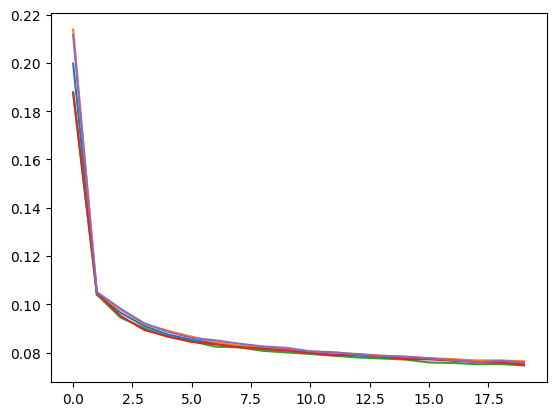

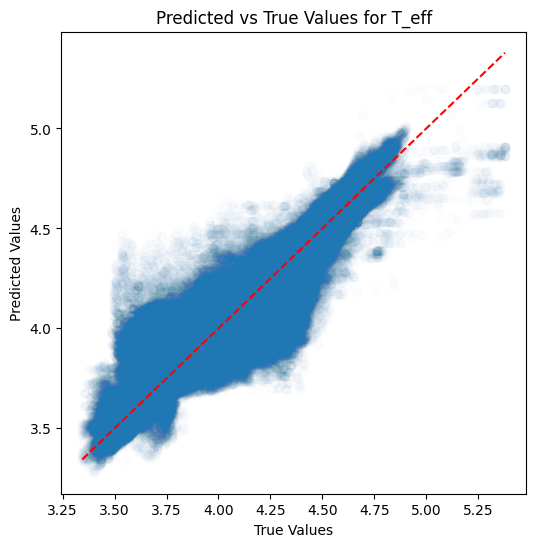

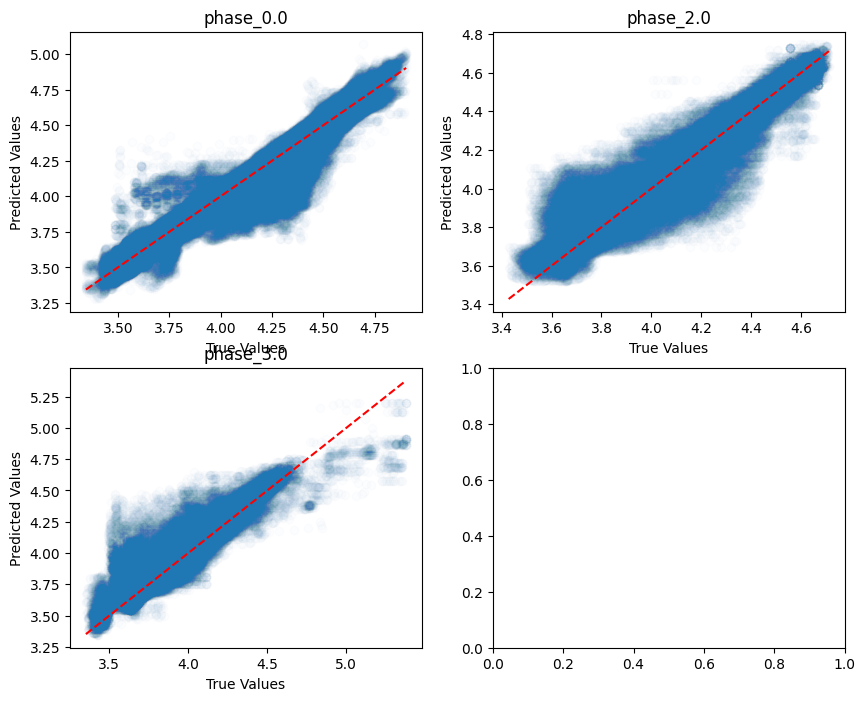

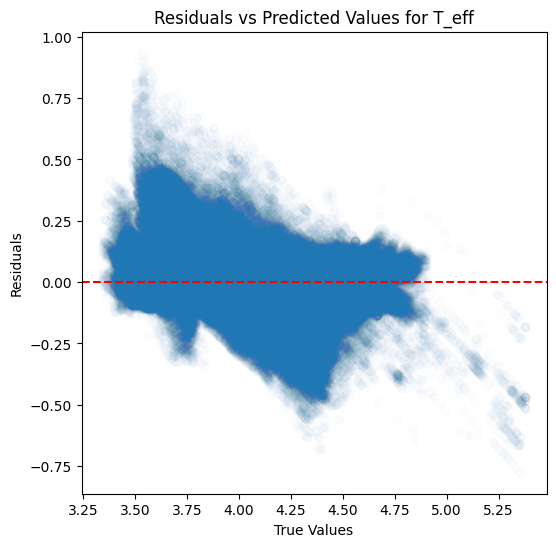

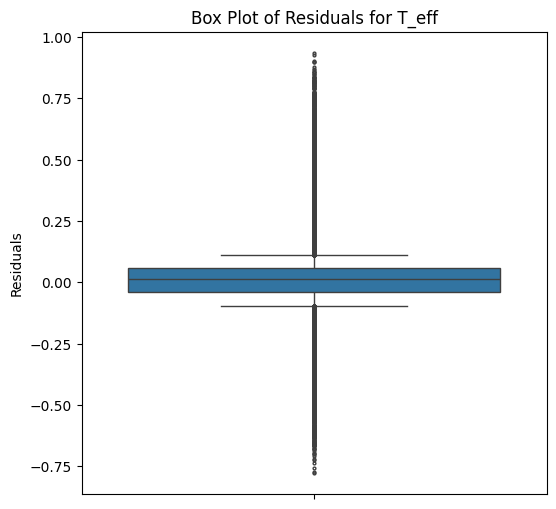

...

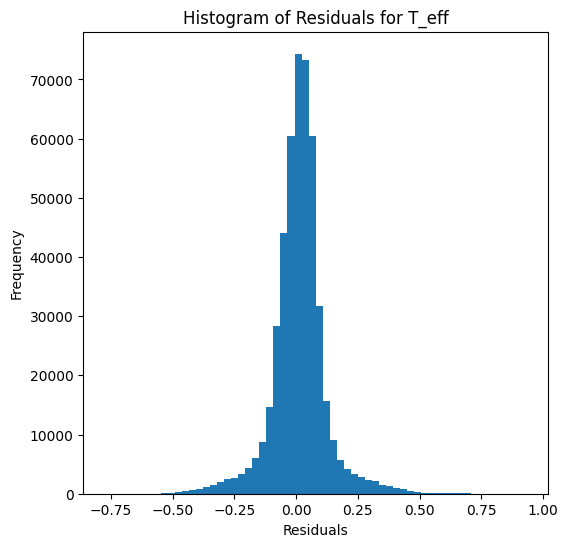

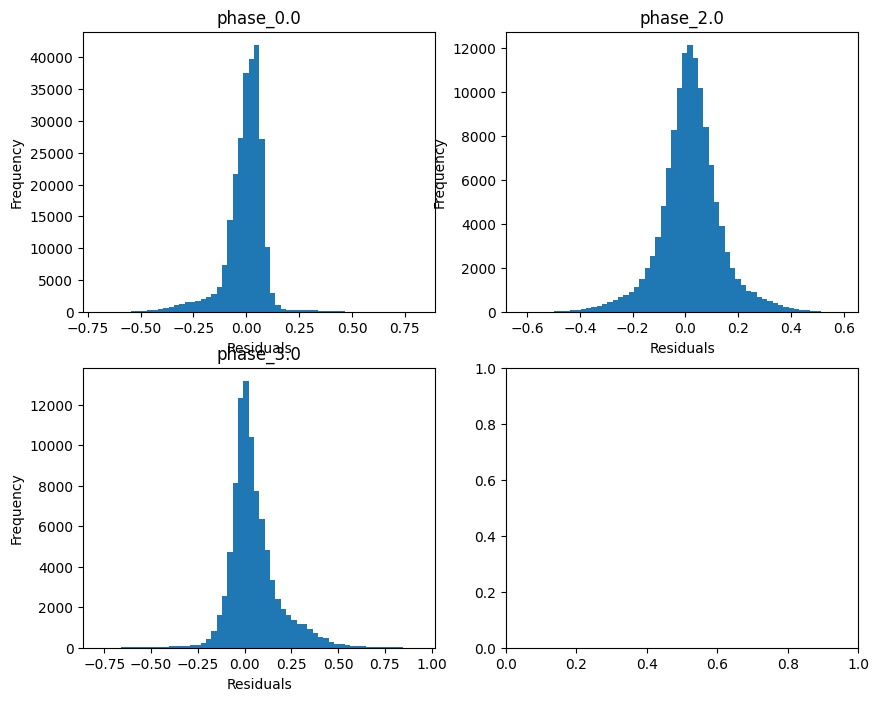

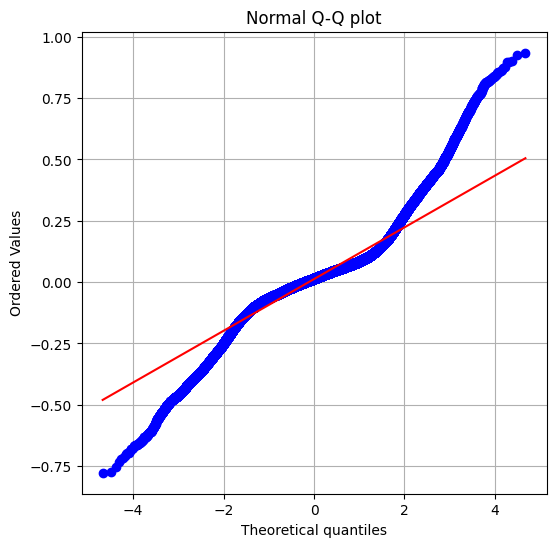

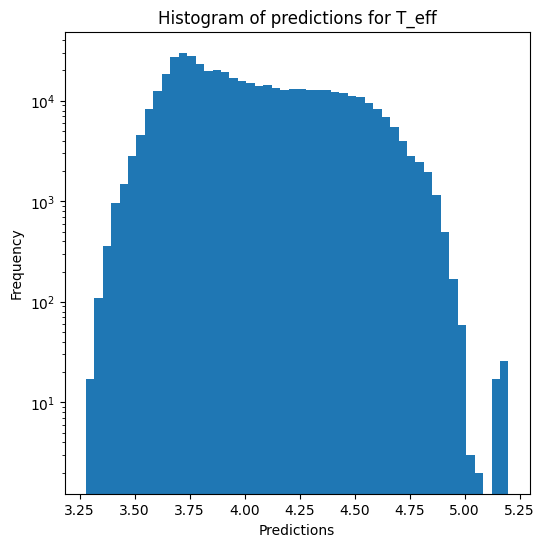

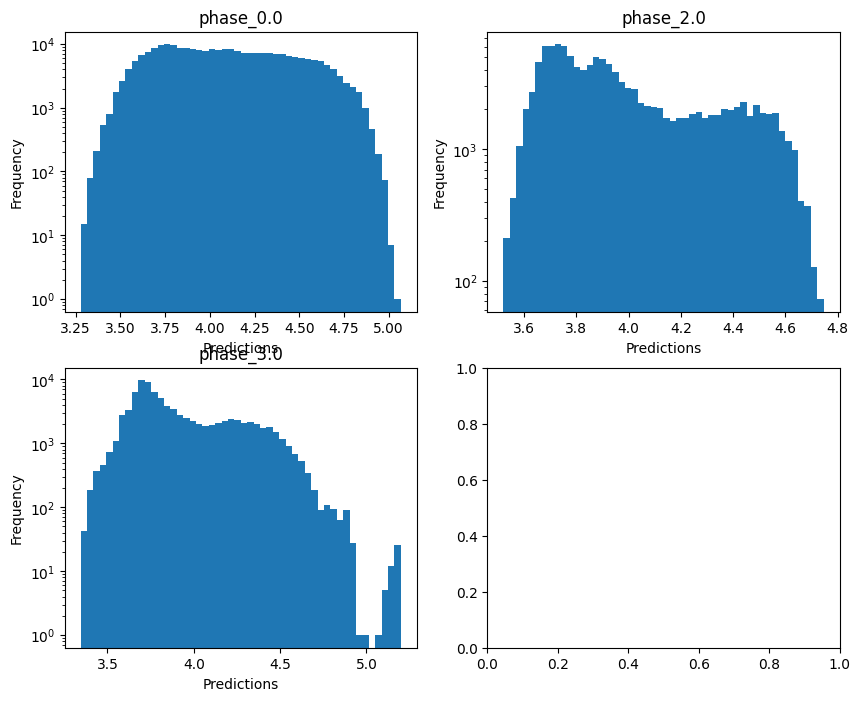


log_g results for the phase category with a value of 0.0
  value range :  -0.5967768342670462 - 5.433070637654307
  RVE :  0.49025894409040494
  RMSE :  0.4649117529193316
  MAE :  0.20104106069855235
  MedAE :  0.059643127633645765
  CORR :  0.8200690803715617
  MAX_ER :  4.558661632203128
  Percentiles : 
    75th percentile :  0.11366180539962534
    90th percentile :  0.5861546948770224
    95th percentile :  1.1761006745406208
    99th percentile :  1.9265071346384932

log_g results for the phase category with a value of 2.0
  value range :  -0.2959230723262505 - 4.408311770676233
  RVE :  0.4716115591167418
  RMSE :  0.6635495782457126
  MAE :  0.48823028737280516
  MedAE :  0.3440434519168942
  CORR :  0.686913766818218
  MAX_ER :  3.148588985637688
  Percentiles : 
    75th percentile :  0.6984275202168535
    90th percentile :  1.151733265375371
    95th percentile :  1.429235878547888
    99th percentile :  1.930362212015951

log_g results for the phase category with a value

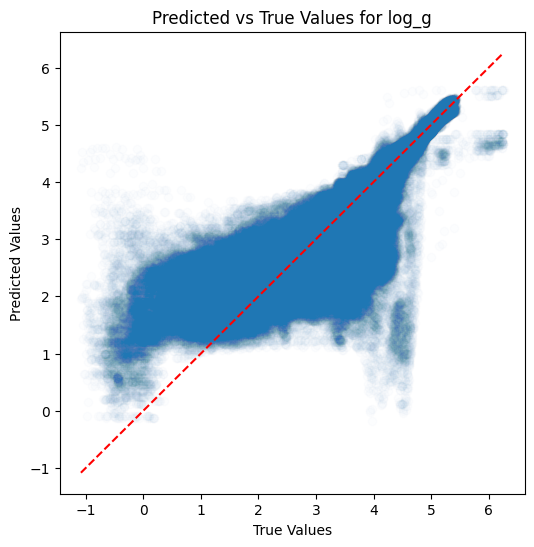

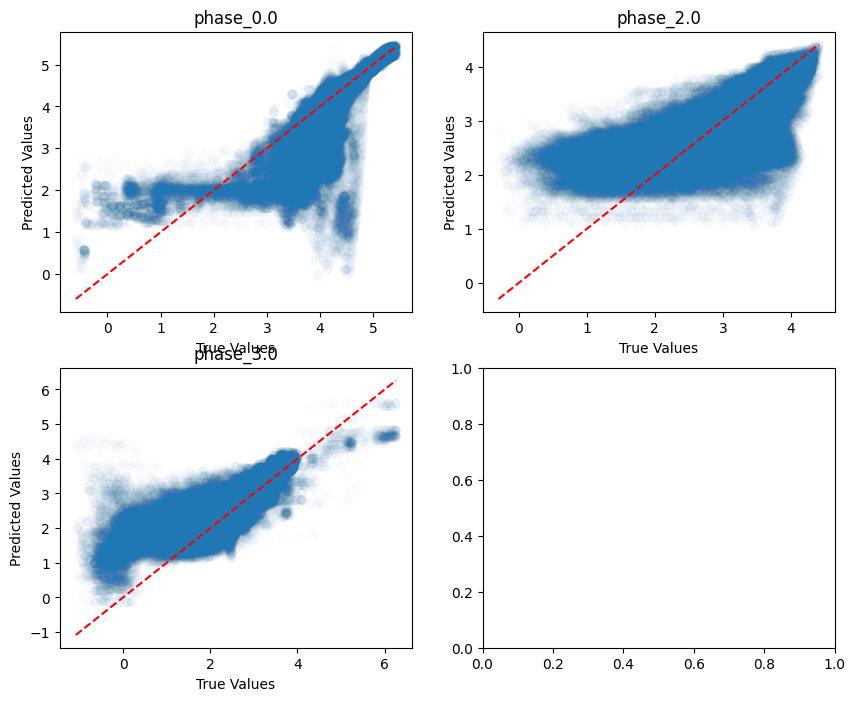

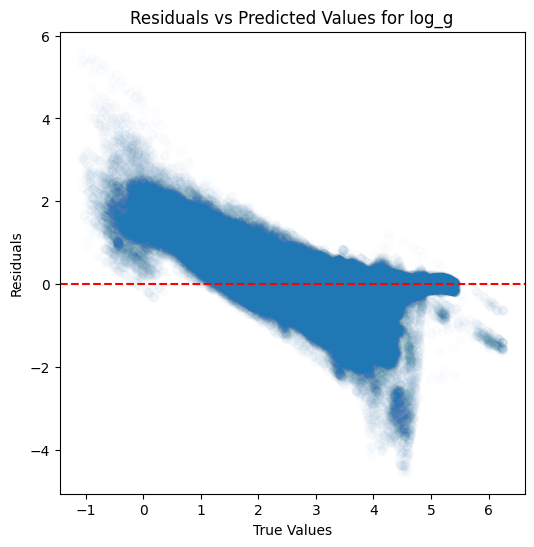

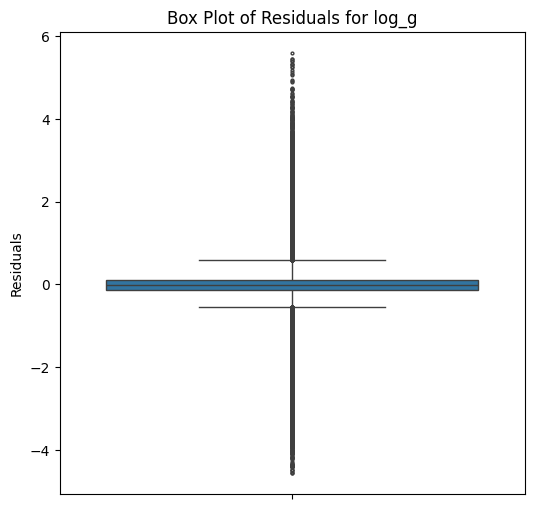

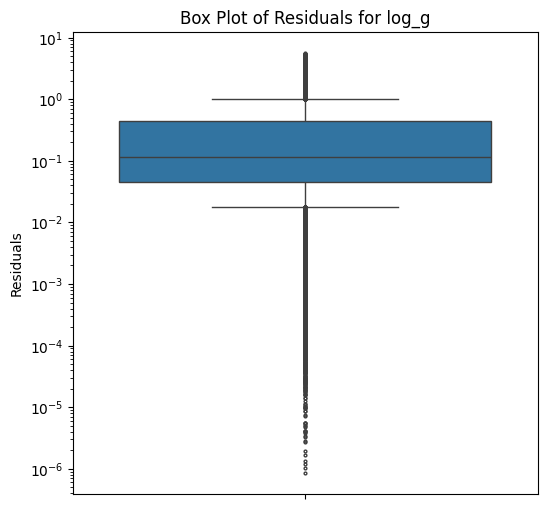

...

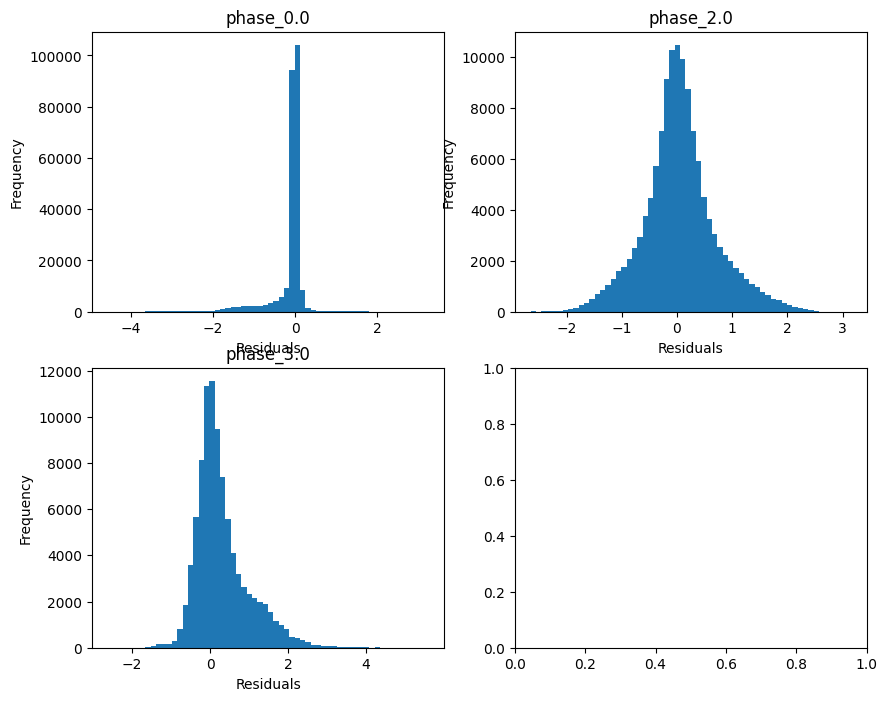

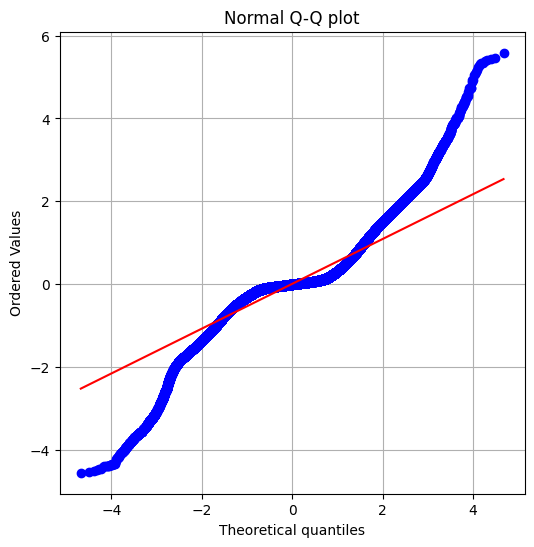

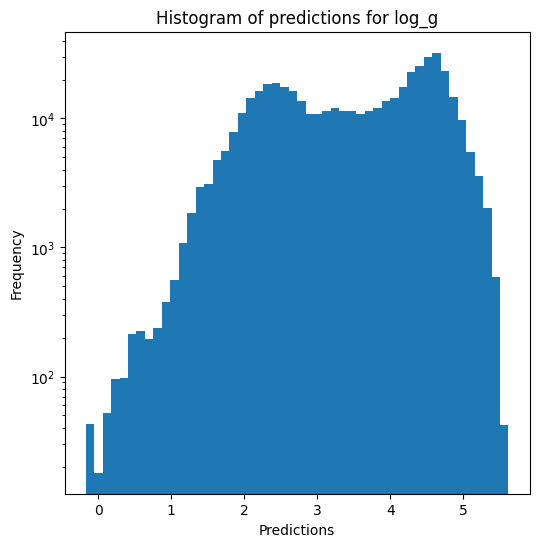

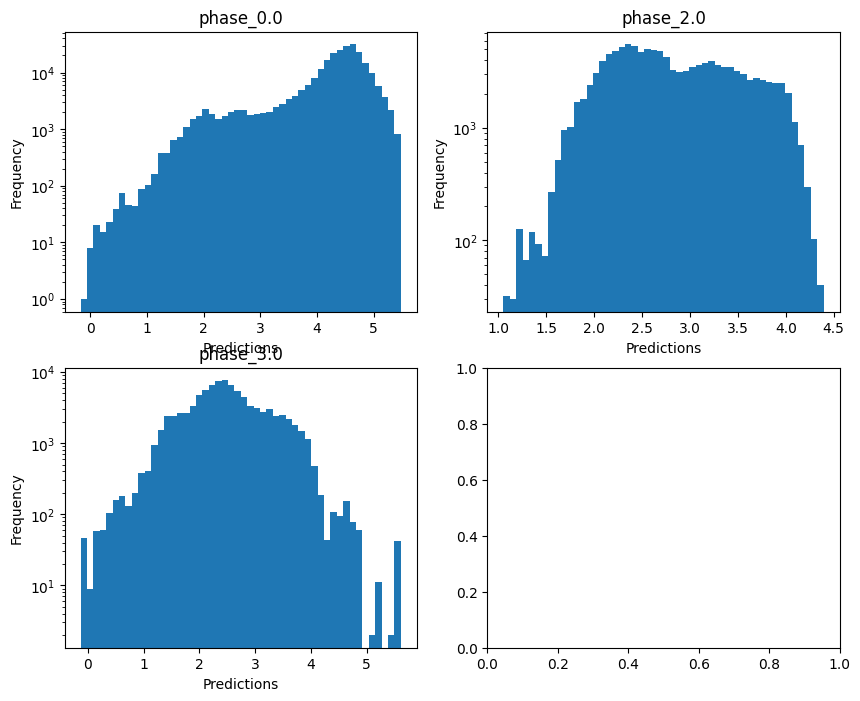

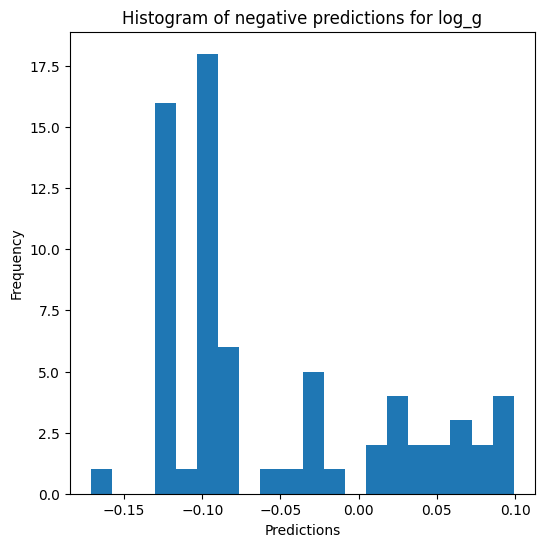


radius results for the phase category with a value of 0.0
  value range :  -0.9974628481553472 - 3.0827540579576227
  RVE :  0.8499263294366519
  RMSE :  0.2347742722844627
  MAE :  0.10325098180223424
  MedAE :  0.031693142562958194
  CORR :  0.9337537910429986
  MAX_ER :  2.3460847729694376
  Percentiles : 
    75th percentile :  0.06183762161033732
    90th percentile :  0.29710194399079676
    95th percentile :  0.5941118445659239
    99th percentile :  0.9700604725337149

radius results for the phase category with a value of 2.0
  value range :  0.0919862423867022 - 2.891706235288321
  RVE :  0.5451078196698185
  RMSE :  0.3315146177352741
  MAE :  0.24409940491015963
  MedAE :  0.17187518125289447
  CORR :  0.7404891488944191
  MAX_ER :  1.5575563366022105
  Percentiles : 
    75th percentile :  0.34949110716736925
    90th percentile :  0.5762102867453693
    95th percentile :  0.7136106794586167
    99th percentile :  0.9628264123888856

radius results for the phase category w

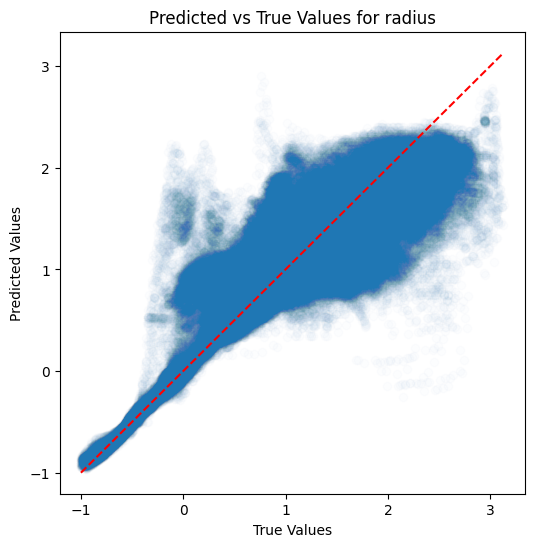

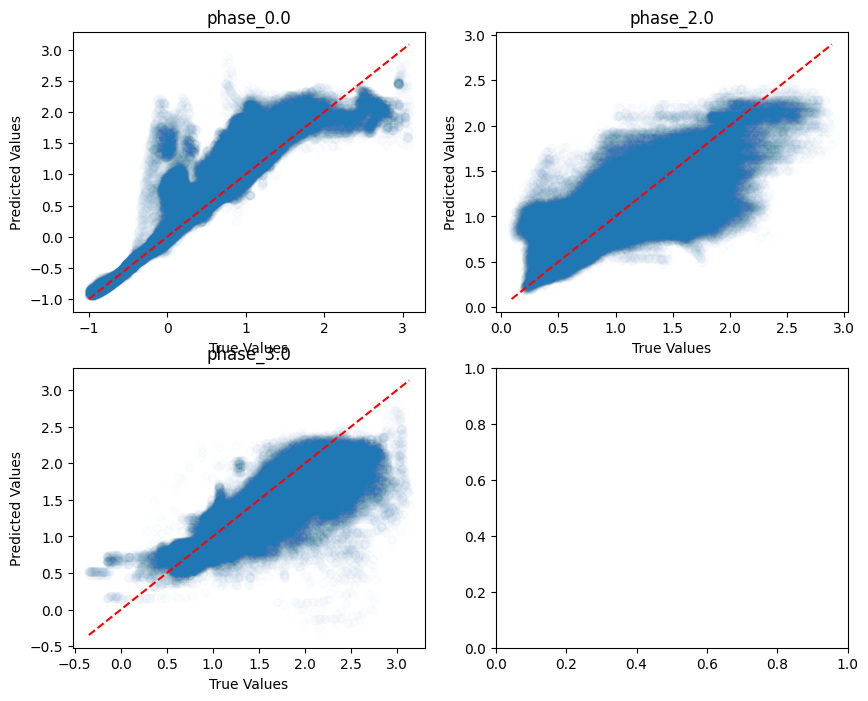

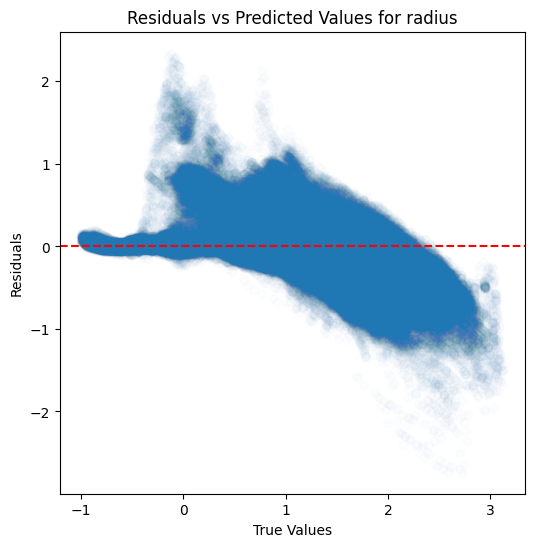

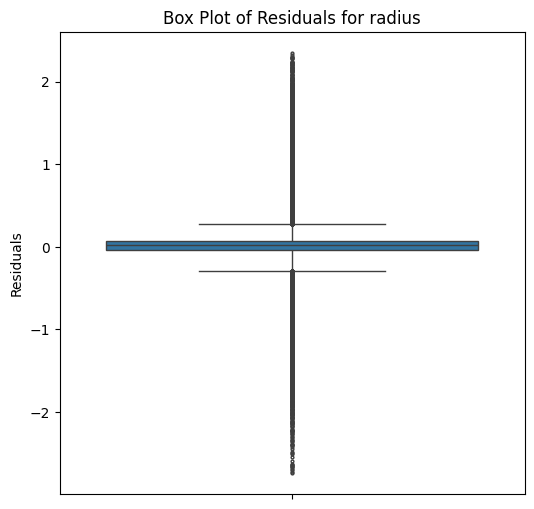

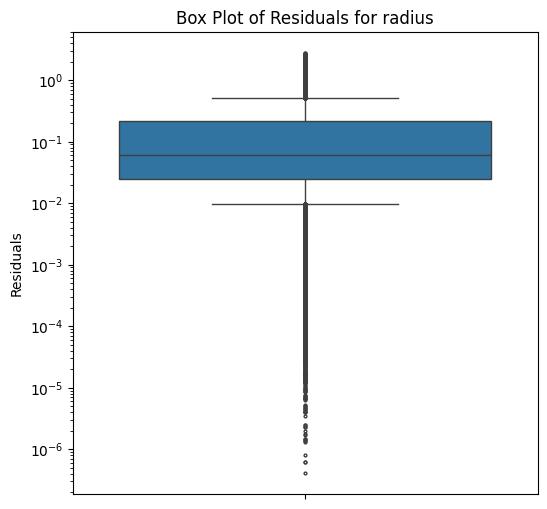

...

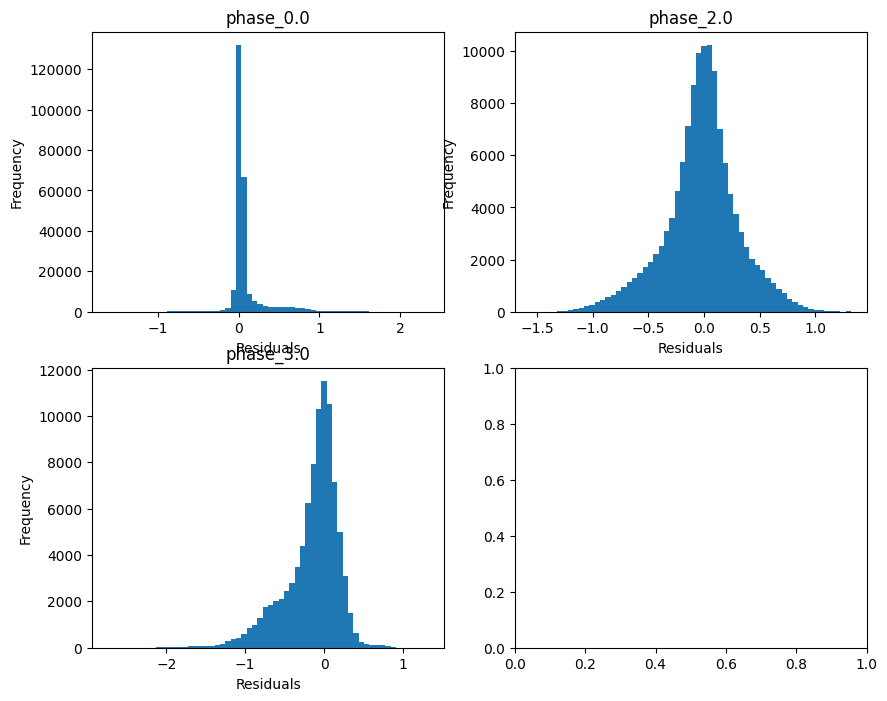

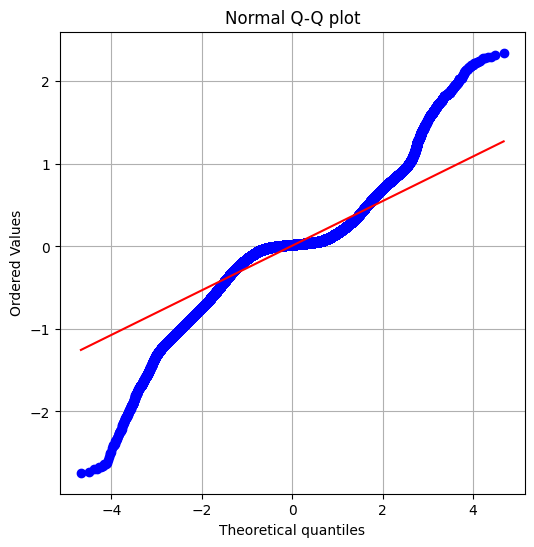

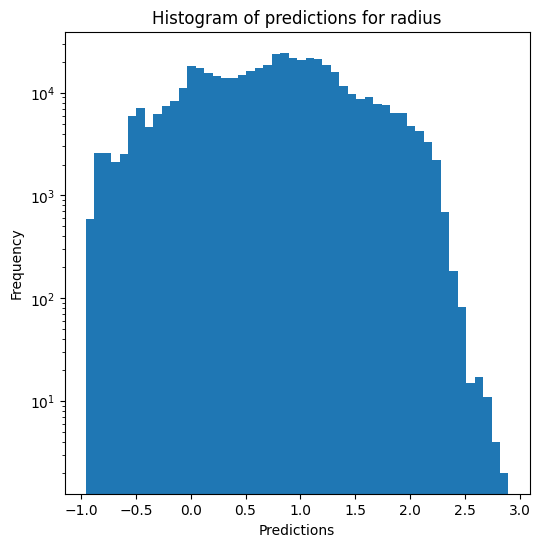

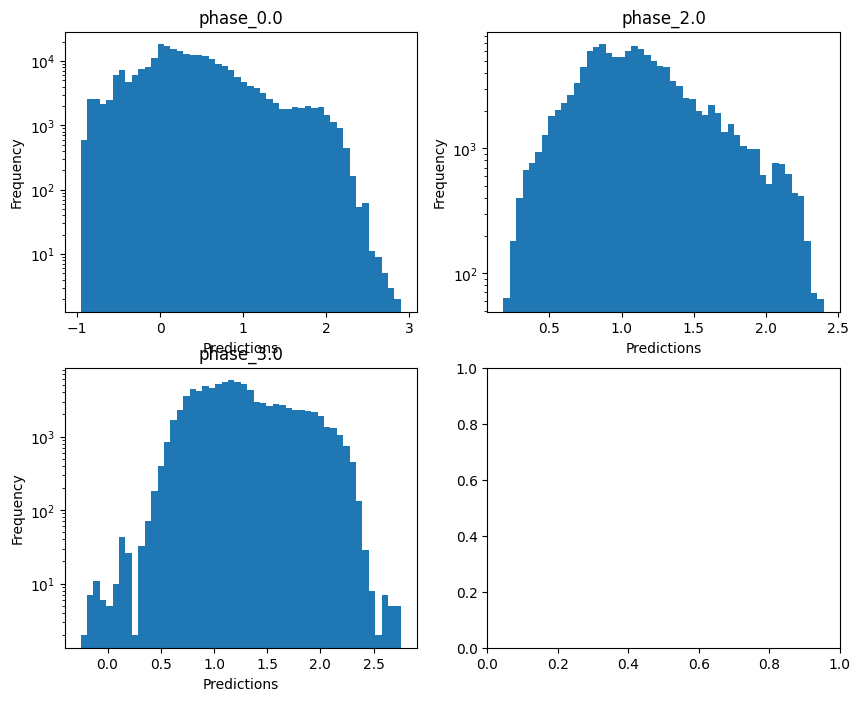

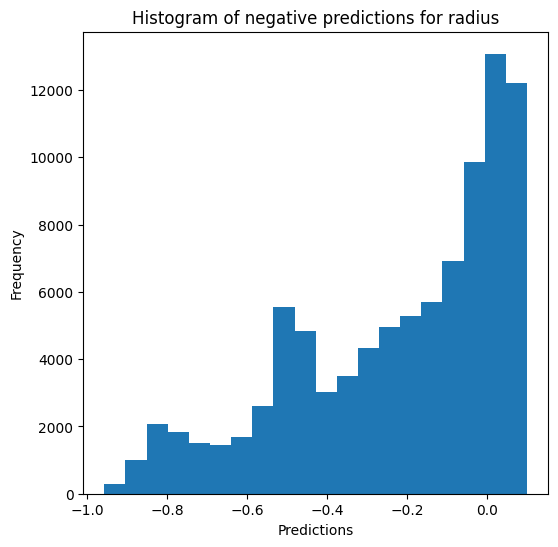

Saving predictions and results...


In [23]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon